# Imports


In [36]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
import torchvision.models as models
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import DataLoader, Subset
from torchvision.datasets import Flowers102
from scipy.fft import fft2, ifft2
import random
import pandas as pd
from torchinfo import summary

In [37]:
torch.manual_seed(42)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

# Functions

## Prepare Data

In [38]:
def load_data():
    transform_train = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    transform_test = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    trainset = Flowers102(root='./data', split='train', download=True, transform=transform_train)
    valset = Flowers102(root='./data', split='val', download=True, transform=transform_test)
    testset = Flowers102(root='./data', split='test', download=True, transform=transform_test)

    trainloader = DataLoader(trainset, batch_size=32, shuffle=True, num_workers=2,pin_memory=True)
    valloader = DataLoader(valset, batch_size=32, shuffle=False, num_workers=2)
    testloader = DataLoader(testset, batch_size=32, shuffle=False, num_workers=2)

    return trainloader, valloader, testloader

## Modify Model

### Set classification Layer

In [39]:
def modify_model(model, num_classes=102,num_layers=2):
    if num_layers==2:
        if isinstance(model, models.ResNet):
            # Remove the original fc layer
            num_features = model.fc.in_features
            model.fc = nn.Sequential(
                nn.Linear(num_features, 512),  # Hidden layer
                nn.ReLU(),
                nn.Dropout(0.5),  # Regularization to prevent overfitting
                nn.Linear(512, num_classes)  # Output layer
            )
        elif isinstance(model, models.DenseNet):
            # Remove the original classifier
            num_features = model.classifier.in_features
            model.classifier = nn.Sequential(
                nn.Linear(num_features, 512),  # Hidden layer
                nn.ReLU(),
                nn.Dropout(0.5),  # Regularization to prevent overfitting
                nn.Linear(512, num_classes)  # Output layer
            )
    elif num_layers==1:      
        if isinstance(model, models.ResNet):
            in_features = model.fc.in_features
            model.fc = nn.Linear(in_features, num_classes)
        elif isinstance(model, models.DenseNet):
            in_features = model.classifier.in_features
            model.classifier = nn.Linear(in_features, num_classes)
    return model

### Freeze Parameters

In [40]:
def set_trainable_layers(model, percent,diff):
    # Freeze all parameters initially
    for p in model.parameters():
        p.requires_grad = False

    if percent == "last":
        # Only make classifier trainable
        if isinstance(model, models.ResNet):
            classifier = model.fc
        elif isinstance(model, models.DenseNet):
            classifier = model.classifier
        else:
            raise ValueError("Unknown model type")
        for p in classifier.parameters():
            p.requires_grad = True
    else:
        # Percentage scenarios
        trainable_percent = int(percent[:-1])  # e.g., 80 for "80%"
        total_params = sum(p.numel() for p in model.parameters())
        target_frozen_params = ((100 - trainable_percent + diff) / 100) * total_params

        # Collect parameter-containing modules in execution order
        param_modules = []
        for name, module in model.named_modules():
            if isinstance(module, (nn.Conv2d, nn.BatchNorm2d, nn.Linear)):
                param_modules.append((name, module))

        # Group related layers (e.g., Conv2d followed by BatchNorm2d)
        grouped_modules = []
        i = 0
        while i < len(param_modules):
            name, module = param_modules[i]
            if isinstance(module, nn.Conv2d) and i + 1 < len(param_modules) and isinstance(param_modules[i + 1][1], nn.BatchNorm2d):
                grouped_modules.append((name, [module, param_modules[i + 1][1]]))
                i += 2
            else:
                grouped_modules.append((name, [module]))
                i += 1

        # Freeze modules until target is reached, then make subsequent modules trainable
        cumulative_frozen = 0
        make_trainable = False
        for name, modules in grouped_modules:
            module_params = sum(sum(p.numel() for p in m.parameters()) for m in modules)
            if make_trainable:
                # Make all subsequent modules trainable
                for module in modules:
                    for p in module.parameters():
                        p.requires_grad = True
            elif cumulative_frozen + module_params <= target_frozen_params:
                # Freeze this module
                for module in modules:
                    for p in module.parameters():
                        p.requires_grad = False
                cumulative_frozen += module_params
            else:
                # Make this module and all subsequent modules trainable
                for module in modules:
                    for p in module.parameters():
                        p.requires_grad = True
                make_trainable = True

### Differential Learning Rate



In [41]:
def get_parameter_groups(model, base_lr=0.001,ratio=100):
    if isinstance(model, models.ResNet):
        final_params = [p for p in model.fc.parameters() if p.requires_grad]
    elif isinstance(model, models.DenseNet):
        final_params = [p for p in model.classifier.parameters() if p.requires_grad]
    else:
        raise ValueError("Unknown model type")
    final_param_ids = set(id(p) for p in final_params)
    base_params = [p for p in model.parameters() if p.requires_grad and id(p) not in final_param_ids]
    return [
        {'params': base_params, 'lr': base_lr},
        {'params': final_params, 'lr': base_lr * ratio}
    ]


## Print Structure


In [42]:
def print_model_structure(model,base_lr,ratio):
    param_groups = get_parameter_groups(model,base_lr,ratio)
    group_lrs = [g['lr'] for g in param_groups]

    # print(f"\nModel Structure for {type(model).__name__}")
    # print("Layer Name | Parameters | Trainable | Learning Rate Group")
    # print("-" * 60)

    # for name, param in model.named_parameters():
    #     trainable = "Yes" if param.requires_grad else "No"
    #     group = "N/A"
    #     if param.requires_grad:
    #         for i, group_params in enumerate(param_groups):
    #             if any(id(param) == id(p) for p in group_params['params']):
    #                 group = f"Group {i+1} (lr={group_lrs[i]:.6f})"
    #                 break
    #     print(f"{name:30} | {param.numel():10d} | {trainable:10} | {group}")

    # Report totals
    for i, group in enumerate(param_groups):
        total_group_params = sum(p.numel() for p in group['params'])
        print(f"Total Trainable Parameters in Group {i+1}: {total_group_params:,}")
    total_frozen_params = sum(p.numel() for p in model.parameters() if not p.requires_grad)
    print(f"Total Frozen Parameters: {total_frozen_params:,}")

## Train

In [43]:
def train_model(model, trainloader, valloader, testloader,optimizer, num_epochs=40, patience=3, min_delta=0.001):
    criterion = nn.CrossEntropyLoss()
    optimizer = optimizer
    
    train_losses, val_losses, test_losses = [], [], []
    train_accuracies, val_accuracies, test_accuracies = [], [], []
    best_val_loss = float('inf')
    best_model_state = None
    early_stop_counter = 0
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0
        
        for inputs, labels in trainloader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
        
        train_loss = running_loss / len(trainloader)
        train_acc = 100 * correct / total
        train_losses.append(train_loss)
        train_accuracies.append(train_acc)
        
        # Evaluate on validation set
        model.eval()
        val_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for inputs, labels in valloader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
        
        val_loss /= len(valloader)
        val_acc = 100 * correct / total
        val_losses.append(val_loss)
        val_accuracies.append(val_acc)
        
        # Evaluate on test set
        test_loss = 0.0
        correct = 0
        total = 0
        with torch.no_grad():
            for inputs, labels in testloader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                test_loss += loss.item()
                _, predicted = torch.max(outputs.data, 1)
                total += labels.size(0)
                correct += (predicted == labels).sum().item()
        
        test_loss /= len(testloader)
        test_acc = 100 * correct / total
        test_losses.append(test_loss)
        test_accuracies.append(test_acc)
        
        print(f'Epoch {epoch+1}: Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%, '
              f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%, ')
              # f'Test Loss: {test_loss:.4f}, Test Acc: {test_acc:.2f}%')
        
        # Early stopping
        if val_loss < best_val_loss - min_delta:
            best_val_loss = val_loss
            best_model_state = model.state_dict()
            early_stop_counter = 0
        else:
            early_stop_counter += 1
            if early_stop_counter >= patience:
                print(f'Early stopping triggered after epoch {epoch+1}')
                break
    
    # Restore best model
    if best_model_state is not None:
        model.load_state_dict(best_model_state)
    
    return train_losses, train_accuracies, val_losses, val_accuracies, test_losses, test_accuracies    

## Eval

In [44]:
def evaluate_model(model, testloader):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in testloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    test_acc = 100 * correct / total
    return test_acc

## Plots

In [45]:
def plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies, title):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Val Loss')
    plt.title(f'{title} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label='Train Accuracy')
    plt.plot(val_accuracies, label='Val Accuracy')
    plt.title(f'{title} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.savefig(f'{title.lower().replace(" ", "_")}.png')
    plt.show()
    plt.close()
    
def plot_metrics2(train_losses, train_accuracies,  test_losses, test_accuracies, title):
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.title(f'{title} - Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    
    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label='Train Accuracy')
    plt.plot(test_accuracies, label='Test Accuracy')
    plt.title(f'{title} - Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy (%)')
    plt.legend()
    plt.grid(True)
    
    plt.tight_layout()
    plt.savefig(f'{title.lower().replace(" ", "_")}.png')
    plt.show()
    plt.close()    

# Phase 1

In [46]:
trainloader, valloader, testloader= load_data()


## ResNet

### 80% trainable

#### Hyper parameter tuning


Training ResNet-18 with 80% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=SGD


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 4.4187, Train Acc: 6.86%, Val Loss: 3.3202, Val Acc: 31.08%
Epoch 2: Train Loss: 2.2674, Train Acc: 58.92%, Val Loss: 1.6034, Val Acc: 71.37%
Epoch 3: Train Loss: 0.9454, Train Acc: 89.51%, Val Loss: 1.1130, Val Acc: 78.24%
Epoch 4: Train Loss: 0.4896, Train Acc: 95.78%, Val Loss: 0.8817, Val Acc: 82.16%
Epoch 5: Train Loss: 0.3007, Train Acc: 98.43%, Val Loss: 0.7752, Val Acc: 84.90%
Epoch 6: Train Loss: 0.2015, Train Acc: 99.31%, Val Loss: 0.6950, Val Acc: 86.76%
Epoch 7: Train Loss: 0.1447, Train Acc: 99.31%, Val Loss: 0.6518, Val Acc: 86.86%
Epoch 8: Train Loss: 0.1112, Train Acc: 99.90%, Val Loss: 0.6133, Val Acc: 87.65%
Epoch 9: Train Loss: 0.0883, Train Acc: 99.80%, Val Loss: 0.5997, Val Acc: 87.75%
Epoch 10: Train Loss: 0.0765, Train Acc: 99.90%, Val Loss: 0.5809, Val Acc: 87.75%
Epoch 11: Train Loss: 0.0634, Train Acc: 100.00%, 

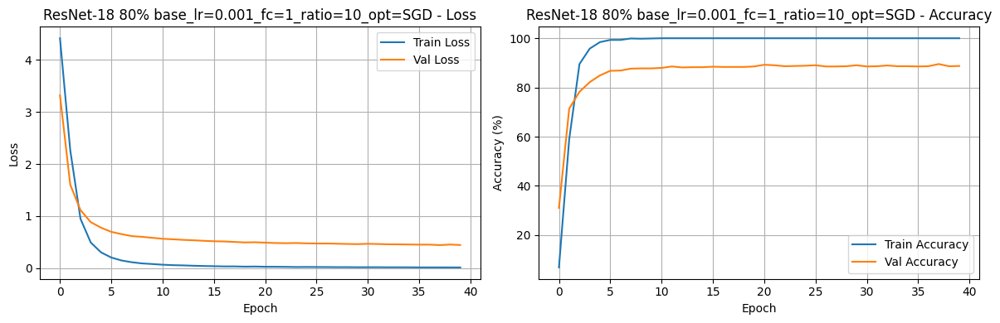


Training ResNet-18 with 80% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 5.1292, Train Acc: 19.12%, Val Loss: 3.4327, Val Acc: 38.92%
Epoch 2: Train Loss: 1.3933, Train Acc: 64.41%, Val Loss: 1.4775, Val Acc: 65.88%
Epoch 3: Train Loss: 0.7459, Train Acc: 79.90%, Val Loss: 1.5875, Val Acc: 64.51%
Epoch 4: Train Loss: 0.6250, Train Acc: 84.61%, Val Loss: 1.7115, Val Acc: 67.75%
Epoch 5: Train Loss: 0.4380, Train Acc: 88.43%, Val Loss: 1.3947, Val Acc: 68.53%
Epoch 6: Train Loss: 0.3346, Train Acc: 90.00%, Val Loss: 1.4999, Val Acc: 70.39%
Epoch 7: Train Loss: 0.3143, Train Acc: 91.67%, Val Loss: 1.2284, Val Acc: 73.53%
Epoch 8: Train Loss: 0.3734, Train Acc: 90.39%, Val Loss: 1.4192, Val Acc: 70.10%
Epoch 9: Train Loss: 0.6149, Train Acc: 88.04%, Val Loss: 2.4834, Val Acc: 65.98%
Epoch 10: Train Loss: 0.5541

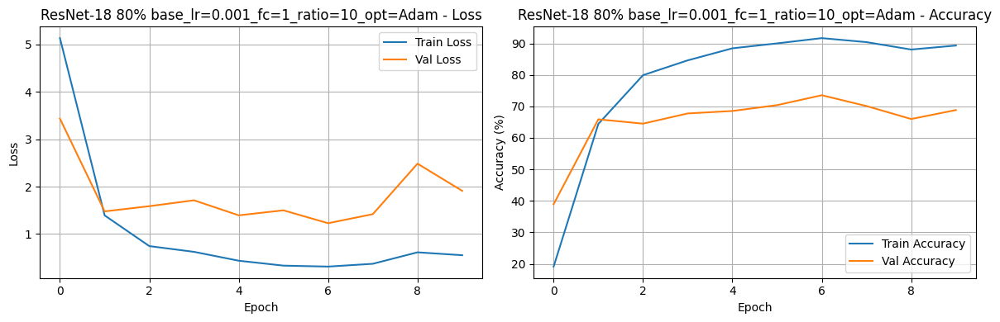


Training ResNet-18 with 80% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 5.9767, Train Acc: 22.55%, Val Loss: 5.8426, Val Acc: 50.59%
Epoch 2: Train Loss: 2.2266, Train Acc: 75.29%, Val Loss: 2.1215, Val Acc: 65.78%
Epoch 3: Train Loss: 0.6861, Train Acc: 87.16%, Val Loss: 1.5231, Val Acc: 73.82%
Epoch 4: Train Loss: 0.2604, Train Acc: 95.20%, Val Loss: 1.1081, Val Acc: 78.73%
Epoch 5: Train Loss: 0.1132, Train Acc: 97.35%, Val Loss: 1.1078, Val Acc: 79.12%
Epoch 6: Train Loss: 0.0614, Train Acc: 98.24%, Val Loss: 0.9481, Val Acc: 79.80%
Epoch 7: Train Loss: 0.0521, Train Acc: 98.43%, Val Loss: 1.2445, Val Acc: 78.24%
Epoch 8: Train Loss: 0.0502, Train Acc: 99.22%, Val Loss: 0.8162, Val Acc: 83.04%
Epoch 9: Train Loss: 0.0135, Train Acc: 99.51%, Val Loss: 0.7849, Val Acc: 83.82%
Epoch 10: Train Loss: 0.0113

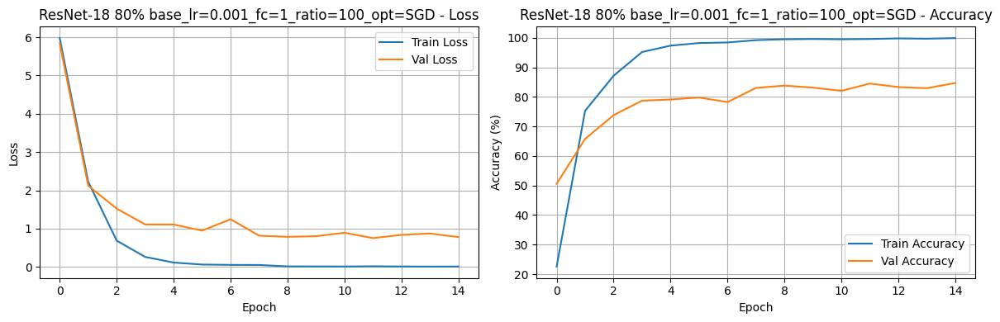


Training ResNet-18 with 80% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 49.8604, Train Acc: 1.76%, Val Loss: 55.4607, Val Acc: 0.69%
Epoch 2: Train Loss: 23.5986, Train Acc: 3.33%, Val Loss: 27.6082, Val Acc: 4.90%
Epoch 3: Train Loss: 22.4007, Train Acc: 2.06%, Val Loss: 13.6994, Val Acc: 4.02%
Epoch 4: Train Loss: 24.2893, Train Acc: 2.55%, Val Loss: 27.0583, Val Acc: 3.43%
Epoch 5: Train Loss: 23.0566, Train Acc: 4.12%, Val Loss: 35.9574, Val Acc: 5.59%
Epoch 6: Train Loss: 25.4977, Train Acc: 5.69%, Val Loss: 43.4844, Val Acc: 5.10%
Early stopping triggered after epoch 6
Test Accuracy: 4.10%


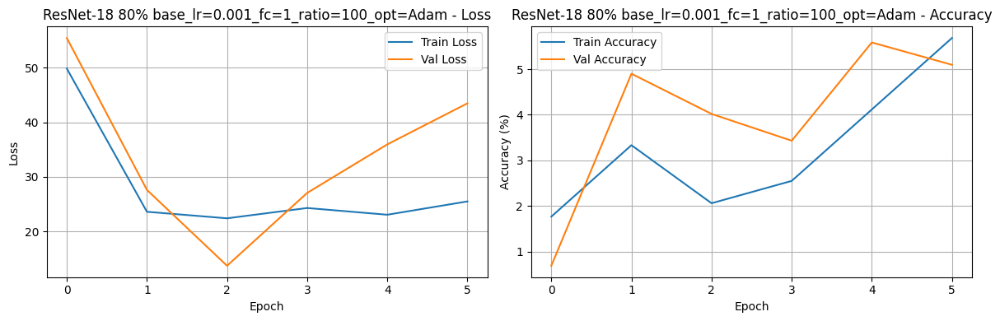


Training ResNet-18 with 80% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 4.6023, Train Acc: 2.55%, Val Loss: 4.2863, Val Acc: 19.02%
Epoch 2: Train Loss: 4.0301, Train Acc: 16.18%, Val Loss: 3.4917, Val Acc: 36.18%
Epoch 3: Train Loss: 3.0085, Train Acc: 35.49%, Val Loss: 2.3690, Val Acc: 52.25%
Epoch 4: Train Loss: 1.9646, Train Acc: 53.92%, Val Loss: 1.5866, Val Acc: 66.57%
Epoch 5: Train Loss: 1.2735, Train Acc: 69.51%, Val Loss: 1.1804, Val Acc: 72.35%
Epoch 6: Train Loss: 0.8844, Train Acc: 79.51%, Val Loss: 0.9931, Val Acc: 76.37%
Epoch 7: Train Loss: 0.6647, Train Acc: 84.61%, Val Loss: 0.7848, Val Acc: 80.78%
Epoch 8: Train Loss: 0.4926, Train Acc: 87.84%, Val Loss: 0.7121, Val Acc: 81.96%
Epoch 9: Train Loss: 0.3176, Train Acc: 93.92%, Val Loss: 0.6326, Val Acc: 84.02%
Epoch 10: Train Loss: 0.2447,

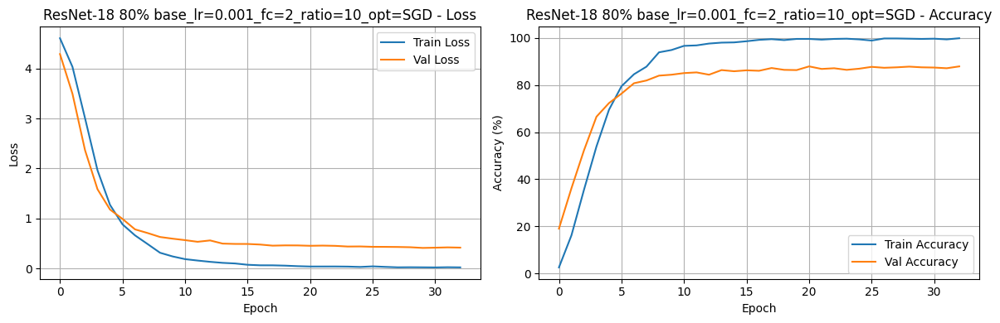


Training ResNet-18 with 80% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 5.3107, Train Acc: 2.25%, Val Loss: 4.5872, Val Acc: 2.06%
Epoch 2: Train Loss: 4.5700, Train Acc: 1.27%, Val Loss: 4.4200, Val Acc: 2.55%
Epoch 3: Train Loss: 4.5171, Train Acc: 2.16%, Val Loss: 4.3450, Val Acc: 3.24%
Epoch 4: Train Loss: 4.4705, Train Acc: 1.86%, Val Loss: 4.3512, Val Acc: 3.14%
Epoch 5: Train Loss: 4.4260, Train Acc: 1.47%, Val Loss: 4.2554, Val Acc: 3.73%
Epoch 6: Train Loss: 4.4051, Train Acc: 1.37%, Val Loss: 4.1503, Val Acc: 2.65%
Epoch 7: Train Loss: 4.3752, Train Acc: 1.76%, Val Loss: 4.1361, Val Acc: 3.33%
Epoch 8: Train Loss: 4.3898, Train Acc: 1.57%, Val Loss: 4.1212, Val Acc: 3.14%
Epoch 9: Train Loss: 4.3532, Train Acc: 1.37%, Val Loss: 4.2070, Val Acc: 3.04%
Epoch 10: Train Loss: 4.3910, Train Acc: 2.35

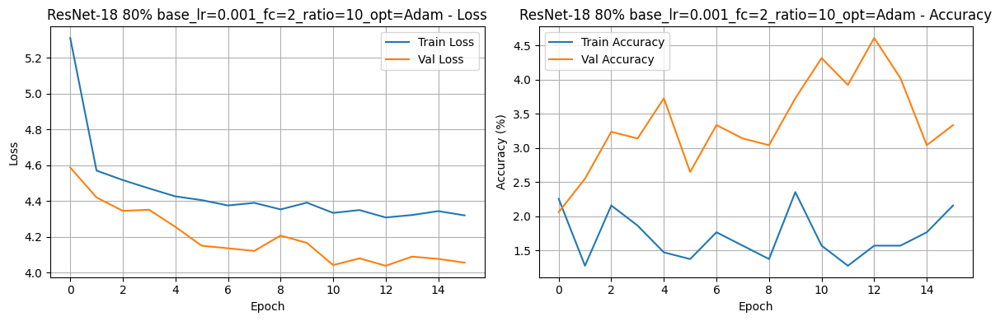


Training ResNet-18 with 80% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 4.6198, Train Acc: 3.73%, Val Loss: 4.1149, Val Acc: 8.92%
Epoch 2: Train Loss: 4.3379, Train Acc: 6.76%, Val Loss: 4.1276, Val Acc: 9.22%
Epoch 3: Train Loss: 4.4665, Train Acc: 5.29%, Val Loss: 4.3834, Val Acc: 6.18%
Epoch 4: Train Loss: 4.4943, Train Acc: 3.24%, Val Loss: 4.4001, Val Acc: 4.31%
Early stopping triggered after epoch 4
Test Accuracy: 4.16%


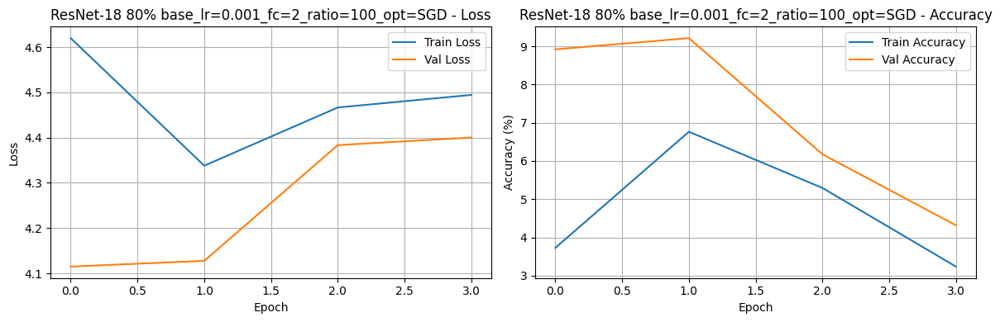


Training ResNet-18 with 80% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 55.3348, Train Acc: 0.49%, Val Loss: 4.6431, Val Acc: 0.98%
Epoch 2: Train Loss: 4.6804, Train Acc: 0.59%, Val Loss: 4.6328, Val Acc: 0.98%
Epoch 3: Train Loss: 4.6720, Train Acc: 0.29%, Val Loss: 4.6304, Val Acc: 0.98%
Epoch 4: Train Loss: 4.6730, Train Acc: 0.49%, Val Loss: 4.6299, Val Acc: 0.98%
Epoch 5: Train Loss: 4.6747, Train Acc: 0.59%, Val Loss: 4.6301, Val Acc: 0.98%
Epoch 6: Train Loss: 4.6738, Train Acc: 0.59%, Val Loss: 4.6295, Val Acc: 0.98%
Early stopping triggered after epoch 6
Test Accuracy: 0.47%


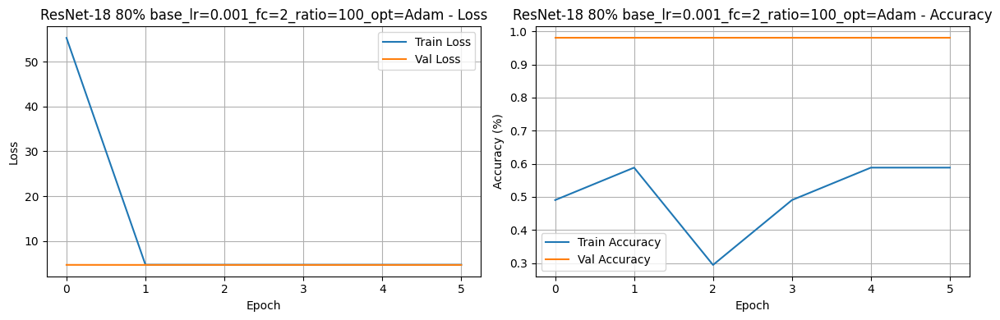


Training ResNet-18 with 80% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 4.7586, Train Acc: 1.08%, Val Loss: 4.5293, Val Acc: 2.84%
Epoch 2: Train Loss: 4.4084, Train Acc: 5.39%, Val Loss: 4.2652, Val Acc: 8.63%
Epoch 3: Train Loss: 4.1203, Train Acc: 14.22%, Val Loss: 4.0224, Val Acc: 20.69%
Epoch 4: Train Loss: 3.8367, Train Acc: 30.69%, Val Loss: 3.7858, Val Acc: 32.35%
Epoch 5: Train Loss: 3.5493, Train Acc: 45.88%, Val Loss: 3.5498, Val Acc: 41.47%
Epoch 6: Train Loss: 3.2922, Train Acc: 56.76%, Val Loss: 3.3200, Val Acc: 50.98%
Epoch 7: Train Loss: 3.0299, Train Acc: 66.18%, Val Loss: 3.1124, Val Acc: 56.18%
Epoch 8: Train Loss: 2.7755, Train Acc: 73.24%, Val Loss: 2.8991, Val Acc: 60.69%
Epoch 9: Train Loss: 2.5415, Train Acc: 79.22%, Val Loss: 2.7032, Val Acc: 65.78%
Epoch 10: Train Loss: 2.3261, Tr

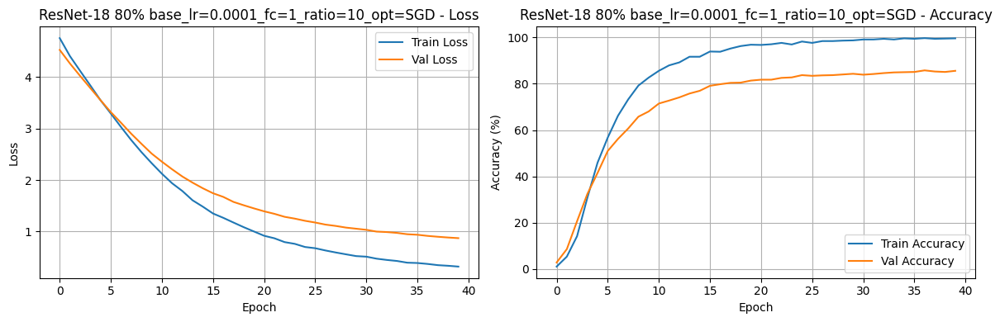


Training ResNet-18 with 80% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 4.1219, Train Acc: 18.33%, Val Loss: 2.6183, Val Acc: 56.86%
Epoch 2: Train Loss: 1.6319, Train Acc: 84.12%, Val Loss: 1.4250, Val Acc: 77.16%
Epoch 3: Train Loss: 0.6189, Train Acc: 97.25%, Val Loss: 0.9878, Val Acc: 86.08%
Epoch 4: Train Loss: 0.2665, Train Acc: 99.31%, Val Loss: 0.8027, Val Acc: 86.57%
Epoch 5: Train Loss: 0.1289, Train Acc: 99.80%, Val Loss: 0.6705, Val Acc: 88.92%
Epoch 6: Train Loss: 0.0753, Train Acc: 100.00%, Val Loss: 0.6312, Val Acc: 89.51%
Epoch 7: Train Loss: 0.0535, Train Acc: 99.90%, Val Loss: 0.6041, Val Acc: 89.51%
Epoch 8: Train Loss: 0.0349, Train Acc: 100.00%, Val Loss: 0.5623, Val Acc: 90.59%
Epoch 9: Train Loss: 0.0270, Train Acc: 100.00%, Val Loss: 0.5397, Val Acc: 90.98%
Epoch 10: Train Loss: 0.

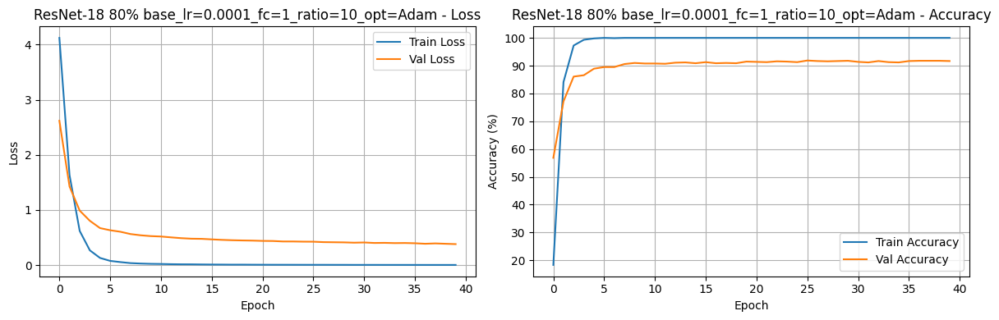


Training ResNet-18 with 80% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 4.4857, Train Acc: 7.35%, Val Loss: 3.4962, Val Acc: 26.76%
Epoch 2: Train Loss: 2.6263, Train Acc: 50.00%, Val Loss: 2.1985, Val Acc: 60.20%
Epoch 3: Train Loss: 1.3742, Train Acc: 82.35%, Val Loss: 1.4552, Val Acc: 74.61%
Epoch 4: Train Loss: 0.8196, Train Acc: 90.29%, Val Loss: 1.1832, Val Acc: 76.57%
Epoch 5: Train Loss: 0.5323, Train Acc: 95.78%, Val Loss: 1.0081, Val Acc: 80.00%
Epoch 6: Train Loss: 0.3953, Train Acc: 97.94%, Val Loss: 0.9153, Val Acc: 82.06%
Epoch 7: Train Loss: 0.2916, Train Acc: 98.82%, Val Loss: 0.8458, Val Acc: 82.25%
Epoch 8: Train Loss: 0.2462, Train Acc: 99.22%, Val Loss: 0.7985, Val Acc: 83.63%
Epoch 9: Train Loss: 0.1984, Train Acc: 99.51%, Val Loss: 0.7788, Val Acc: 83.24%
Epoch 10: Train Loss: 0.1632

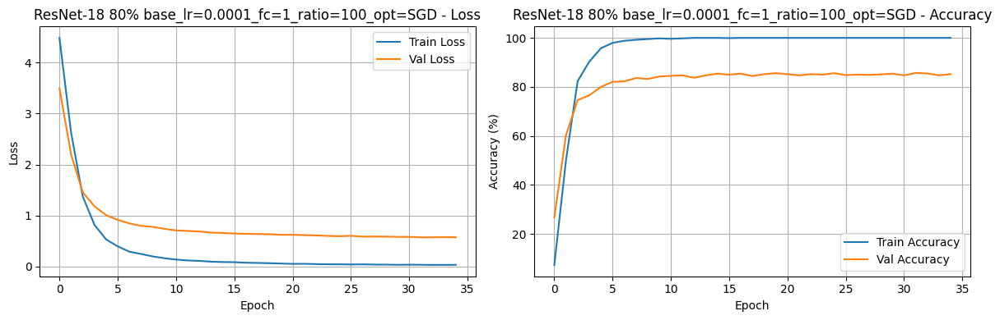


Training ResNet-18 with 80% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 5.4279, Train Acc: 22.55%, Val Loss: 1.7719, Val Acc: 61.57%
Epoch 2: Train Loss: 0.5924, Train Acc: 85.78%, Val Loss: 0.9655, Val Acc: 74.80%
Epoch 3: Train Loss: 0.1717, Train Acc: 95.39%, Val Loss: 0.7274, Val Acc: 79.51%
Epoch 4: Train Loss: 0.0390, Train Acc: 99.61%, Val Loss: 0.5326, Val Acc: 85.69%
Epoch 5: Train Loss: 0.0196, Train Acc: 99.71%, Val Loss: 0.5376, Val Acc: 87.16%
Epoch 6: Train Loss: 0.0178, Train Acc: 99.61%, Val Loss: 0.4532, Val Acc: 87.75%
Epoch 7: Train Loss: 0.0076, Train Acc: 99.90%, Val Loss: 0.4714, Val Acc: 88.14%
Epoch 8: Train Loss: 0.0051, Train Acc: 100.00%, Val Loss: 0.4407, Val Acc: 88.04%
Epoch 9: Train Loss: 0.0028, Train Acc: 100.00%, Val Loss: 0.4144, Val Acc: 89.12%
Epoch 10: Train Loss: 0.

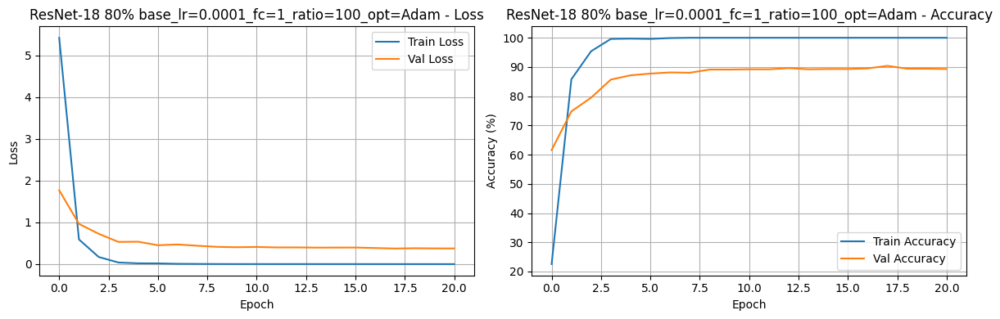


Training ResNet-18 with 80% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 4.6637, Train Acc: 1.27%, Val Loss: 4.5967, Val Acc: 1.18%
Epoch 2: Train Loss: 4.5842, Train Acc: 1.76%, Val Loss: 4.5336, Val Acc: 3.24%
Epoch 3: Train Loss: 4.5134, Train Acc: 2.65%, Val Loss: 4.4723, Val Acc: 6.96%
Epoch 4: Train Loss: 4.4366, Train Acc: 5.69%, Val Loss: 4.4127, Val Acc: 11.67%
Epoch 5: Train Loss: 4.3743, Train Acc: 6.86%, Val Loss: 4.3458, Val Acc: 20.29%
Epoch 6: Train Loss: 4.2756, Train Acc: 12.94%, Val Loss: 4.2683, Val Acc: 26.47%
Epoch 7: Train Loss: 4.2052, Train Acc: 16.37%, Val Loss: 4.1876, Val Acc: 30.88%
Epoch 8: Train Loss: 4.0849, Train Acc: 22.25%, Val Loss: 4.0959, Val Acc: 37.35%
Epoch 9: Train Loss: 3.9647, Train Acc: 27.65%, Val Loss: 3.9867, Val Acc: 43.04%
Epoch 10: Train Loss: 3.8943, Train

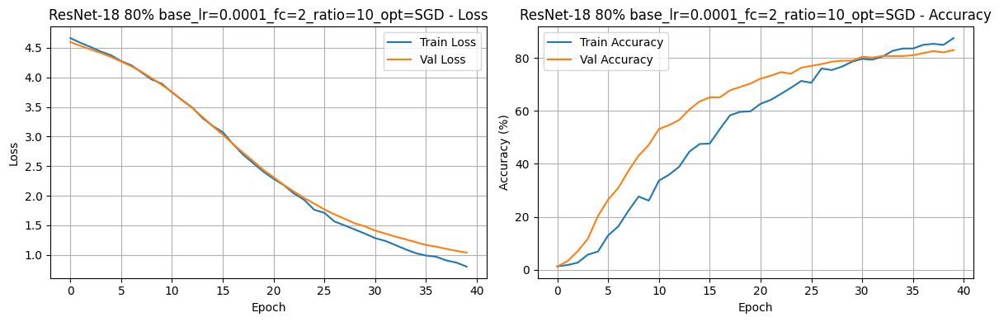


Training ResNet-18 with 80% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 4.5148, Train Acc: 6.18%, Val Loss: 3.8347, Val Acc: 41.27%
Epoch 2: Train Loss: 3.1765, Train Acc: 30.69%, Val Loss: 2.1932, Val Acc: 53.82%
Epoch 3: Train Loss: 1.7162, Train Acc: 60.98%, Val Loss: 1.3003, Val Acc: 74.22%
Epoch 4: Train Loss: 0.9440, Train Acc: 77.84%, Val Loss: 0.9204, Val Acc: 80.98%
Epoch 5: Train Loss: 0.5199, Train Acc: 89.02%, Val Loss: 0.6925, Val Acc: 85.00%
Epoch 6: Train Loss: 0.2668, Train Acc: 95.98%, Val Loss: 0.6219, Val Acc: 85.10%
Epoch 7: Train Loss: 0.1745, Train Acc: 97.45%, Val Loss: 0.5534, Val Acc: 85.98%
Epoch 8: Train Loss: 0.1154, Train Acc: 98.04%, Val Loss: 0.4998, Val Acc: 88.24%
Epoch 9: Train Loss: 0.0747, Train Acc: 99.12%, Val Loss: 0.4928, Val Acc: 86.86%
Epoch 10: Train Loss: 0.064

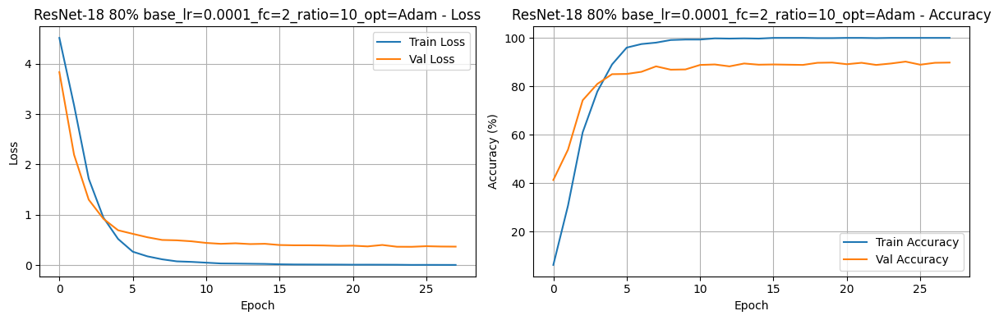


Training ResNet-18 with 80% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 4.6159, Train Acc: 2.25%, Val Loss: 4.3136, Val Acc: 15.00%
Epoch 2: Train Loss: 4.0698, Train Acc: 14.71%, Val Loss: 3.6041, Val Acc: 40.49%
Epoch 3: Train Loss: 3.2546, Train Acc: 30.49%, Val Loss: 2.7575, Val Acc: 48.82%
Epoch 4: Train Loss: 2.3609, Train Acc: 47.06%, Val Loss: 2.0232, Val Acc: 61.08%
Epoch 5: Train Loss: 1.7491, Train Acc: 58.24%, Val Loss: 1.5374, Val Acc: 65.59%
Epoch 6: Train Loss: 1.2998, Train Acc: 69.12%, Val Loss: 1.2748, Val Acc: 70.78%
Epoch 7: Train Loss: 1.0063, Train Acc: 75.20%, Val Loss: 1.1029, Val Acc: 73.63%
Epoch 8: Train Loss: 0.8021, Train Acc: 80.49%, Val Loss: 0.9824, Val Acc: 74.90%
Epoch 9: Train Loss: 0.6638, Train Acc: 82.55%, Val Loss: 0.8655, Val Acc: 78.82%
Epoch 10: Train Loss: 0.532

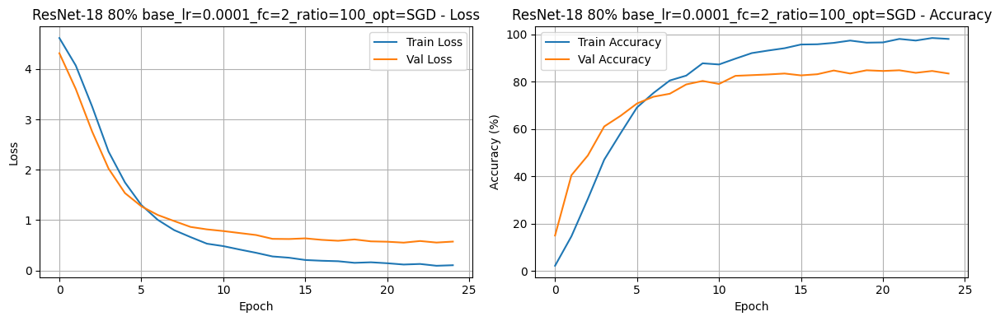


Training ResNet-18 with 80% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 8,984,064
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 2,192,448
Epoch 1: Train Loss: 5.4995, Train Acc: 0.78%, Val Loss: 4.5480, Val Acc: 2.65%
Epoch 2: Train Loss: 4.5048, Train Acc: 3.14%, Val Loss: 4.3801, Val Acc: 5.59%
Epoch 3: Train Loss: 4.3767, Train Acc: 3.82%, Val Loss: 4.0794, Val Acc: 7.75%
Epoch 4: Train Loss: 4.2669, Train Acc: 4.80%, Val Loss: 3.8680, Val Acc: 10.88%
Epoch 5: Train Loss: 4.2488, Train Acc: 4.61%, Val Loss: 3.7800, Val Acc: 9.22%
Epoch 6: Train Loss: 4.1647, Train Acc: 5.78%, Val Loss: 3.8309, Val Acc: 12.35%
Epoch 7: Train Loss: 4.1283, Train Acc: 5.39%, Val Loss: 3.6839, Val Acc: 13.04%
Epoch 8: Train Loss: 4.1567, Train Acc: 6.18%, Val Loss: 3.6560, Val Acc: 11.96%
Epoch 9: Train Loss: 4.0525, Train Acc: 5.59%, Val Loss: 3.5407, Val Acc: 15.69%
Epoch 10: Train Loss: 4.0109, Train Ac

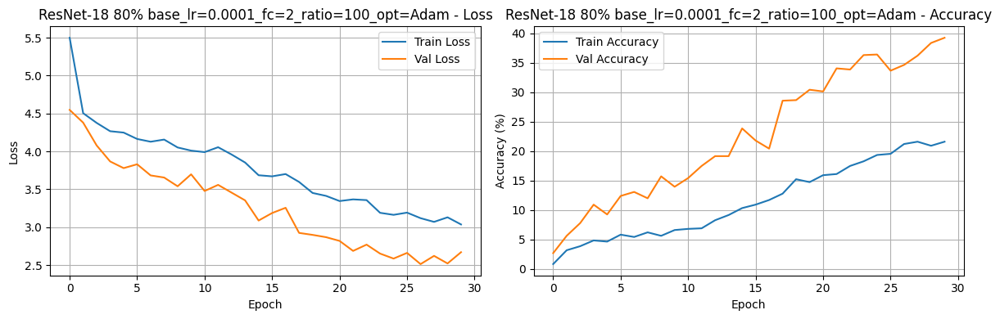

,base_lr,ratio,fc_layers,optimizer,final_val_accuracy,test_accuracy,final_train_loss,final_train_accuracy,final_val_loss
0,0.0010,10,1,SGD,88.725490,86.827126,0.011383,100.000000,0.442579
1,0.0010,10,1,Adam,68.823529,64.856074,0.554052,89.313725,1.910694
2,0.0010,100,1,SGD,84.705882,83.753456,0.009749,99.901961,0.778865
3,0.0010,100,1,Adam,5.098039,4.098227,25.497746,5.686275,43.484393
4,0.0010,10,2,SGD,87.941176,86.013986,0.025879,99.901961,0.420231
5,0.0010,10,2,Adam,3.333333,4.602374,4.319974,2.156863,4.055949
6,0.0010,100,2,SGD,4.313725,4.163279,4.494278,3.235294,4.400079
7,0.0010,100,2,Adam,0.980392,0.471621,4.673806,0.588235,4.629472
8,0.0001,10,1,SGD,85.588235,83.916084,0.317293,99.607843,0.870087
9,0.0001,10,1,Adam,91.666667,88.388356,0.001842,100.000000,0.379599


In [ ]:
Optimizers = [
    lambda model, base_lr, ratio: optim.SGD(get_parameter_groups(model, base_lr, ratio), momentum=0.9),
    lambda model, base_lr, ratio: optim.Adam(get_parameter_groups(model, base_lr, ratio))

]
optimizer_names = ['SGD','Adam']
LRs = [0.001, 0.0001]
FCs = [1, 2]
Ratios = [10, 100]
all_results = []

for base_lr in LRs:
    for fc_layers in FCs:
        for ratio in Ratios:
            for opt_func, opt_name in zip(Optimizers, optimizer_names):
                res80 = models.resnet18
                model_name = "ResNet-18"
                trainable = "80%"

                print(f"\nTraining {model_name} with {trainable} trainable parameters, "
                      f"base_lr={base_lr}, fc_layers={fc_layers}, ratio={ratio}, optimizer={opt_name}")

                # Load and modify model
                model = res80(pretrained=True)
                model = modify_model(model, num_layers=fc_layers).to(device)

                # Set trainable layers
                set_trainable_layers(model, trainable,0)

                # Print model structure
                print_model_structure(model,base_lr,ratio)

                # Train model with specified optimizer
                optimizer = opt_func(model, base_lr, ratio)
                train_losses, train_accuracies, val_losses, val_accuracies = train_model(
                    model, trainloader, valloader,optimizer, num_epochs=40, patience=3, min_delta=0.001,
                base_lr=base_lr,ratio=ratio)

                # Evaluate on test set
                test_acc = evaluate_model(model, testloader)
                print(f'Test Accuracy: {test_acc:.2f}%')

                # Store results
                results = {
                    'train_losses': train_losses,
                    'train_accuracies': train_accuracies,
                    'val_losses': val_losses,
                    'val_accuracies': val_accuracies,
                    'final_val_accuracy': val_accuracies[-1],
                    'test_accuracy': test_acc,
                    'base_lr': base_lr,
                    'ratio': ratio,
                    'fc_layers': fc_layers,
                    'optimizer': opt_name
                }
                all_results.append(results)

                # Plot metrics
                plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies,
                             f"{model_name} {trainable} base_lr={base_lr}_fc={fc_layers}_ratio={ratio}_opt={opt_name}")
results_df = pd.DataFrame([
    {
        'base_lr': res['base_lr'],
        'ratio': res['ratio'],
        'fc_layers': res['fc_layers'],
        'optimizer': res['optimizer'],
        'final_val_accuracy': res['final_val_accuracy'],
        'test_accuracy': res['test_accuracy'],
        'final_train_loss': res['train_losses'][-1],
        'final_train_accuracy': res['train_accuracies'][-1],
        'final_val_loss': res['val_losses'][-1]
    } for res in all_results
])
results_df

### 50% trainable

#### Hyper parameter tuning


Training ResNet-18 with 50% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 4.3811, Train Acc: 9.02%, Val Loss: 3.3454, Val Acc: 32.06%
Epoch 2: Train Loss: 2.3882, Train Acc: 57.25%, Val Loss: 1.9825, Val Acc: 61.37%
Epoch 3: Train Loss: 1.2027, Train Acc: 83.63%, Val Loss: 1.3801, Val Acc: 72.84%
Epoch 4: Train Loss: 0.6881, Train Acc: 92.16%, Val Loss: 1.0427, Val Acc: 80.39%
Epoch 5: Train Loss: 0.4173, Train Acc: 97.55%, Val Loss: 0.9327, Val Acc: 80.49%
Epoch 6: Train Loss: 0.3040, Train Acc: 98.63%, Val Loss: 0.8258, Val Acc: 84.71%
Epoch 7: Train Loss: 0.2248, Train Acc: 99.31%, Val Loss: 0.7803, Val Acc: 84.12%
Epoch 8: Train Loss: 0.1885, Train Acc: 99.12%, Val Loss: 0.7390, Val Acc: 84.41%
Epoch 9: Train Loss: 0.1514, Train Acc: 99.51%, Val Loss: 0.7060, Val Acc: 84.51%
Epoch 10: Train Loss: 0.1189, 

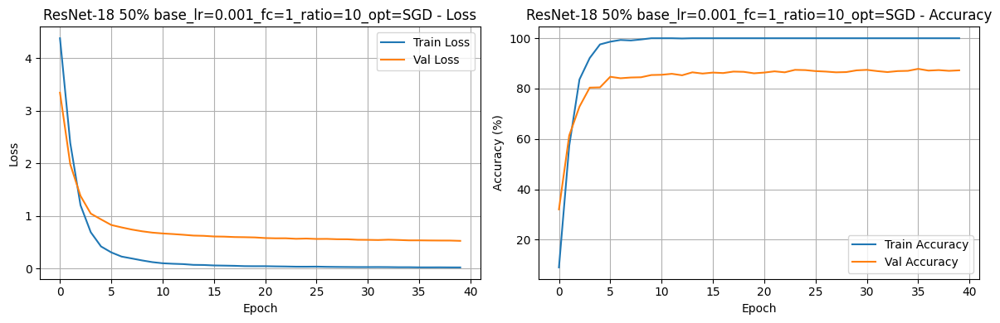


Training ResNet-18 with 50% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 5.2103, Train Acc: 27.94%, Val Loss: 2.5602, Val Acc: 55.98%
Epoch 2: Train Loss: 1.0064, Train Acc: 75.88%, Val Loss: 1.0855, Val Acc: 73.24%
Epoch 3: Train Loss: 0.2856, Train Acc: 92.84%, Val Loss: 0.9411, Val Acc: 77.06%
Epoch 4: Train Loss: 0.1294, Train Acc: 96.86%, Val Loss: 0.7982, Val Acc: 79.61%
Epoch 5: Train Loss: 0.1101, Train Acc: 96.57%, Val Loss: 0.9424, Val Acc: 78.73%
Epoch 6: Train Loss: 0.1123, Train Acc: 98.04%, Val Loss: 0.8919, Val Acc: 80.88%
Epoch 7: Train Loss: 0.0978, Train Acc: 97.45%, Val Loss: 1.1367, Val Acc: 76.96%
Early stopping triggered after epoch 7
Test Accuracy: 71.98%


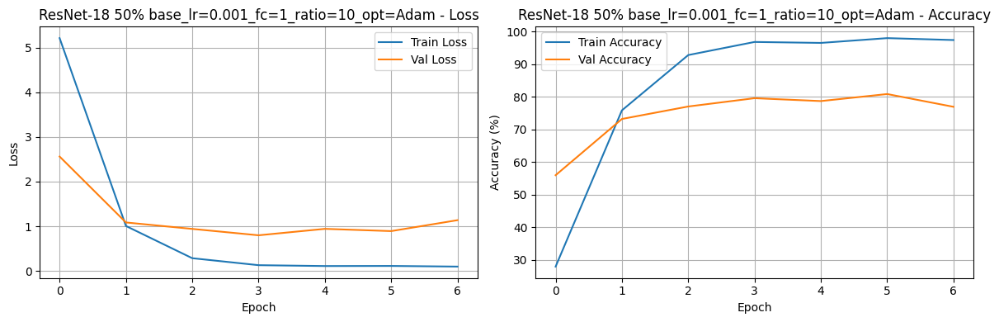


Training ResNet-18 with 50% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 6.0013, Train Acc: 25.78%, Val Loss: 4.7708, Val Acc: 49.51%
Epoch 2: Train Loss: 2.1106, Train Acc: 71.76%, Val Loss: 2.1184, Val Acc: 63.73%
Epoch 3: Train Loss: 0.7105, Train Acc: 86.08%, Val Loss: 2.3005, Val Acc: 65.49%
Epoch 4: Train Loss: 0.3565, Train Acc: 91.67%, Val Loss: 1.6252, Val Acc: 71.86%
Epoch 5: Train Loss: 0.1717, Train Acc: 95.49%, Val Loss: 1.6333, Val Acc: 74.41%
Epoch 6: Train Loss: 0.0840, Train Acc: 97.55%, Val Loss: 1.4214, Val Acc: 75.59%
Epoch 7: Train Loss: 0.0815, Train Acc: 97.84%, Val Loss: 1.2381, Val Acc: 77.94%
Epoch 8: Train Loss: 0.0451, Train Acc: 98.92%, Val Loss: 1.1470, Val Acc: 77.94%
Epoch 9: Train Loss: 0.0252, Train Acc: 99.12%, Val Loss: 1.0185, Val Acc: 79.90%
Epoch 10: Train Loss: 0.0151

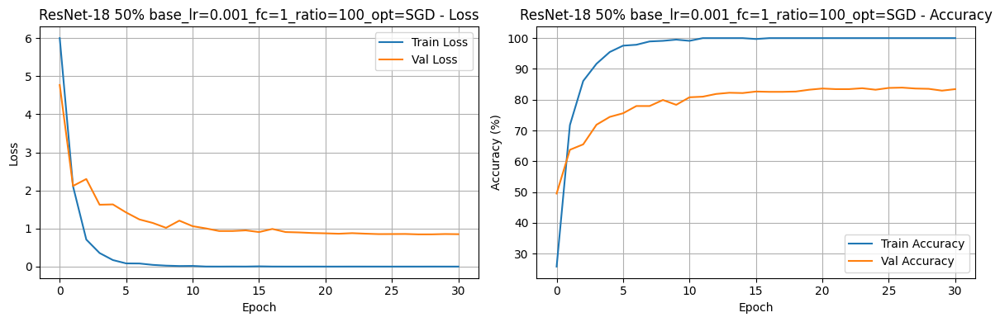


Training ResNet-18 with 50% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 88.9945, Train Acc: 5.59%, Val Loss: 64.4115, Val Acc: 14.71%
Epoch 2: Train Loss: 35.0374, Train Acc: 21.27%, Val Loss: 27.8747, Val Acc: 21.67%
Epoch 3: Train Loss: 17.4766, Train Acc: 41.76%, Val Loss: 15.3074, Val Acc: 38.14%
Epoch 4: Train Loss: 11.4746, Train Acc: 54.22%, Val Loss: 9.9873, Val Acc: 50.88%
Epoch 5: Train Loss: 7.3842, Train Acc: 64.71%, Val Loss: 8.1281, Val Acc: 54.71%
Epoch 6: Train Loss: 5.7801, Train Acc: 71.27%, Val Loss: 9.1254, Val Acc: 62.16%
Epoch 7: Train Loss: 5.4374, Train Acc: 75.10%, Val Loss: 7.1819, Val Acc: 65.59%
Epoch 8: Train Loss: 3.1877, Train Acc: 82.75%, Val Loss: 7.5975, Val Acc: 68.53%
Epoch 9: Train Loss: 1.5819, Train Acc: 87.55%, Val Loss: 8.6706, Val Acc: 66.27%
Epoch 10: Train Loss:

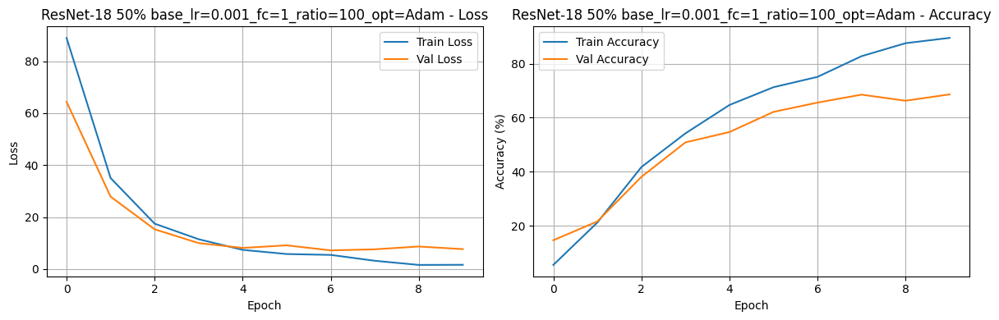


Training ResNet-18 with 50% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 4.6473, Train Acc: 2.35%, Val Loss: 4.3602, Val Acc: 13.63%
Epoch 2: Train Loss: 4.1182, Train Acc: 13.73%, Val Loss: 3.7059, Val Acc: 30.29%
Epoch 3: Train Loss: 3.2971, Train Acc: 29.51%, Val Loss: 2.6877, Val Acc: 50.20%
Epoch 4: Train Loss: 2.3019, Train Acc: 48.14%, Val Loss: 1.9513, Val Acc: 58.63%
Epoch 5: Train Loss: 1.6871, Train Acc: 59.71%, Val Loss: 1.5311, Val Acc: 65.88%
Epoch 6: Train Loss: 1.2164, Train Acc: 70.39%, Val Loss: 1.2417, Val Acc: 70.69%
Epoch 7: Train Loss: 0.9487, Train Acc: 77.06%, Val Loss: 1.0430, Val Acc: 75.69%
Epoch 8: Train Loss: 0.7026, Train Acc: 82.55%, Val Loss: 0.8582, Val Acc: 79.22%
Epoch 9: Train Loss: 0.5716, Train Acc: 85.69%, Val Loss: 0.8052, Val Acc: 79.22%
Epoch 10: Train Loss: 0.4016,

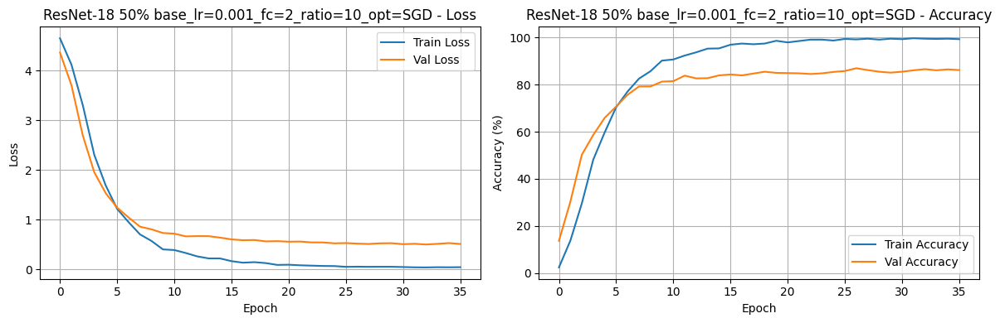


Training ResNet-18 with 50% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 5.2848, Train Acc: 1.86%, Val Loss: 4.3648, Val Acc: 5.00%
Epoch 2: Train Loss: 4.4559, Train Acc: 2.16%, Val Loss: 4.2836, Val Acc: 4.90%
Epoch 3: Train Loss: 4.4251, Train Acc: 2.75%, Val Loss: 4.1774, Val Acc: 7.35%
Epoch 4: Train Loss: 4.3983, Train Acc: 2.65%, Val Loss: 4.1078, Val Acc: 4.51%
Epoch 5: Train Loss: 4.3388, Train Acc: 2.45%, Val Loss: 3.9875, Val Acc: 6.57%
Epoch 6: Train Loss: 4.2748, Train Acc: 1.86%, Val Loss: 3.8728, Val Acc: 7.94%
Epoch 7: Train Loss: 4.2092, Train Acc: 3.43%, Val Loss: 3.8010, Val Acc: 6.76%
Epoch 8: Train Loss: 4.2031, Train Acc: 3.82%, Val Loss: 3.8840, Val Acc: 6.76%
Epoch 9: Train Loss: 4.1893, Train Acc: 3.82%, Val Loss: 3.8098, Val Acc: 7.94%
Epoch 10: Train Loss: 4.1435, Train Acc: 3.92

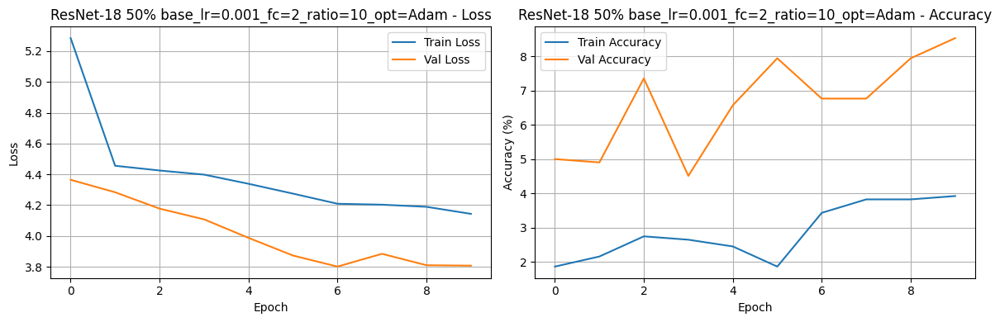


Training ResNet-18 with 50% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 4.6311, Train Acc: 3.14%, Val Loss: 4.1846, Val Acc: 6.18%
Epoch 2: Train Loss: 4.4395, Train Acc: 4.80%, Val Loss: 4.5129, Val Acc: 3.24%
Epoch 3: Train Loss: 4.5938, Train Acc: 2.55%, Val Loss: 4.4505, Val Acc: 2.75%
Epoch 4: Train Loss: 4.6259, Train Acc: 1.27%, Val Loss: 4.4818, Val Acc: 5.98%
Early stopping triggered after epoch 4
Test Accuracy: 4.62%


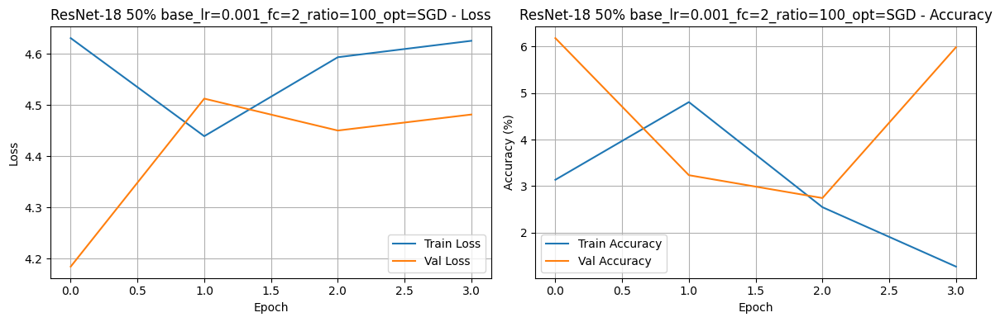


Training ResNet-18 with 50% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 85.3833, Train Acc: 0.39%, Val Loss: 4.6438, Val Acc: 0.98%
Epoch 2: Train Loss: 4.7810, Train Acc: 0.39%, Val Loss: 4.6356, Val Acc: 0.98%
Epoch 3: Train Loss: 4.6754, Train Acc: 0.39%, Val Loss: 4.6302, Val Acc: 0.98%
Epoch 4: Train Loss: 4.6696, Train Acc: 0.20%, Val Loss: 4.6302, Val Acc: 0.98%
Epoch 5: Train Loss: 4.6775, Train Acc: 0.39%, Val Loss: 4.6297, Val Acc: 0.98%
Epoch 6: Train Loss: 4.6743, Train Acc: 0.59%, Val Loss: 4.6289, Val Acc: 0.98%
Epoch 7: Train Loss: 4.6727, Train Acc: 0.49%, Val Loss: 4.6294, Val Acc: 0.98%
Epoch 8: Train Loss: 4.6669, Train Acc: 0.20%, Val Loss: 24.6694, Val Acc: 1.18%
Epoch 9: Train Loss: 5.5004, Train Acc: 0.20%, Val Loss: 4.6300, Val Acc: 0.98%
Early stopping triggered after epoch 9
Tes

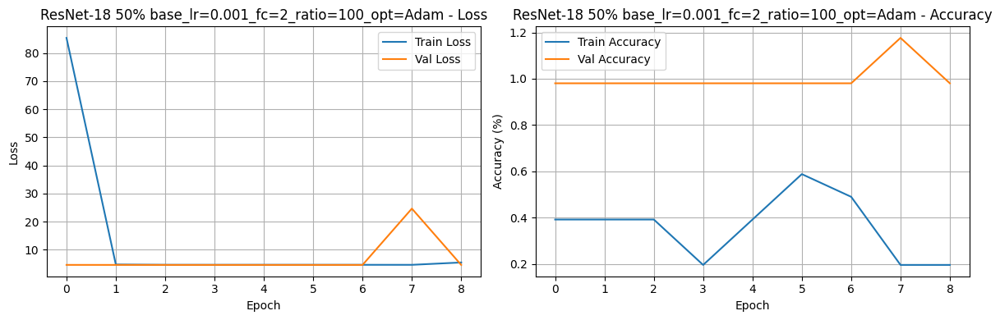


Training ResNet-18 with 50% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 4.7469, Train Acc: 1.37%, Val Loss: 4.5336, Val Acc: 2.25%
Epoch 2: Train Loss: 4.4248, Train Acc: 4.41%, Val Loss: 4.2826, Val Acc: 8.53%
Epoch 3: Train Loss: 4.1375, Train Acc: 13.63%, Val Loss: 4.0465, Val Acc: 17.25%
Epoch 4: Train Loss: 3.8672, Train Acc: 25.98%, Val Loss: 3.8232, Val Acc: 30.29%
Epoch 5: Train Loss: 3.6049, Train Acc: 42.35%, Val Loss: 3.6022, Val Acc: 38.53%
Epoch 6: Train Loss: 3.3531, Train Acc: 53.33%, Val Loss: 3.3987, Val Acc: 45.59%
Epoch 7: Train Loss: 3.1113, Train Acc: 64.12%, Val Loss: 3.2050, Val Acc: 53.24%
Epoch 8: Train Loss: 2.8746, Train Acc: 72.25%, Val Loss: 3.0110, Val Acc: 60.10%
Epoch 9: Train Loss: 2.6894, Train Acc: 77.16%, Val Loss: 2.8505, Val Acc: 62.94%
Epoch 10: Train Loss: 2.4726, Tr

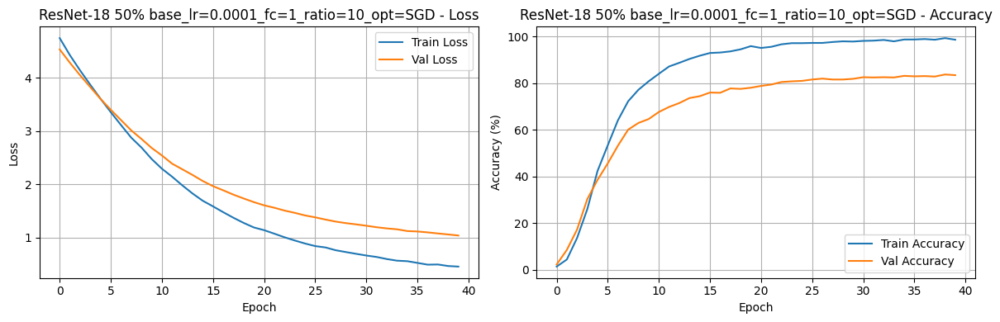


Training ResNet-18 with 50% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 4.2901, Train Acc: 14.90%, Val Loss: 3.0834, Val Acc: 44.31%
Epoch 2: Train Loss: 2.1049, Train Acc: 74.51%, Val Loss: 1.8441, Val Acc: 70.98%
Epoch 3: Train Loss: 1.0625, Train Acc: 92.25%, Val Loss: 1.2566, Val Acc: 80.00%
Epoch 4: Train Loss: 0.5345, Train Acc: 98.24%, Val Loss: 0.9844, Val Acc: 83.24%
Epoch 5: Train Loss: 0.3109, Train Acc: 99.41%, Val Loss: 0.8501, Val Acc: 85.59%
Epoch 6: Train Loss: 0.1908, Train Acc: 99.71%, Val Loss: 0.7660, Val Acc: 87.65%
Epoch 7: Train Loss: 0.1285, Train Acc: 99.90%, Val Loss: 0.7020, Val Acc: 88.33%
Epoch 8: Train Loss: 0.0925, Train Acc: 100.00%, Val Loss: 0.6584, Val Acc: 88.73%
Epoch 9: Train Loss: 0.0683, Train Acc: 100.00%, Val Loss: 0.6335, Val Acc: 88.63%
Epoch 10: Train Loss: 0.0

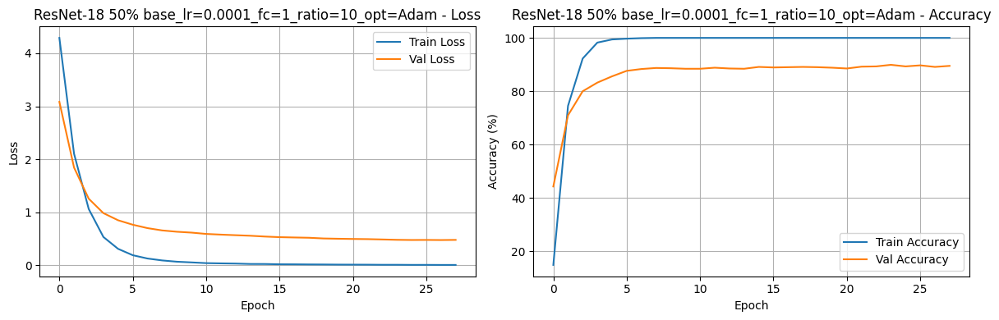


Training ResNet-18 with 50% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 4.4417, Train Acc: 6.96%, Val Loss: 3.4765, Val Acc: 30.69%
Epoch 2: Train Loss: 2.5505, Train Acc: 54.02%, Val Loss: 2.2530, Val Acc: 53.14%
Epoch 3: Train Loss: 1.4012, Train Acc: 80.98%, Val Loss: 1.5501, Val Acc: 71.76%
Epoch 4: Train Loss: 0.8876, Train Acc: 89.71%, Val Loss: 1.2450, Val Acc: 76.86%
Epoch 5: Train Loss: 0.5776, Train Acc: 95.98%, Val Loss: 1.0903, Val Acc: 79.22%
Epoch 6: Train Loss: 0.4366, Train Acc: 97.35%, Val Loss: 0.9726, Val Acc: 81.27%
Epoch 7: Train Loss: 0.3354, Train Acc: 98.24%, Val Loss: 0.9258, Val Acc: 81.18%
Epoch 8: Train Loss: 0.2789, Train Acc: 98.82%, Val Loss: 0.8722, Val Acc: 83.14%
Epoch 9: Train Loss: 0.2303, Train Acc: 99.41%, Val Loss: 0.8224, Val Acc: 83.14%
Epoch 10: Train Loss: 0.1917

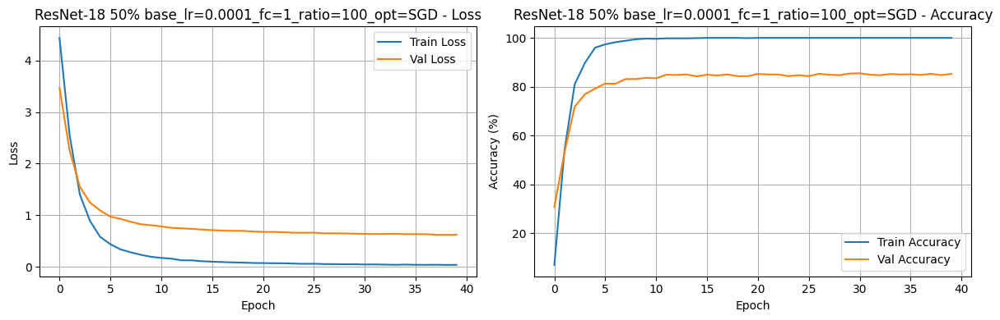


Training ResNet-18 with 50% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 5.7323, Train Acc: 19.71%, Val Loss: 2.0839, Val Acc: 55.20%
Epoch 2: Train Loss: 0.8170, Train Acc: 79.51%, Val Loss: 0.8891, Val Acc: 77.35%
Epoch 3: Train Loss: 0.1883, Train Acc: 95.59%, Val Loss: 0.7767, Val Acc: 81.08%
Epoch 4: Train Loss: 0.0826, Train Acc: 98.04%, Val Loss: 0.6357, Val Acc: 82.94%
Epoch 5: Train Loss: 0.0312, Train Acc: 99.51%, Val Loss: 0.5814, Val Acc: 84.12%
Epoch 6: Train Loss: 0.0154, Train Acc: 99.90%, Val Loss: 0.5529, Val Acc: 85.10%
Epoch 7: Train Loss: 0.0099, Train Acc: 100.00%, Val Loss: 0.5188, Val Acc: 85.98%
Epoch 8: Train Loss: 0.0073, Train Acc: 100.00%, Val Loss: 0.5120, Val Acc: 85.69%
Epoch 9: Train Loss: 0.0069, Train Acc: 100.00%, Val Loss: 0.5267, Val Acc: 85.10%
Epoch 10: Train Loss: 0

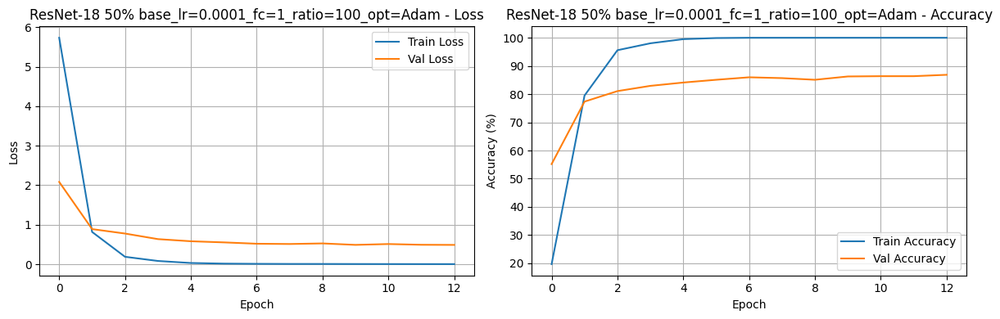


Training ResNet-18 with 50% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 4.6847, Train Acc: 1.37%, Val Loss: 4.6020, Val Acc: 3.14%
Epoch 2: Train Loss: 4.5933, Train Acc: 1.96%, Val Loss: 4.5326, Val Acc: 5.39%
Epoch 3: Train Loss: 4.4974, Train Acc: 3.33%, Val Loss: 4.4682, Val Acc: 9.41%
Epoch 4: Train Loss: 4.4172, Train Acc: 6.57%, Val Loss: 4.3988, Val Acc: 13.53%
Epoch 5: Train Loss: 4.3568, Train Acc: 8.73%, Val Loss: 4.3266, Val Acc: 19.02%
Epoch 6: Train Loss: 4.2537, Train Acc: 12.55%, Val Loss: 4.2489, Val Acc: 25.39%
Epoch 7: Train Loss: 4.1749, Train Acc: 15.88%, Val Loss: 4.1594, Val Acc: 31.76%
Epoch 8: Train Loss: 4.0565, Train Acc: 20.78%, Val Loss: 4.0653, Val Acc: 37.16%
Epoch 9: Train Loss: 3.9829, Train Acc: 23.04%, Val Loss: 3.9624, Val Acc: 43.14%
Epoch 10: Train Loss: 3.8687, Train

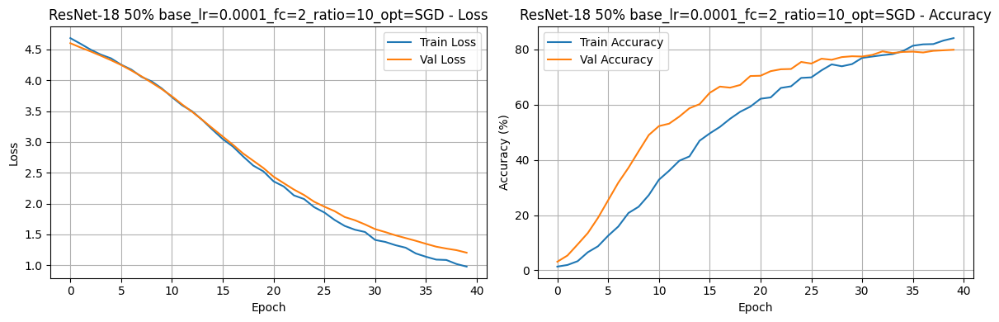


Training ResNet-18 with 50% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 4.5778, Train Acc: 4.22%, Val Loss: 4.0597, Val Acc: 24.51%
Epoch 2: Train Loss: 3.5558, Train Acc: 22.75%, Val Loss: 2.7968, Val Acc: 50.78%
Epoch 3: Train Loss: 2.4229, Train Acc: 42.35%, Val Loss: 1.8058, Val Acc: 66.18%
Epoch 4: Train Loss: 1.5069, Train Acc: 65.00%, Val Loss: 1.2574, Val Acc: 74.41%
Epoch 5: Train Loss: 0.9096, Train Acc: 80.00%, Val Loss: 0.9665, Val Acc: 78.92%
Epoch 6: Train Loss: 0.6286, Train Acc: 86.67%, Val Loss: 0.8220, Val Acc: 80.69%
Epoch 7: Train Loss: 0.3996, Train Acc: 92.16%, Val Loss: 0.7137, Val Acc: 82.35%
Epoch 8: Train Loss: 0.2962, Train Acc: 94.90%, Val Loss: 0.6957, Val Acc: 83.24%
Epoch 9: Train Loss: 0.2101, Train Acc: 96.67%, Val Loss: 0.6407, Val Acc: 82.84%
Epoch 10: Train Loss: 0.140

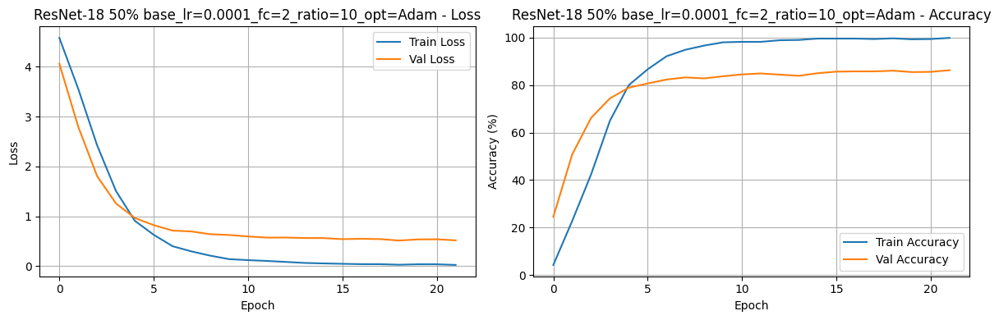


Training ResNet-18 with 50% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 4.6086, Train Acc: 1.86%, Val Loss: 4.3302, Val Acc: 18.43%
Epoch 2: Train Loss: 4.1026, Train Acc: 13.24%, Val Loss: 3.7275, Val Acc: 24.80%
Epoch 3: Train Loss: 3.3611, Train Acc: 25.88%, Val Loss: 2.8501, Val Acc: 49.51%
Epoch 4: Train Loss: 2.4359, Train Acc: 46.67%, Val Loss: 2.0853, Val Acc: 59.31%
Epoch 5: Train Loss: 1.7632, Train Acc: 60.49%, Val Loss: 1.5764, Val Acc: 69.41%
Epoch 6: Train Loss: 1.3551, Train Acc: 68.73%, Val Loss: 1.3435, Val Acc: 70.78%
Epoch 7: Train Loss: 1.0596, Train Acc: 75.59%, Val Loss: 1.1291, Val Acc: 76.67%
Epoch 8: Train Loss: 0.8484, Train Acc: 79.61%, Val Loss: 1.0535, Val Acc: 75.39%
Epoch 9: Train Loss: 0.7556, Train Acc: 81.76%, Val Loss: 0.9431, Val Acc: 76.86%
Epoch 10: Train Loss: 0.650

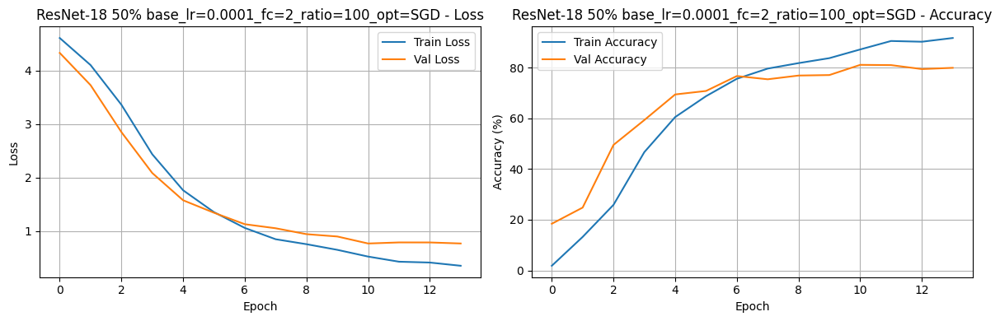


Training ResNet-18 with 50% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 4,720,640
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 6,455,872
Epoch 1: Train Loss: 5.1244, Train Acc: 2.25%, Val Loss: 4.3832, Val Acc: 6.08%
Epoch 2: Train Loss: 4.3947, Train Acc: 5.00%, Val Loss: 4.0657, Val Acc: 10.10%
Epoch 3: Train Loss: 4.1898, Train Acc: 4.80%, Val Loss: 3.8994, Val Acc: 10.00%
Epoch 4: Train Loss: 4.1396, Train Acc: 5.29%, Val Loss: 3.8121, Val Acc: 11.86%
Epoch 5: Train Loss: 4.0709, Train Acc: 5.59%, Val Loss: 3.6022, Val Acc: 13.82%
Epoch 6: Train Loss: 4.0869, Train Acc: 5.20%, Val Loss: 3.7133, Val Acc: 12.94%
Epoch 7: Train Loss: 4.0314, Train Acc: 5.88%, Val Loss: 3.5645, Val Acc: 11.96%
Epoch 8: Train Loss: 4.0358, Train Acc: 5.39%, Val Loss: 3.6101, Val Acc: 10.29%
Epoch 9: Train Loss: 4.0275, Train Acc: 5.49%, Val Loss: 3.6025, Val Acc: 13.92%
Epoch 10: Train Loss: 3.9628, Train

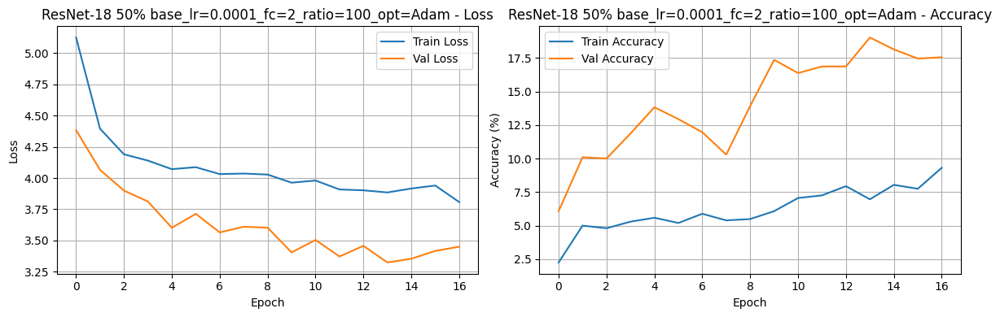

,base_lr,ratio,fc_layers,optimizer,final_val_accuracy,test_accuracy,final_train_loss,final_train_accuracy,final_val_loss
0,0.0010,10,1,SGD,87.254902,84.517808,0.018217,100.000000,0.523811
1,0.0010,10,1,Adam,76.960784,71.979184,0.097786,97.450980,1.136707
2,0.0010,100,1,SGD,83.431373,81.135144,0.000369,100.000000,0.851199
3,0.0010,100,1,Adam,68.627451,64.969914,1.631366,89.509804,7.668922
4,0.0010,10,2,SGD,86.176471,84.127500,0.043794,99.313725,0.510591
5,0.0010,10,2,Adam,8.529412,9.838998,4.143522,3.921569,3.807221
6,0.0010,100,2,SGD,5.980392,4.618637,4.625903,1.274510,4.481821
7,0.0010,100,2,Adam,0.980392,0.471621,5.500385,0.196078,4.629999
8,0.0001,10,1,SGD,83.431373,80.939990,0.451117,98.627451,1.035509
9,0.0001,10,1,Adam,89.509804,85.802570,0.007332,100.000000,0.479641


In [ ]:
Optimizers = [
    lambda model, base_lr, ratio: optim.SGD(get_parameter_groups(model, base_lr, ratio), momentum=0.9),
    lambda model, base_lr, ratio: optim.Adam(get_parameter_groups(model, base_lr, ratio))

]
optimizer_names = ['SGD','Adam']
LRs = [0.001, 0.0001]
FCs = [1, 2]
Ratios = [10, 100]
all_results = []

for base_lr in LRs:
    for fc_layers in FCs:
        for ratio in Ratios:
            for opt_func, opt_name in zip(Optimizers, optimizer_names):
                res80 = models.resnet18
                model_name = "ResNet-18"
                trainable = "50%"

                print(f"\nTraining {model_name} with {trainable} trainable parameters, "
                      f"base_lr={base_lr}, fc_layers={fc_layers}, ratio={ratio}, optimizer={opt_name}")

                # Load and modify model
                model = res80(pretrained=True)
                model = modify_model(model, num_layers=fc_layers).to(device)

                # Set trainable layers
                set_trainable_layers(model, trainable,16)

                # Print model structure
                print_model_structure(model,base_lr,ratio)

                # Train model with specified optimizer
                optimizer = opt_func(model, base_lr, ratio)
                train_losses, train_accuracies, val_losses, val_accuracies = train_model(
                    model, trainloader, valloader,optimizer, num_epochs=40, patience=3, min_delta=0.001,
                base_lr=base_lr,ratio=ratio)

                # Evaluate on test set
                test_acc = evaluate_model(model, testloader)
                print(f'Test Accuracy: {test_acc:.2f}%')

                # Store results
                results = {
                    'train_losses': train_losses,
                    'train_accuracies': train_accuracies,
                    'val_losses': val_losses,
                    'val_accuracies': val_accuracies,
                    'final_val_accuracy': val_accuracies[-1],
                    'test_accuracy': test_acc,
                    'base_lr': base_lr,
                    'ratio': ratio,
                    'fc_layers': fc_layers,
                    'optimizer': opt_name
                }
                all_results.append(results)

                # Plot metrics
                plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies,
                             f"{model_name} {trainable} base_lr={base_lr}_fc={fc_layers}_ratio={ratio}_opt={opt_name}")
results_df = pd.DataFrame([
    {
        'base_lr': res['base_lr'],
        'ratio': res['ratio'],
        'fc_layers': res['fc_layers'],
        'optimizer': res['optimizer'],
        'final_val_accuracy': res['final_val_accuracy'],
        'test_accuracy': res['test_accuracy'],
        'final_train_loss': res['train_losses'][-1],
        'final_train_accuracy': res['train_accuracies'][-1],
        'final_val_loss': res['val_losses'][-1]
    } for res in all_results
])
results_df

### 30% trainable

#### Hyper parameter tuning


Training ResNet-18 with 30% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=SGD


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 177MB/s]


Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 4.4003, Train Acc: 8.73%, Val Loss: 3.4078, Val Acc: 30.78%
Epoch 2: Train Loss: 2.4953, Train Acc: 55.20%, Val Loss: 2.1291, Val Acc: 58.92%
Epoch 3: Train Loss: 1.3479, Train Acc: 81.27%, Val Loss: 1.5355, Val Acc: 70.39%
Epoch 4: Train Loss: 0.8205, Train Acc: 90.20%, Val Loss: 1.1836, Val Acc: 78.63%
Epoch 5: Train Loss: 0.5235, Train Acc: 96.27%, Val Loss: 1.0659, Val Acc: 78.04%
Epoch 6: Train Loss: 0.3983, Train Acc: 97.75%, Val Loss: 0.9417, Val Acc: 82.65%
Epoch 7: Train Loss: 0.3032, Train Acc: 98.82%, Val Loss: 0.8932, Val Acc: 82.65%
Epoch 8: Train Loss: 0.2594, Train Acc: 98.92%, Val Loss: 0.8381, Val Acc: 82.75%
Epoch 9: Train Loss: 0.2103, Train Acc: 98.92%, Val Loss: 0.8048, Val Acc: 82.75%
Epoch 10: Train Loss: 0.1684, Train Acc: 99.71%, Val Loss: 0.7734, Val Acc: 83.43%
Epoch 11: Train Loss: 0.1410, Train Acc: 100.00%, 

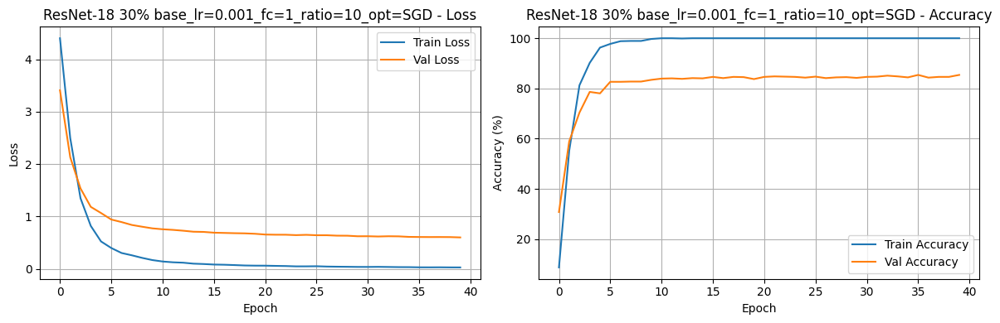


Training ResNet-18 with 30% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 5.4622, Train Acc: 24.22%, Val Loss: 2.3418, Val Acc: 57.16%
Epoch 2: Train Loss: 0.9111, Train Acc: 76.27%, Val Loss: 1.1776, Val Acc: 70.98%
Epoch 3: Train Loss: 0.2478, Train Acc: 92.55%, Val Loss: 1.0428, Val Acc: 72.75%
Epoch 4: Train Loss: 0.1238, Train Acc: 96.27%, Val Loss: 0.9315, Val Acc: 76.67%
Epoch 5: Train Loss: 0.0555, Train Acc: 98.53%, Val Loss: 0.8516, Val Acc: 79.41%
Epoch 6: Train Loss: 0.0461, Train Acc: 98.63%, Val Loss: 0.7469, Val Acc: 80.78%
Epoch 7: Train Loss: 0.0614, Train Acc: 98.73%, Val Loss: 0.9091, Val Acc: 78.53%
Epoch 8: Train Loss: 0.0616, Train Acc: 98.33%, Val Loss: 1.0244, Val Acc: 77.55%
Epoch 9: Train Loss: 0.1314, Train Acc: 97.35%, Val Loss: 0.9925, Val Acc: 76.37%
Early stopping triggered aft

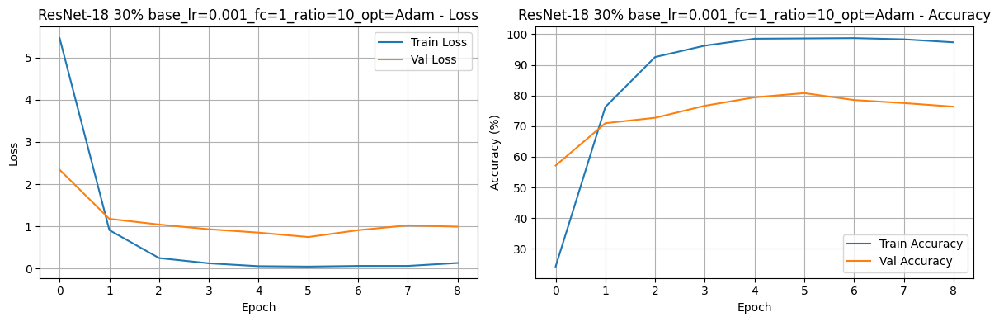


Training ResNet-18 with 30% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 6.0905, Train Acc: 19.41%, Val Loss: 5.0072, Val Acc: 46.67%
Epoch 2: Train Loss: 2.6076, Train Acc: 67.35%, Val Loss: 2.3779, Val Acc: 60.20%
Epoch 3: Train Loss: 0.7620, Train Acc: 84.71%, Val Loss: 2.1244, Val Acc: 66.37%
Epoch 4: Train Loss: 0.3384, Train Acc: 92.25%, Val Loss: 1.8536, Val Acc: 69.31%
Epoch 5: Train Loss: 0.1839, Train Acc: 95.49%, Val Loss: 1.3525, Val Acc: 74.80%
Epoch 6: Train Loss: 0.0832, Train Acc: 97.65%, Val Loss: 1.4103, Val Acc: 74.51%
Epoch 7: Train Loss: 0.0772, Train Acc: 97.94%, Val Loss: 1.0056, Val Acc: 80.88%
Epoch 8: Train Loss: 0.0362, Train Acc: 99.02%, Val Loss: 1.2370, Val Acc: 78.33%
Epoch 9: Train Loss: 0.0316, Train Acc: 99.12%, Val Loss: 1.0918, Val Acc: 80.00%
Epoch 10: Train Loss: 0.0201

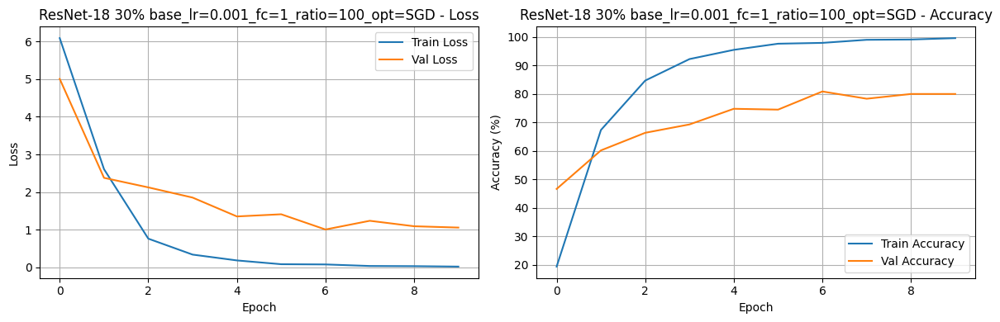


Training ResNet-18 with 30% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 101.9042, Train Acc: 6.96%, Val Loss: 104.8526, Val Acc: 16.18%
Epoch 2: Train Loss: 49.9604, Train Acc: 33.04%, Val Loss: 21.3733, Val Acc: 45.00%
Epoch 3: Train Loss: 9.6601, Train Acc: 65.59%, Val Loss: 9.4259, Val Acc: 60.49%
Epoch 4: Train Loss: 4.4514, Train Acc: 77.55%, Val Loss: 8.6115, Val Acc: 63.24%
Epoch 5: Train Loss: 3.1038, Train Acc: 82.75%, Val Loss: 8.6711, Val Acc: 64.80%
Epoch 6: Train Loss: 2.3804, Train Acc: 86.86%, Val Loss: 8.2912, Val Acc: 68.92%
Epoch 7: Train Loss: 1.8106, Train Acc: 89.22%, Val Loss: 8.4810, Val Acc: 69.51%
Epoch 8: Train Loss: 2.2513, Train Acc: 90.29%, Val Loss: 11.6836, Val Acc: 64.80%
Epoch 9: Train Loss: 2.1596, Train Acc: 88.53%, Val Loss: 10.4679, Val Acc: 69.12%
Early stopping trigg

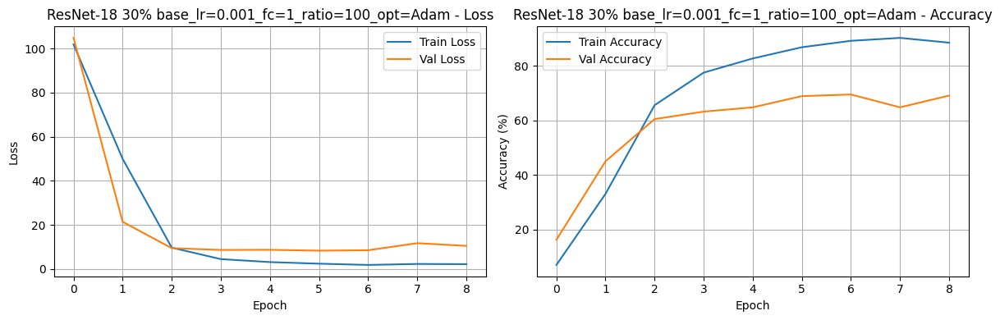


Training ResNet-18 with 30% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 4.6117, Train Acc: 1.86%, Val Loss: 4.3099, Val Acc: 14.61%
Epoch 2: Train Loss: 4.0626, Train Acc: 14.12%, Val Loss: 3.6180, Val Acc: 32.25%
Epoch 3: Train Loss: 3.1906, Train Acc: 31.96%, Val Loss: 2.7356, Val Acc: 48.73%
Epoch 4: Train Loss: 2.3528, Train Acc: 48.63%, Val Loss: 1.9813, Val Acc: 60.78%
Epoch 5: Train Loss: 1.6868, Train Acc: 58.73%, Val Loss: 1.5012, Val Acc: 67.84%
Epoch 6: Train Loss: 1.2334, Train Acc: 72.35%, Val Loss: 1.2543, Val Acc: 71.96%
Epoch 7: Train Loss: 0.9800, Train Acc: 76.57%, Val Loss: 1.0762, Val Acc: 75.59%
Epoch 8: Train Loss: 0.8582, Train Acc: 78.82%, Val Loss: 1.0283, Val Acc: 76.08%
Epoch 9: Train Loss: 0.7096, Train Acc: 83.43%, Val Loss: 0.9091, Val Acc: 76.96%
Epoch 10: Train Loss: 0.5390,

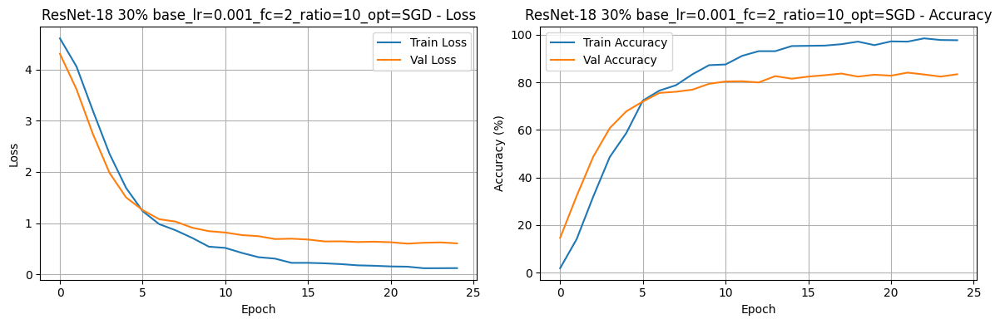


Training ResNet-18 with 30% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 5.2841, Train Acc: 2.06%, Val Loss: 4.3886, Val Acc: 5.29%
Epoch 2: Train Loss: 4.3933, Train Acc: 3.92%, Val Loss: 4.0120, Val Acc: 6.57%
Epoch 3: Train Loss: 4.2857, Train Acc: 4.22%, Val Loss: 3.8391, Val Acc: 10.49%
Epoch 4: Train Loss: 4.2545, Train Acc: 3.43%, Val Loss: 4.0473, Val Acc: 9.02%
Epoch 5: Train Loss: 4.2375, Train Acc: 4.51%, Val Loss: 3.9476, Val Acc: 8.24%
Epoch 6: Train Loss: 4.1906, Train Acc: 4.61%, Val Loss: 3.8142, Val Acc: 10.39%
Epoch 7: Train Loss: 4.1537, Train Acc: 5.59%, Val Loss: 3.7879, Val Acc: 9.41%
Epoch 8: Train Loss: 4.1575, Train Acc: 4.61%, Val Loss: 3.7869, Val Acc: 9.12%
Epoch 9: Train Loss: 4.1633, Train Acc: 4.61%, Val Loss: 3.7892, Val Acc: 11.27%
Epoch 10: Train Loss: 4.0876, Train Acc: 4

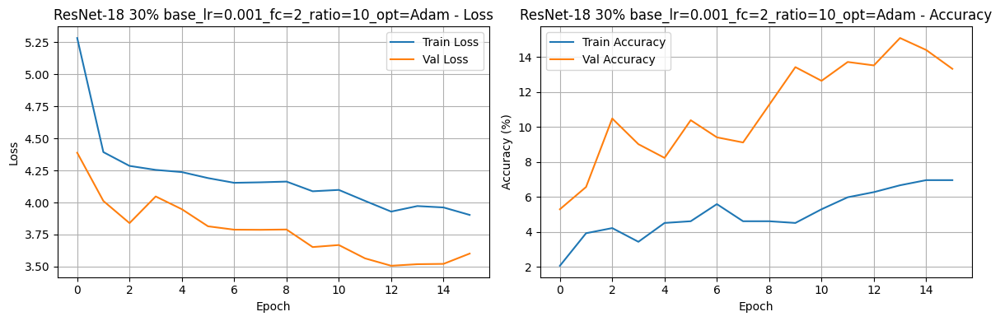


Training ResNet-18 with 30% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 4.6504, Train Acc: 3.24%, Val Loss: 4.0975, Val Acc: 12.75%
Epoch 2: Train Loss: 4.3938, Train Acc: 5.49%, Val Loss: 4.3505, Val Acc: 5.88%
Epoch 3: Train Loss: 4.4783, Train Acc: 3.24%, Val Loss: 4.4627, Val Acc: 3.04%
Epoch 4: Train Loss: 4.5772, Train Acc: 1.18%, Val Loss: 4.5683, Val Acc: 1.96%
Early stopping triggered after epoch 4
Test Accuracy: 2.33%


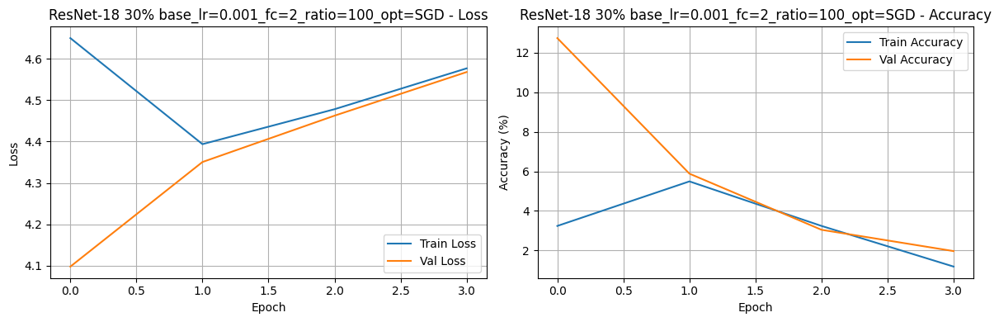


Training ResNet-18 with 30% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 55.9011, Train Acc: 0.88%, Val Loss: 4.6490, Val Acc: 1.37%
Epoch 2: Train Loss: 4.7717, Train Acc: 1.18%, Val Loss: 4.6366, Val Acc: 0.98%
Epoch 3: Train Loss: 4.7720, Train Acc: 0.49%, Val Loss: 4.6318, Val Acc: 0.98%
Epoch 4: Train Loss: 4.6809, Train Acc: 0.49%, Val Loss: 4.6310, Val Acc: 0.98%
Epoch 5: Train Loss: 4.6949, Train Acc: 0.39%, Val Loss: 4.6284, Val Acc: 0.98%
Epoch 6: Train Loss: 5.0357, Train Acc: 0.69%, Val Loss: 4.6318, Val Acc: 0.98%
Epoch 7: Train Loss: 4.6765, Train Acc: 0.49%, Val Loss: 4.6308, Val Acc: 0.98%
Epoch 8: Train Loss: 4.6772, Train Acc: 0.59%, Val Loss: 4.6305, Val Acc: 0.98%
Early stopping triggered after epoch 8
Test Accuracy: 0.52%


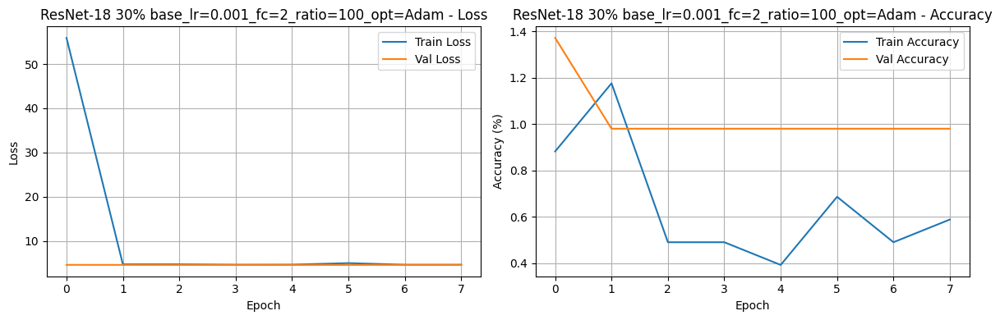


Training ResNet-18 with 30% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 4.7260, Train Acc: 1.47%, Val Loss: 4.5660, Val Acc: 1.96%
Epoch 2: Train Loss: 4.4247, Train Acc: 4.22%, Val Loss: 4.3170, Val Acc: 7.84%
Epoch 3: Train Loss: 4.1518, Train Acc: 12.16%, Val Loss: 4.0884, Val Acc: 16.18%
Epoch 4: Train Loss: 3.8938, Train Acc: 25.49%, Val Loss: 3.8747, Val Acc: 25.88%
Epoch 5: Train Loss: 3.6428, Train Acc: 37.65%, Val Loss: 3.6707, Val Acc: 37.35%
Epoch 6: Train Loss: 3.3998, Train Acc: 51.86%, Val Loss: 3.4721, Val Acc: 45.49%
Epoch 7: Train Loss: 3.1856, Train Acc: 60.39%, Val Loss: 3.2830, Val Acc: 51.67%
Epoch 8: Train Loss: 2.9541, Train Acc: 68.33%, Val Loss: 3.1163, Val Acc: 55.69%
Epoch 9: Train Loss: 2.7612, Train Acc: 74.80%, Val Loss: 2.9450, Val Acc: 60.39%
Epoch 10: Train Loss: 2.5672, Tr

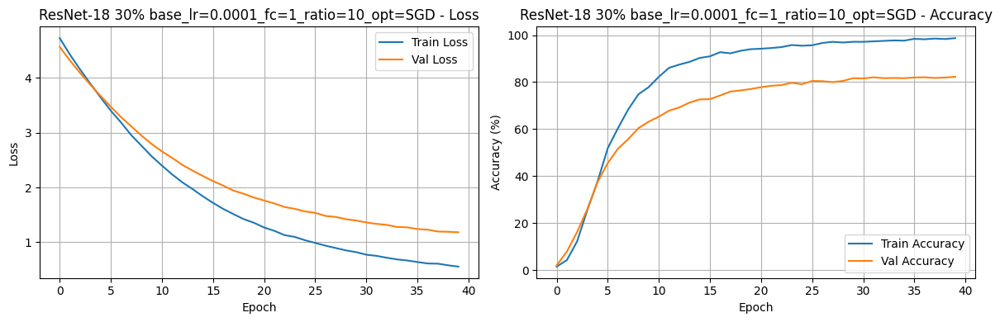


Training ResNet-18 with 30% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 4.4352, Train Acc: 9.31%, Val Loss: 3.4146, Val Acc: 35.69%
Epoch 2: Train Loss: 2.5921, Train Acc: 63.53%, Val Loss: 2.2739, Val Acc: 64.41%
Epoch 3: Train Loss: 1.5020, Train Acc: 87.35%, Val Loss: 1.6554, Val Acc: 72.65%
Epoch 4: Train Loss: 0.9148, Train Acc: 93.53%, Val Loss: 1.2968, Val Acc: 79.80%
Epoch 5: Train Loss: 0.5968, Train Acc: 97.25%, Val Loss: 1.1039, Val Acc: 83.33%
Epoch 6: Train Loss: 0.4175, Train Acc: 98.53%, Val Loss: 0.9699, Val Acc: 82.65%
Epoch 7: Train Loss: 0.2974, Train Acc: 99.22%, Val Loss: 0.8892, Val Acc: 84.80%
Epoch 8: Train Loss: 0.2242, Train Acc: 99.41%, Val Loss: 0.8177, Val Acc: 85.59%
Epoch 9: Train Loss: 0.1727, Train Acc: 99.80%, Val Loss: 0.7864, Val Acc: 85.69%
Epoch 10: Train Loss: 0.1356

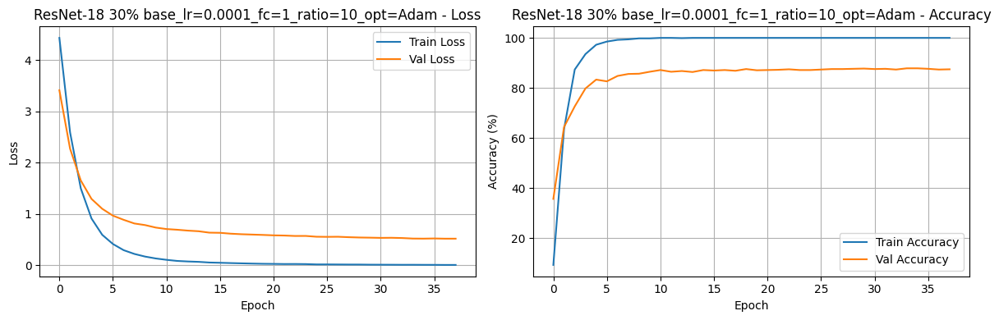


Training ResNet-18 with 30% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 4.4161, Train Acc: 7.35%, Val Loss: 3.4861, Val Acc: 27.65%
Epoch 2: Train Loss: 2.5776, Train Acc: 50.10%, Val Loss: 2.2213, Val Acc: 56.96%
Epoch 3: Train Loss: 1.4019, Train Acc: 80.20%, Val Loss: 1.5952, Val Acc: 69.61%
Epoch 4: Train Loss: 0.8596, Train Acc: 92.25%, Val Loss: 1.2962, Val Acc: 74.22%
Epoch 5: Train Loss: 0.6216, Train Acc: 95.29%, Val Loss: 1.1145, Val Acc: 79.02%
Epoch 6: Train Loss: 0.4570, Train Acc: 96.86%, Val Loss: 1.0291, Val Acc: 80.00%
Epoch 7: Train Loss: 0.3485, Train Acc: 98.63%, Val Loss: 0.9343, Val Acc: 81.86%
Epoch 8: Train Loss: 0.2707, Train Acc: 99.12%, Val Loss: 0.8948, Val Acc: 82.45%
Epoch 9: Train Loss: 0.2367, Train Acc: 99.51%, Val Loss: 0.8556, Val Acc: 81.96%
Epoch 10: Train Loss: 0.1955

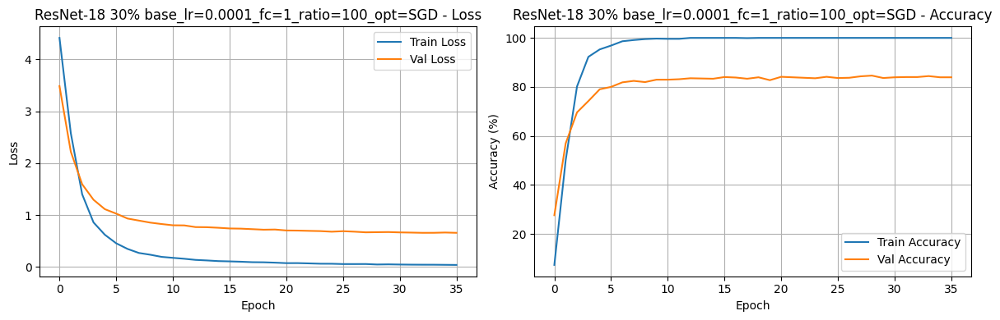


Training ResNet-18 with 30% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 5.3667, Train Acc: 22.25%, Val Loss: 2.2251, Val Acc: 55.78%
Epoch 2: Train Loss: 0.8693, Train Acc: 77.94%, Val Loss: 1.2599, Val Acc: 69.12%
Epoch 3: Train Loss: 0.2610, Train Acc: 93.43%, Val Loss: 0.8340, Val Acc: 78.92%
Epoch 4: Train Loss: 0.1684, Train Acc: 95.39%, Val Loss: 0.9949, Val Acc: 74.41%
Epoch 5: Train Loss: 0.1211, Train Acc: 97.06%, Val Loss: 0.8282, Val Acc: 78.43%
Epoch 6: Train Loss: 0.0379, Train Acc: 99.22%, Val Loss: 0.8270, Val Acc: 79.80%
Epoch 7: Train Loss: 0.0230, Train Acc: 99.80%, Val Loss: 0.7088, Val Acc: 82.35%
Epoch 8: Train Loss: 0.0446, Train Acc: 98.92%, Val Loss: 0.7404, Val Acc: 80.78%
Epoch 9: Train Loss: 0.0423, Train Acc: 99.22%, Val Loss: 0.7945, Val Acc: 80.98%
Epoch 10: Train Loss: 0.02

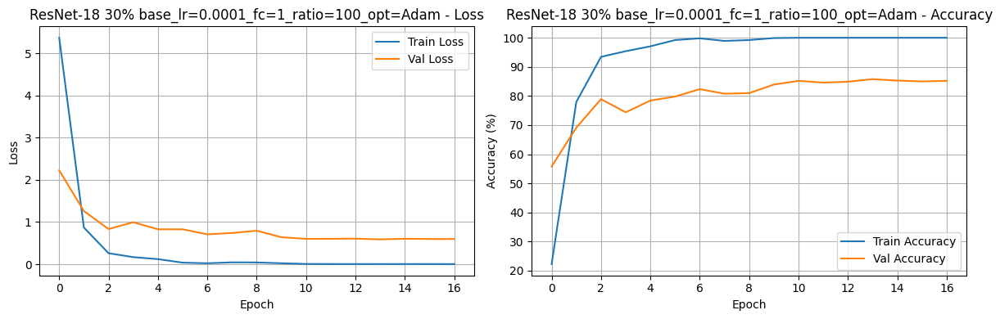


Training ResNet-18 with 30% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 4.6830, Train Acc: 1.08%, Val Loss: 4.6100, Val Acc: 1.08%
Epoch 2: Train Loss: 4.5896, Train Acc: 1.86%, Val Loss: 4.5375, Val Acc: 4.61%
Epoch 3: Train Loss: 4.5209, Train Acc: 3.24%, Val Loss: 4.4718, Val Acc: 9.51%
Epoch 4: Train Loss: 4.4370, Train Acc: 5.39%, Val Loss: 4.4084, Val Acc: 15.29%
Epoch 5: Train Loss: 4.3582, Train Acc: 9.02%, Val Loss: 4.3418, Val Acc: 20.39%
Epoch 6: Train Loss: 4.2670, Train Acc: 12.45%, Val Loss: 4.2647, Val Acc: 24.12%
Epoch 7: Train Loss: 4.1883, Train Acc: 14.41%, Val Loss: 4.1823, Val Acc: 29.71%
Epoch 8: Train Loss: 4.1006, Train Acc: 18.14%, Val Loss: 4.0865, Val Acc: 35.49%
Epoch 9: Train Loss: 3.9931, Train Acc: 24.71%, Val Loss: 3.9929, Val Acc: 39.41%
Epoch 10: Train Loss: 3.8976, Train

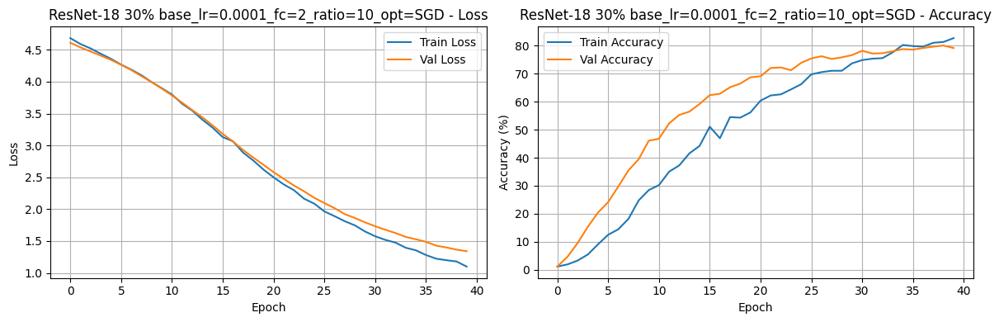


Training ResNet-18 with 30% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 4.5805, Train Acc: 2.84%, Val Loss: 4.1279, Val Acc: 26.47%
Epoch 2: Train Loss: 3.6733, Train Acc: 22.94%, Val Loss: 3.0302, Val Acc: 44.02%
Epoch 3: Train Loss: 2.6605, Train Acc: 40.69%, Val Loss: 2.1445, Val Acc: 61.57%
Epoch 4: Train Loss: 1.8713, Train Acc: 57.25%, Val Loss: 1.5679, Val Acc: 68.82%
Epoch 5: Train Loss: 1.3406, Train Acc: 67.25%, Val Loss: 1.2252, Val Acc: 74.12%
Epoch 6: Train Loss: 0.9875, Train Acc: 77.25%, Val Loss: 1.0411, Val Acc: 75.88%
Epoch 7: Train Loss: 0.7755, Train Acc: 82.35%, Val Loss: 0.9681, Val Acc: 76.86%
Epoch 8: Train Loss: 0.6029, Train Acc: 85.29%, Val Loss: 0.8403, Val Acc: 79.02%
Epoch 9: Train Loss: 0.4744, Train Acc: 89.90%, Val Loss: 0.7861, Val Acc: 79.90%
Epoch 10: Train Loss: 0.404

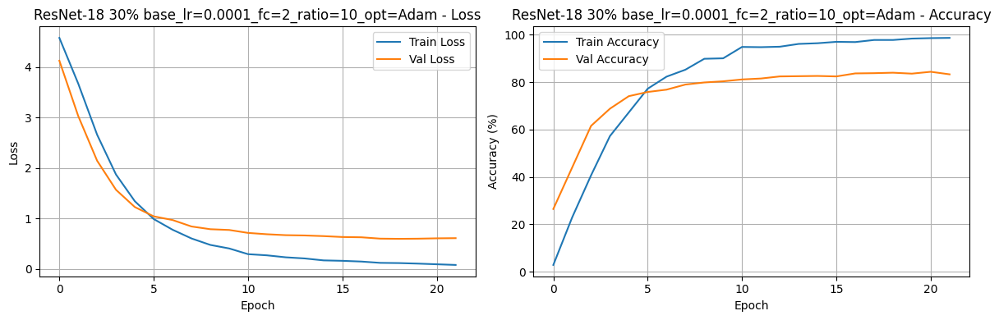


Training ResNet-18 with 30% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 4.6101, Train Acc: 2.16%, Val Loss: 4.3231, Val Acc: 17.06%
Epoch 2: Train Loss: 4.1141, Train Acc: 12.84%, Val Loss: 3.6970, Val Acc: 34.80%
Epoch 3: Train Loss: 3.3279, Train Acc: 29.22%, Val Loss: 2.8233, Val Acc: 50.00%
Epoch 4: Train Loss: 2.4830, Train Acc: 44.90%, Val Loss: 2.1148, Val Acc: 58.53%
Epoch 5: Train Loss: 1.8664, Train Acc: 57.65%, Val Loss: 1.6411, Val Acc: 67.55%
Epoch 6: Train Loss: 1.4348, Train Acc: 65.10%, Val Loss: 1.4482, Val Acc: 66.57%
Epoch 7: Train Loss: 1.1294, Train Acc: 71.57%, Val Loss: 1.1316, Val Acc: 73.82%
Epoch 8: Train Loss: 0.8960, Train Acc: 77.06%, Val Loss: 1.0031, Val Acc: 76.57%
Epoch 9: Train Loss: 0.7719, Train Acc: 81.57%, Val Loss: 0.9510, Val Acc: 77.06%
Epoch 10: Train Loss: 0.629

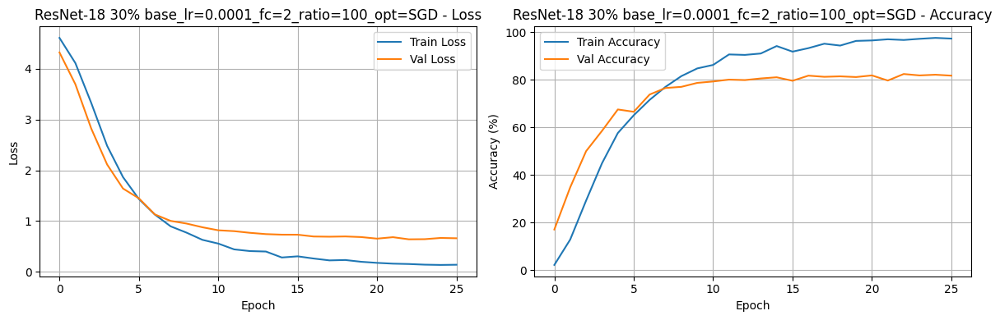


Training ResNet-18 with 30% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 2,360,320
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 8,816,192
Epoch 1: Train Loss: 5.0767, Train Acc: 2.75%, Val Loss: 4.4523, Val Acc: 7.25%
Epoch 2: Train Loss: 4.3587, Train Acc: 4.61%, Val Loss: 4.1021, Val Acc: 9.31%
Epoch 3: Train Loss: 4.2599, Train Acc: 4.41%, Val Loss: 3.9678, Val Acc: 10.10%
Epoch 4: Train Loss: 4.2177, Train Acc: 5.20%, Val Loss: 3.9104, Val Acc: 8.53%
Epoch 5: Train Loss: 4.1047, Train Acc: 7.16%, Val Loss: 3.5809, Val Acc: 14.90%
Epoch 6: Train Loss: 4.1434, Train Acc: 5.20%, Val Loss: 3.7180, Val Acc: 15.20%
Epoch 7: Train Loss: 4.0585, Train Acc: 6.76%, Val Loss: 3.5475, Val Acc: 16.27%
Epoch 8: Train Loss: 3.9357, Train Acc: 8.73%, Val Loss: 3.4443, Val Acc: 16.08%
Epoch 9: Train Loss: 4.0007, Train Acc: 7.75%, Val Loss: 3.7215, Val Acc: 13.24%
Epoch 10: Train Loss: 4.0254, Train A

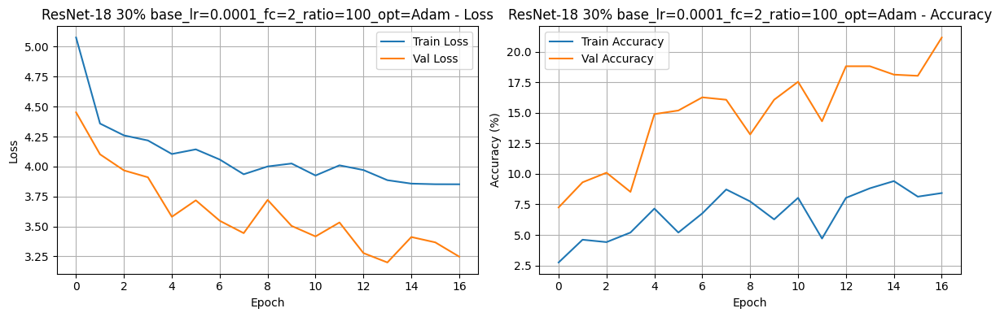

,base_lr,ratio,fc_layers,optimizer,final_val_accuracy,test_accuracy,final_train_loss,final_train_accuracy,final_val_loss
0,0.0010,10,1,SGD,85.392157,82.875264,0.028146,100.000000,0.600337
1,0.0010,10,1,Adam,76.372549,71.914132,0.131397,97.352941,0.992517
2,0.0010,100,1,SGD,80.000000,77.264596,0.020069,99.607843,1.056594
3,0.0010,100,1,Adam,69.117647,65.018702,2.159572,88.529412,10.467906
4,0.0010,10,2,SGD,83.431373,81.525451,0.119647,97.745098,0.603846
5,0.0010,10,2,Adam,13.333333,9.952838,3.902994,6.960784,3.601216
6,0.0010,100,2,SGD,1.960784,2.325581,4.577183,1.176471,4.568275
7,0.0010,100,2,Adam,0.980392,0.520410,4.677221,0.588235,4.630467
8,0.0001,10,1,SGD,82.254902,80.175638,0.555067,98.725490,1.181498
9,0.0001,10,1,Adam,87.450980,84.631647,0.009729,100.000000,0.521565


In [13]:
Optimizers = [
    lambda model, base_lr, ratio: optim.SGD(get_parameter_groups(model, base_lr, ratio), momentum=0.9),
    lambda model, base_lr, ratio: optim.Adam(get_parameter_groups(model, base_lr, ratio))

]
optimizer_names = ['SGD','Adam']
LRs = [0.001, 0.0001]
FCs = [1, 2]
Ratios = [10, 100]
all_results = []

for base_lr in LRs:
    for fc_layers in FCs:
        for ratio in Ratios:
            for opt_func, opt_name in zip(Optimizers, optimizer_names):
                res80 = models.resnet18
                model_name = "ResNet-18"
                trainable = "30%"

                print(f"\nTraining {model_name} with {trainable} trainable parameters, "
                      f"base_lr={base_lr}, fc_layers={fc_layers}, ratio={ratio}, optimizer={opt_name}")

                # Load and modify model
                model = res80(pretrained=True)
                model = modify_model(model, num_layers=fc_layers).to(device)

                # Set trainable layers
                set_trainable_layers(model, trainable,18)

                # Print model structure
                print_model_structure(model,base_lr,ratio)

                # Train model with specified optimizer
                optimizer = opt_func(model, base_lr, ratio)
                train_losses, train_accuracies, val_losses, val_accuracies = train_model(
                    model, trainloader, valloader,optimizer, num_epochs=40, patience=3, min_delta=0.001,
                base_lr=base_lr,ratio=ratio)

                # Evaluate on test set
                test_acc = evaluate_model(model, testloader)
                print(f'Test Accuracy: {test_acc:.2f}%')

                # Store results
                results = {
                    'train_losses': train_losses,
                    'train_accuracies': train_accuracies,
                    'val_losses': val_losses,
                    'val_accuracies': val_accuracies,
                    'final_val_accuracy': val_accuracies[-1],
                    'test_accuracy': test_acc,
                    'base_lr': base_lr,
                    'ratio': ratio,
                    'fc_layers': fc_layers,
                    'optimizer': opt_name
                }
                all_results.append(results)

                # Plot metrics
                plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies,
                             f"{model_name} {trainable} base_lr={base_lr}_fc={fc_layers}_ratio={ratio}_opt={opt_name}")
results_df = pd.DataFrame([
    {
        'base_lr': res['base_lr'],
        'ratio': res['ratio'],
        'fc_layers': res['fc_layers'],
        'optimizer': res['optimizer'],
        'final_val_accuracy': res['final_val_accuracy'],
        'test_accuracy': res['test_accuracy'],
        'final_train_loss': res['train_losses'][-1],
        'final_train_accuracy': res['train_accuracies'][-1],
        'final_val_loss': res['val_losses'][-1]
    } for res in all_results
])
results_df

### only classifire



#### Hyper parameter tuning


Training ResNet-18 with last trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=SGD


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 4.4725, Train Acc: 7.45%, Val Loss: 3.4682, Val Acc: 33.43%
Epoch 2: Train Loss: 2.6105, Train Acc: 52.75%, Val Loss: 2.1797, Val Acc: 60.88%
Epoch 3: Train Loss: 1.4438, Train Acc: 80.98%, Val Loss: 1.6050, Val Acc: 68.33%
Epoch 4: Train Loss: 0.9017, Train Acc: 90.39%, Val Loss: 1.2774, Val Acc: 75.69%
Epoch 5: Train Loss: 0.6516, Train Acc: 94.41%, Val Loss: 1.1245, Val Acc: 79.22%
Epoch 6: Train Loss: 0.4819, Train Acc: 95.69%, Val Loss: 1.0201, Val Acc: 80.78%
Epoch 7: Train Loss: 0.3655, Train Acc: 98.14%, Val Loss: 0.9356, Val Acc: 81.18%
Epoch 8: Train Loss: 0.2838, Train Acc: 99.12%, Val Loss: 0.8867, Val Acc: 83.14%
Epoch 9: Train Loss: 0.2443, Train Acc: 99.41%, Val Loss: 0.8577, Val Acc: 82.45%
Epoch 10: Train Loss: 0.2042, Train Acc: 99.80%, Val Loss: 0.8235, Val Acc: 82.84%
Epoch 11: Train Loss: 0.1731, Train Acc: 99.61%, Val Loss

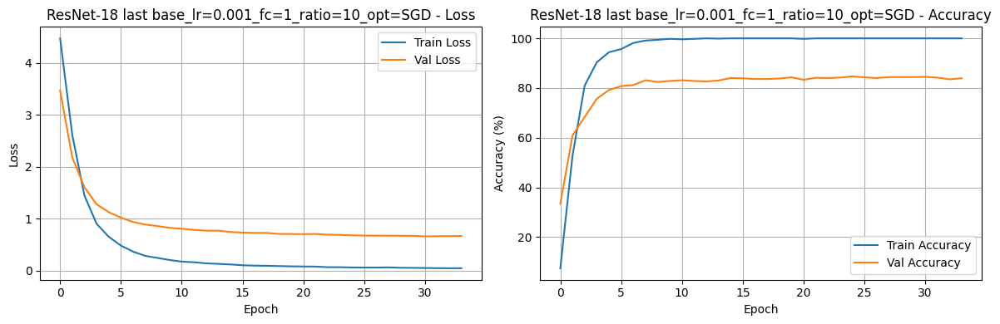


Training ResNet-18 with last trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 6.1163, Train Acc: 17.06%, Val Loss: 2.6162, Val Acc: 48.63%
Epoch 2: Train Loss: 1.0694, Train Acc: 73.92%, Val Loss: 1.1620, Val Acc: 70.78%
Epoch 3: Train Loss: 0.4034, Train Acc: 90.20%, Val Loss: 0.9914, Val Acc: 73.82%
Epoch 4: Train Loss: 0.1939, Train Acc: 95.49%, Val Loss: 0.9446, Val Acc: 75.29%
Epoch 5: Train Loss: 0.1219, Train Acc: 97.55%, Val Loss: 0.8651, Val Acc: 78.04%
Epoch 6: Train Loss: 0.0648, Train Acc: 98.63%, Val Loss: 0.7627, Val Acc: 79.90%
Epoch 7: Train Loss: 0.0534, Train Acc: 99.02%, Val Loss: 0.7764, Val Acc: 79.90%
Epoch 8: Train Loss: 0.0596, Train Acc: 98.73%, Val Loss: 0.7793, Val Acc: 79.02%
Epoch 9: Train Loss: 0.0393, Train Acc: 99.51%, Val Loss: 0.7098, Val Acc: 82.45%
Epoch 10: Train Loss: 0.0363, Trai

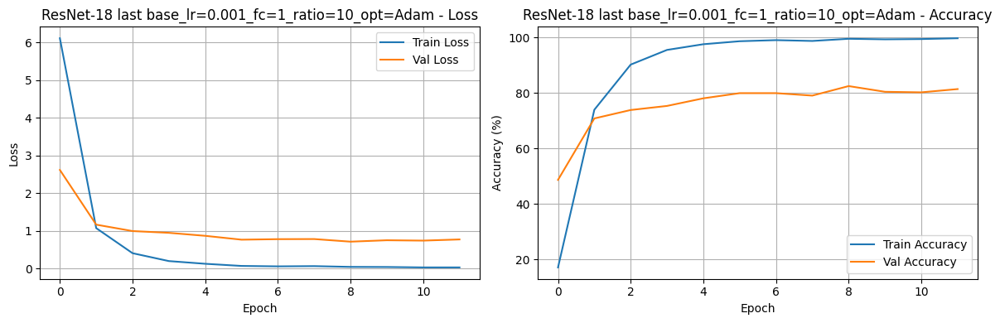


Training ResNet-18 with last trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 7.4046, Train Acc: 19.12%, Val Loss: 8.1984, Val Acc: 46.96%
Epoch 2: Train Loss: 3.7286, Train Acc: 66.18%, Val Loss: 2.1292, Val Acc: 65.78%
Epoch 3: Train Loss: 0.7688, Train Acc: 83.63%, Val Loss: 2.1648, Val Acc: 68.43%
Epoch 4: Train Loss: 0.4966, Train Acc: 90.20%, Val Loss: 1.9433, Val Acc: 68.82%
Epoch 5: Train Loss: 0.2409, Train Acc: 92.94%, Val Loss: 1.9671, Val Acc: 68.53%
Epoch 6: Train Loss: 0.2870, Train Acc: 94.61%, Val Loss: 1.6344, Val Acc: 71.86%
Epoch 7: Train Loss: 0.1585, Train Acc: 95.98%, Val Loss: 1.5259, Val Acc: 74.51%
Epoch 8: Train Loss: 0.1023, Train Acc: 97.35%, Val Loss: 1.7883, Val Acc: 72.84%
Epoch 9: Train Loss: 0.0703, Train Acc: 97.94%, Val Loss: 1.2672, Val Acc: 78.14%
Epoch 10: Train Loss: 0.0297, Trai

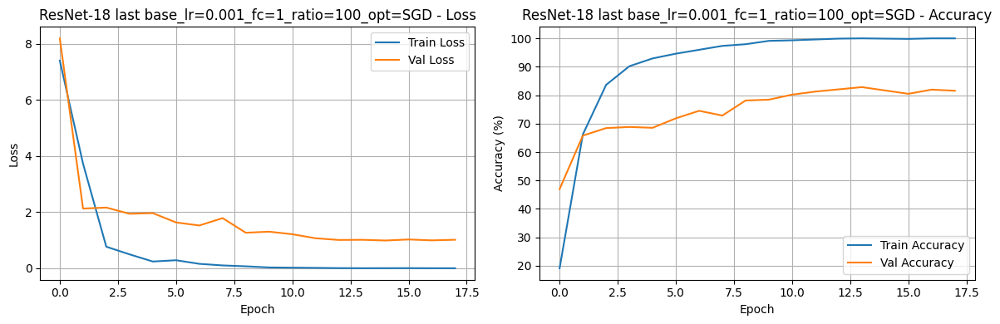


Training ResNet-18 with last trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 108.7404, Train Acc: 5.88%, Val Loss: 131.7071, Val Acc: 7.94%
Epoch 2: Train Loss: 61.6927, Train Acc: 32.45%, Val Loss: 21.8226, Val Acc: 46.96%
Epoch 3: Train Loss: 9.3950, Train Acc: 67.06%, Val Loss: 10.4764, Val Acc: 58.04%
Epoch 4: Train Loss: 2.9406, Train Acc: 82.55%, Val Loss: 6.9546, Val Acc: 64.41%
Epoch 5: Train Loss: 1.6615, Train Acc: 87.25%, Val Loss: 6.5418, Val Acc: 67.84%
Epoch 6: Train Loss: 1.4939, Train Acc: 88.63%, Val Loss: 7.1598, Val Acc: 66.37%
Epoch 7: Train Loss: 1.9234, Train Acc: 88.82%, Val Loss: 8.7309, Val Acc: 62.84%
Epoch 8: Train Loss: 2.0441, Train Acc: 89.41%, Val Loss: 6.8017, Val Acc: 70.98%
Early stopping triggered after epoch 8
Test Accuracy: 68.50%


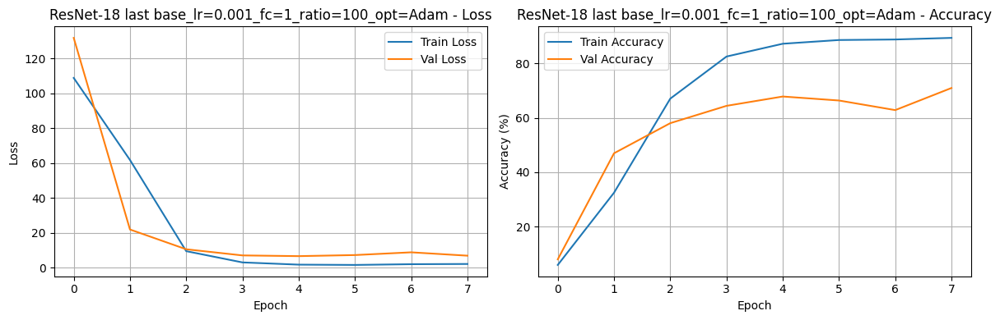


Training ResNet-18 with last trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 4.6172, Train Acc: 2.16%, Val Loss: 4.3399, Val Acc: 17.55%
Epoch 2: Train Loss: 4.1385, Train Acc: 12.75%, Val Loss: 3.7081, Val Acc: 33.73%
Epoch 3: Train Loss: 3.3438, Train Acc: 30.00%, Val Loss: 2.8587, Val Acc: 49.51%
Epoch 4: Train Loss: 2.4816, Train Acc: 45.00%, Val Loss: 2.0622, Val Acc: 64.22%
Epoch 5: Train Loss: 1.7996, Train Acc: 59.22%, Val Loss: 1.6971, Val Acc: 63.33%
Epoch 6: Train Loss: 1.3928, Train Acc: 68.24%, Val Loss: 1.3863, Val Acc: 70.88%
Epoch 7: Train Loss: 1.0800, Train Acc: 75.69%, Val Loss: 1.2003, Val Acc: 73.33%
Epoch 8: Train Loss: 0.9097, Train Acc: 78.43%, Val Loss: 1.0731, Val Acc: 75.10%
Epoch 9: Train Loss: 0.7485, Train Acc: 82.84%, Val Loss: 0.9633, Val Acc: 77.16%
Epoch 10: Train Loss: 0.6721, Train

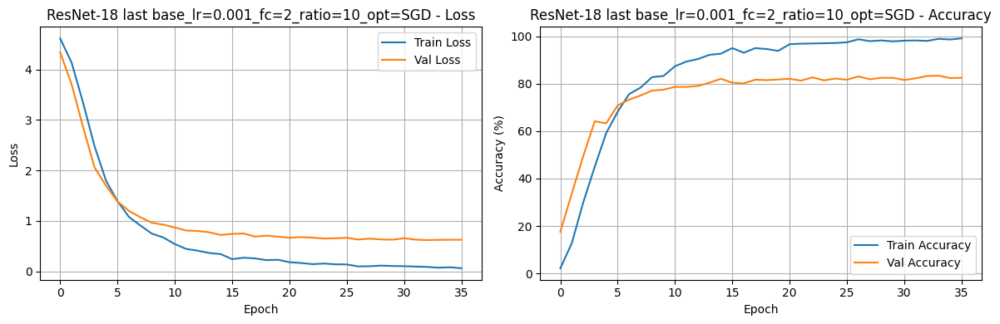


Training ResNet-18 with last trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 5.5940, Train Acc: 1.18%, Val Loss: 4.6056, Val Acc: 2.45%
Epoch 2: Train Loss: 4.5829, Train Acc: 2.25%, Val Loss: 4.5250, Val Acc: 4.31%
Epoch 3: Train Loss: 4.4710, Train Acc: 2.45%, Val Loss: 4.3577, Val Acc: 4.31%
Epoch 4: Train Loss: 4.4404, Train Acc: 3.04%, Val Loss: 4.1696, Val Acc: 7.16%
Epoch 5: Train Loss: 4.4298, Train Acc: 2.94%, Val Loss: 4.1836, Val Acc: 5.39%
Epoch 6: Train Loss: 4.4111, Train Acc: 2.45%, Val Loss: 4.1208, Val Acc: 6.76%
Epoch 7: Train Loss: 4.3754, Train Acc: 2.84%, Val Loss: 4.1164, Val Acc: 8.43%
Epoch 8: Train Loss: 4.3633, Train Acc: 3.04%, Val Loss: 4.0350, Val Acc: 8.04%
Epoch 9: Train Loss: 4.2775, Train Acc: 3.14%, Val Loss: 4.0003, Val Acc: 8.24%
Epoch 10: Train Loss: 4.2707, Train Acc: 4.02%, Val

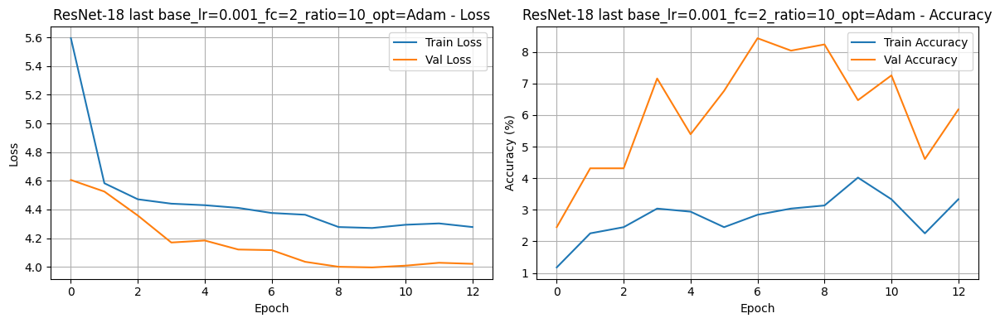


Training ResNet-18 with last trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 4.6248, Train Acc: 3.04%, Val Loss: 4.0859, Val Acc: 9.80%
Epoch 2: Train Loss: 4.3823, Train Acc: 7.06%, Val Loss: 4.3759, Val Acc: 5.69%
Epoch 3: Train Loss: 4.5004, Train Acc: 2.94%, Val Loss: 4.4003, Val Acc: 5.98%
Epoch 4: Train Loss: 4.5457, Train Acc: 2.84%, Val Loss: 4.5351, Val Acc: 2.84%
Early stopping triggered after epoch 4
Test Accuracy: 3.33%


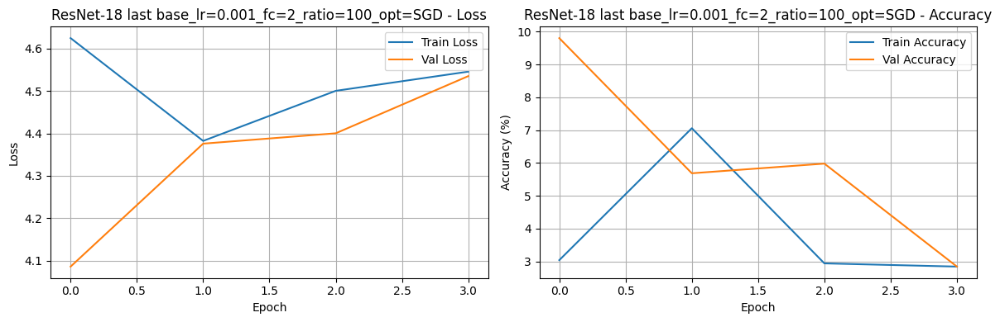


Training ResNet-18 with last trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 57.6413, Train Acc: 0.98%, Val Loss: 4.6359, Val Acc: 1.08%
Epoch 2: Train Loss: 4.7565, Train Acc: 0.88%, Val Loss: 4.6306, Val Acc: 0.98%
Epoch 3: Train Loss: 5.2460, Train Acc: 0.29%, Val Loss: 7.9277, Val Acc: 1.67%
Epoch 4: Train Loss: 4.9022, Train Acc: 0.59%, Val Loss: 4.6287, Val Acc: 0.98%
Epoch 5: Train Loss: 5.2162, Train Acc: 0.29%, Val Loss: 4.6311, Val Acc: 0.98%
Epoch 6: Train Loss: 4.6869, Train Acc: 0.78%, Val Loss: 4.6278, Val Acc: 0.98%
Epoch 7: Train Loss: 4.6756, Train Acc: 0.39%, Val Loss: 11.2801, Val Acc: 1.57%
Early stopping triggered after epoch 7
Test Accuracy: 1.20%


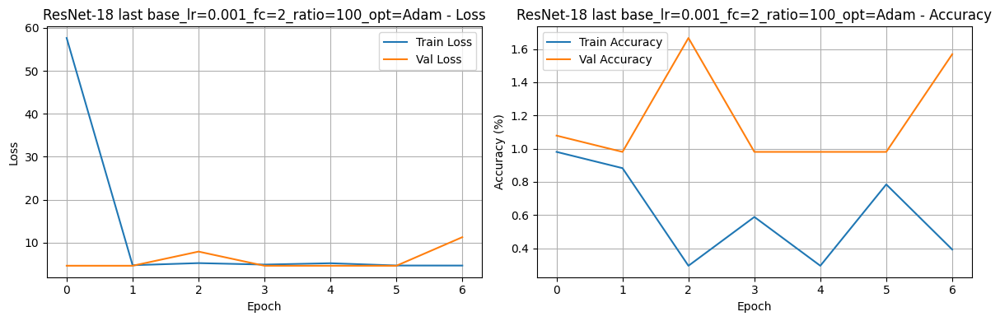


Training ResNet-18 with last trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 4.7705, Train Acc: 1.86%, Val Loss: 4.5842, Val Acc: 2.94%
Epoch 2: Train Loss: 4.4579, Train Acc: 4.51%, Val Loss: 4.3470, Val Acc: 7.35%
Epoch 3: Train Loss: 4.1832, Train Acc: 11.76%, Val Loss: 4.1272, Val Acc: 14.71%
Epoch 4: Train Loss: 3.9368, Train Acc: 25.29%, Val Loss: 3.9114, Val Acc: 24.61%
Epoch 5: Train Loss: 3.7039, Train Acc: 36.57%, Val Loss: 3.7120, Val Acc: 33.63%
Epoch 6: Train Loss: 3.4773, Train Acc: 47.84%, Val Loss: 3.5272, Val Acc: 41.37%
Epoch 7: Train Loss: 3.2513, Train Acc: 57.94%, Val Loss: 3.3504, Val Acc: 49.31%
Epoch 8: Train Loss: 3.0400, Train Acc: 65.59%, Val Loss: 3.1849, Val Acc: 54.22%
Epoch 9: Train Loss: 2.8679, Train Acc: 69.12%, Val Loss: 3.0167, Val Acc: 59.31%
Epoch 10: Train Loss: 2.6717, Train Ac

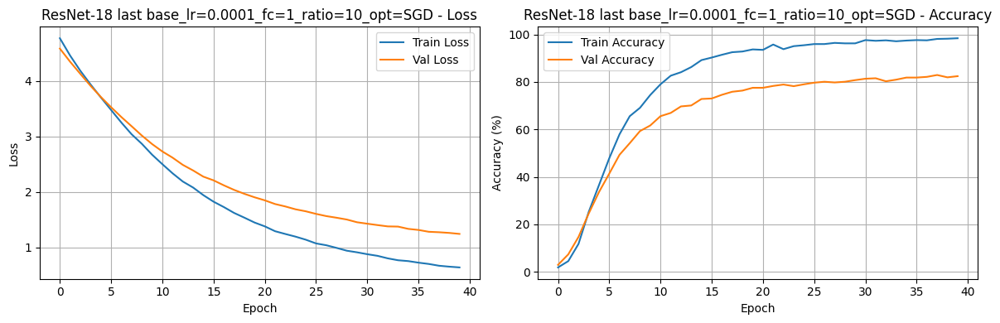


Training ResNet-18 with last trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 4.5861, Train Acc: 5.10%, Val Loss: 3.8088, Val Acc: 20.69%
Epoch 2: Train Loss: 3.2265, Train Acc: 42.75%, Val Loss: 2.9198, Val Acc: 51.76%
Epoch 3: Train Loss: 2.3253, Train Acc: 70.69%, Val Loss: 2.2876, Val Acc: 66.96%
Epoch 4: Train Loss: 1.6918, Train Acc: 84.41%, Val Loss: 1.8525, Val Acc: 73.92%
Epoch 5: Train Loss: 1.2301, Train Acc: 91.18%, Val Loss: 1.5870, Val Acc: 76.57%
Epoch 6: Train Loss: 0.9365, Train Acc: 94.22%, Val Loss: 1.3996, Val Acc: 77.45%
Epoch 7: Train Loss: 0.7294, Train Acc: 97.16%, Val Loss: 1.2482, Val Acc: 80.39%
Epoch 8: Train Loss: 0.5845, Train Acc: 97.45%, Val Loss: 1.1418, Val Acc: 81.27%
Epoch 9: Train Loss: 0.4941, Train Acc: 98.24%, Val Loss: 1.0782, Val Acc: 79.71%
Epoch 10: Train Loss: 0.4076, Trai

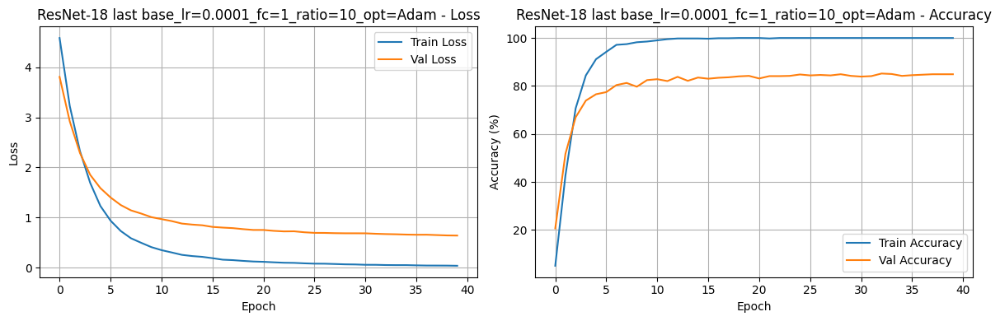


Training ResNet-18 with last trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 4.4433, Train Acc: 5.59%, Val Loss: 3.4462, Val Acc: 28.04%
Epoch 2: Train Loss: 2.5604, Train Acc: 53.53%, Val Loss: 2.2043, Val Acc: 57.45%
Epoch 3: Train Loss: 1.4245, Train Acc: 79.31%, Val Loss: 1.5687, Val Acc: 70.00%
Epoch 4: Train Loss: 0.8822, Train Acc: 90.20%, Val Loss: 1.2690, Val Acc: 75.49%
Epoch 5: Train Loss: 0.6222, Train Acc: 94.61%, Val Loss: 1.1081, Val Acc: 78.73%
Epoch 6: Train Loss: 0.4541, Train Acc: 96.37%, Val Loss: 1.0042, Val Acc: 80.59%
Epoch 7: Train Loss: 0.3727, Train Acc: 97.65%, Val Loss: 0.9343, Val Acc: 80.69%
Epoch 8: Train Loss: 0.2903, Train Acc: 98.63%, Val Loss: 0.8772, Val Acc: 82.35%
Epoch 9: Train Loss: 0.2304, Train Acc: 99.51%, Val Loss: 0.8415, Val Acc: 82.55%
Epoch 10: Train Loss: 0.2067, Trai

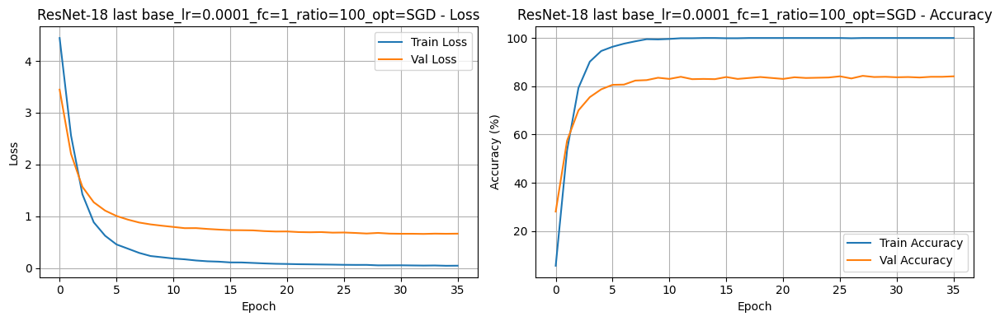


Training ResNet-18 with last trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 52,326
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 5.9422, Train Acc: 17.06%, Val Loss: 2.5491, Val Acc: 45.59%
Epoch 2: Train Loss: 1.1689, Train Acc: 72.84%, Val Loss: 1.4034, Val Acc: 64.71%
Epoch 3: Train Loss: 0.3717, Train Acc: 90.10%, Val Loss: 1.1219, Val Acc: 72.45%
Epoch 4: Train Loss: 0.1812, Train Acc: 95.88%, Val Loss: 0.9269, Val Acc: 75.29%
Epoch 5: Train Loss: 0.0886, Train Acc: 98.43%, Val Loss: 0.8599, Val Acc: 77.35%
Epoch 6: Train Loss: 0.0530, Train Acc: 99.22%, Val Loss: 0.7703, Val Acc: 80.59%
Epoch 7: Train Loss: 0.0437, Train Acc: 99.41%, Val Loss: 0.7053, Val Acc: 82.75%
Epoch 8: Train Loss: 0.0284, Train Acc: 99.90%, Val Loss: 0.6849, Val Acc: 81.18%
Epoch 9: Train Loss: 0.0228, Train Acc: 99.71%, Val Loss: 0.6854, Val Acc: 82.06%
Epoch 10: Train Loss: 0.0159, Tr

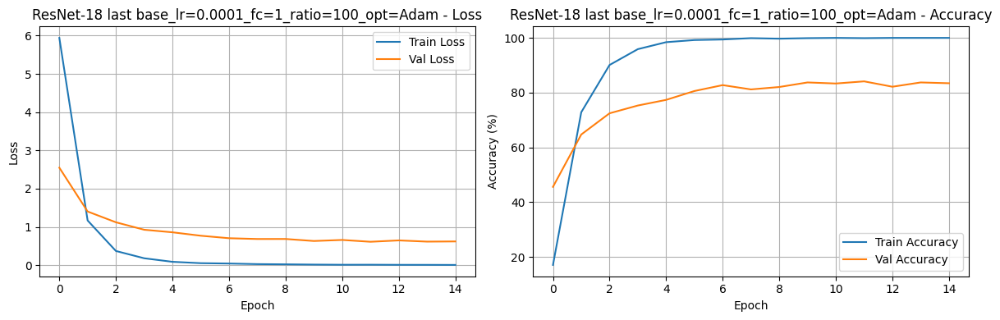


Training ResNet-18 with last trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 4.6997, Train Acc: 0.20%, Val Loss: 4.6235, Val Acc: 1.47%
Epoch 2: Train Loss: 4.6077, Train Acc: 1.76%, Val Loss: 4.5567, Val Acc: 3.92%
Epoch 3: Train Loss: 4.5320, Train Acc: 4.12%, Val Loss: 4.4953, Val Acc: 7.06%
Epoch 4: Train Loss: 4.4459, Train Acc: 5.69%, Val Loss: 4.4346, Val Acc: 11.96%
Epoch 5: Train Loss: 4.3744, Train Acc: 7.94%, Val Loss: 4.3720, Val Acc: 17.35%
Epoch 6: Train Loss: 4.3066, Train Acc: 14.02%, Val Loss: 4.3014, Val Acc: 23.92%
Epoch 7: Train Loss: 4.2320, Train Acc: 13.63%, Val Loss: 4.2243, Val Acc: 29.71%
Epoch 8: Train Loss: 4.1297, Train Acc: 18.33%, Val Loss: 4.1403, Val Acc: 35.39%
Epoch 9: Train Loss: 4.0503, Train Acc: 21.76%, Val Loss: 4.0482, Val Acc: 39.22%
Epoch 10: Train Loss: 3.9648, Train Acc: 

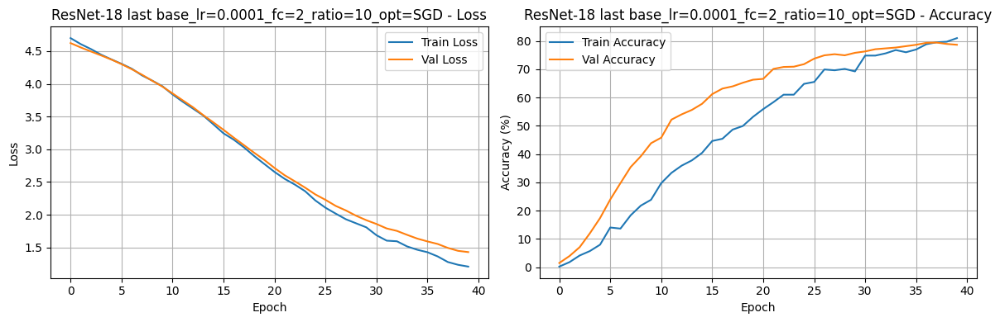


Training ResNet-18 with last trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 4.6727, Train Acc: 2.65%, Val Loss: 4.3273, Val Acc: 17.94%
Epoch 2: Train Loss: 4.0993, Train Acc: 12.75%, Val Loss: 3.6572, Val Acc: 36.37%
Epoch 3: Train Loss: 3.3423, Train Acc: 28.53%, Val Loss: 2.8224, Val Acc: 56.96%
Epoch 4: Train Loss: 2.5803, Train Acc: 42.94%, Val Loss: 2.1935, Val Acc: 63.73%
Epoch 5: Train Loss: 2.0457, Train Acc: 55.78%, Val Loss: 1.8146, Val Acc: 66.76%
Epoch 6: Train Loss: 1.6495, Train Acc: 62.45%, Val Loss: 1.4759, Val Acc: 74.02%
Epoch 7: Train Loss: 1.3503, Train Acc: 67.55%, Val Loss: 1.3036, Val Acc: 74.61%
Epoch 8: Train Loss: 1.1420, Train Acc: 73.53%, Val Loss: 1.1504, Val Acc: 76.67%
Epoch 9: Train Loss: 0.9766, Train Acc: 77.84%, Val Loss: 1.0807, Val Acc: 77.25%
Epoch 10: Train Loss: 0.9013, Tra

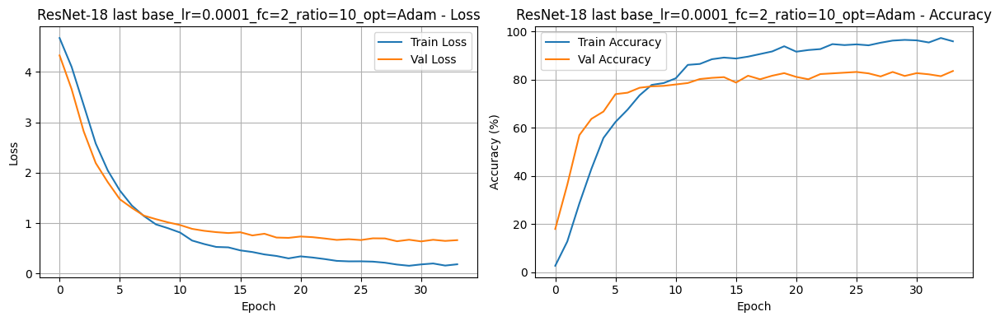


Training ResNet-18 with last trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 4.6218, Train Acc: 1.86%, Val Loss: 4.3340, Val Acc: 18.24%
Epoch 2: Train Loss: 4.1187, Train Acc: 13.73%, Val Loss: 3.6995, Val Acc: 31.86%
Epoch 3: Train Loss: 3.3340, Train Acc: 29.61%, Val Loss: 2.9075, Val Acc: 40.78%
Epoch 4: Train Loss: 2.5157, Train Acc: 44.71%, Val Loss: 2.0916, Val Acc: 58.33%
Epoch 5: Train Loss: 1.8516, Train Acc: 59.22%, Val Loss: 1.6576, Val Acc: 68.04%
Epoch 6: Train Loss: 1.3931, Train Acc: 68.14%, Val Loss: 1.3433, Val Acc: 70.39%
Epoch 7: Train Loss: 1.1393, Train Acc: 72.06%, Val Loss: 1.2283, Val Acc: 71.96%
Epoch 8: Train Loss: 0.9410, Train Acc: 76.47%, Val Loss: 1.0995, Val Acc: 74.31%
Epoch 9: Train Loss: 0.7607, Train Acc: 80.88%, Val Loss: 0.9586, Val Acc: 76.67%
Epoch 10: Train Loss: 0.6094, Tra

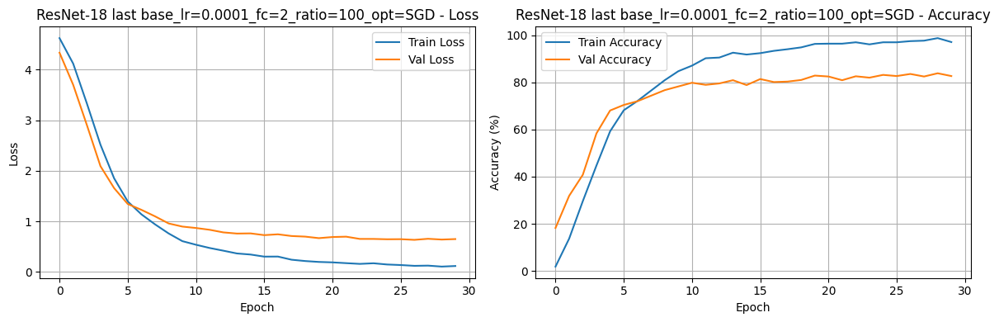


Training ResNet-18 with last trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 314,982
Total Frozen Parameters: 11,176,512
Epoch 1: Train Loss: 5.5557, Train Acc: 1.67%, Val Loss: 4.5446, Val Acc: 3.04%
Epoch 2: Train Loss: 4.5131, Train Acc: 3.14%, Val Loss: 4.3145, Val Acc: 8.24%
Epoch 3: Train Loss: 4.4101, Train Acc: 3.14%, Val Loss: 4.1766, Val Acc: 6.18%
Epoch 4: Train Loss: 4.4015, Train Acc: 3.04%, Val Loss: 4.0402, Val Acc: 6.67%
Epoch 5: Train Loss: 4.2804, Train Acc: 2.75%, Val Loss: 3.9344, Val Acc: 8.24%
Epoch 6: Train Loss: 4.1932, Train Acc: 3.24%, Val Loss: 3.8293, Val Acc: 10.10%
Epoch 7: Train Loss: 4.1882, Train Acc: 4.22%, Val Loss: 3.8138, Val Acc: 9.51%
Epoch 8: Train Loss: 4.2318, Train Acc: 3.24%, Val Loss: 3.8634, Val Acc: 8.43%
Epoch 9: Train Loss: 4.1359, Train Acc: 3.53%, Val Loss: 3.6521, Val Acc: 12.06%
Epoch 10: Train Loss: 4.1671, Train Acc: 4.41%,

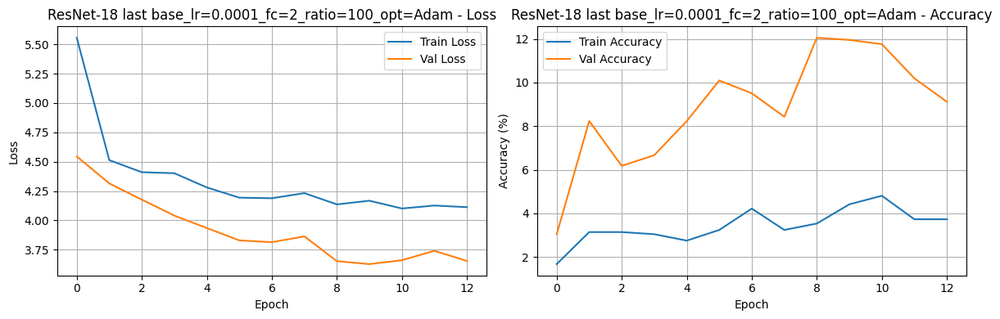

,base_lr,ratio,fc_layers,optimizer,final_val_accuracy,test_accuracy,final_train_loss,final_train_accuracy,final_val_loss
0,0.0010,10,1,SGD,83.921569,82.094650,0.045923,100.000000,0.667294
1,0.0010,10,1,Adam,81.372549,79.086030,0.025360,99.705882,0.769012
2,0.0010,100,1,SGD,81.568627,79.297447,0.001230,100.000000,1.017119
3,0.0010,100,1,Adam,70.980392,68.498943,2.044073,89.411765,6.801654
4,0.0010,10,2,SGD,82.549020,81.379086,0.062731,99.215686,0.626522
5,0.0010,10,2,Adam,6.176471,10.196780,4.277426,3.333333,4.020916
6,0.0010,100,2,SGD,2.843137,3.333875,4.545725,2.843137,4.535141
7,0.0010,100,2,Adam,1.568627,1.203448,4.675552,0.392157,11.280050
8,0.0001,10,1,SGD,82.450980,79.297447,0.640323,98.431373,1.244125
9,0.0001,10,1,Adam,84.901961,82.745162,0.034890,100.000000,0.638476


In [14]:
Optimizers = [
    lambda model, base_lr, ratio: optim.SGD(get_parameter_groups(model, base_lr, ratio), momentum=0.9),
    lambda model, base_lr, ratio: optim.Adam(get_parameter_groups(model, base_lr, ratio))

]
optimizer_names = ['SGD','Adam']
LRs = [0.001, 0.0001]
FCs = [1, 2]
Ratios = [10, 100]
all_results = []
for base_lr in LRs:
    for fc_layers in FCs:
        for ratio in Ratios:
            for opt_func, opt_name in zip(Optimizers, optimizer_names):
                res80 = models.resnet18
                model_name = "ResNet-18"
                trainable = "last"

                print(f"\nTraining {model_name} with {trainable} trainable parameters, "
                      f"base_lr={base_lr}, fc_layers={fc_layers}, ratio={ratio}, optimizer={opt_name}")

                # Load and modify model
                model = res80(pretrained=True)
                model = modify_model(model, num_layers=fc_layers).to(device)

                # Set trainable layers
                set_trainable_layers(model, trainable,0)

                # Print model structure
                print_model_structure(model,base_lr,ratio)

                # Train model with specified optimizer
                optimizer = opt_func(model, base_lr, ratio)
                train_losses, train_accuracies, val_losses, val_accuracies = train_model(
                    model, trainloader, valloader,optimizer, num_epochs=40, patience=3, min_delta=0.001,
                base_lr=base_lr,ratio=ratio)

                # Evaluate on test set
                test_acc = evaluate_model(model, testloader)
                print(f'Test Accuracy: {test_acc:.2f}%')

                # Store results
                results = {
                    'train_losses': train_losses,
                    'train_accuracies': train_accuracies,
                    'val_losses': val_losses,
                    'val_accuracies': val_accuracies,
                    'final_val_accuracy': val_accuracies[-1],
                    'test_accuracy': test_acc,
                    'base_lr': base_lr,
                    'ratio': ratio,
                    'fc_layers': fc_layers,
                    'optimizer': opt_name
                }
                all_results.append(results)

                # Plot metrics
                plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies,
                             f"{model_name} {trainable} base_lr={base_lr}_fc={fc_layers}_ratio={ratio}_opt={opt_name}")
results_df = pd.DataFrame([
    {
        'base_lr': res['base_lr'],
        'ratio': res['ratio'],
        'fc_layers': res['fc_layers'],
        'optimizer': res['optimizer'],
        'final_val_accuracy': res['final_val_accuracy'],
        'test_accuracy': res['test_accuracy'],
        'final_train_loss': res['train_losses'][-1],
        'final_train_accuracy': res['train_accuracies'][-1],
        'final_val_loss': res['val_losses'][-1]
    } for res in all_results
])
results_df

## DenseNet

### 80% trainable

#### Hyper parameter tuning


Training DenseNet-121 with 80% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=SGD


C:\Users\Kia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Kia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Total Trainable Parameters in Group 1: 5,655,296
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 1,298,560
Epoch 1: Train Loss: 4.3298, Train Acc: 9.71%, Val Loss: 3.1185, Val Acc: 38.14%
Epoch 2: Train Loss: 1.8647, Train Acc: 72.75%, Val Loss: 1.3976, Val Acc: 73.33%
Epoch 3: Train Loss: 0.7031, Train Acc: 91.96%, Val Loss: 0.8529, Val Acc: 83.82%
Epoch 4: Train Loss: 0.2899, Train Acc: 98.43%, Val Loss: 0.6589, Val Acc: 87.55%
Epoch 5: Train Loss: 0.1614, Train Acc: 99.80%, Val Loss: 0.5811, Val Acc: 87.84%
Epoch 6: Train Loss: 0.0944, Train Acc: 100.00%, Val Loss: 0.5256, Val Acc: 90.29%
Epoch 7: Train Loss: 0.0742, Train Acc: 100.00%, Val Loss: 0.4979, Val Acc: 90.20%
Epoch 8: Train Loss: 0.0619, Train Acc: 100.00%, Val Loss: 0.4851, Val Acc: 89.90%
Epoch 9: Train Loss: 0.0483, Train Acc: 100.00%, Val Loss: 0.4599, Val Acc: 90.39%
Epoch 10: Train Loss: 0.0458, Train Acc: 100.00%, Val Loss: 0.4594, Val Acc: 90.49%
Epoch 11: Train Loss: 0.0376, Train Acc: 100

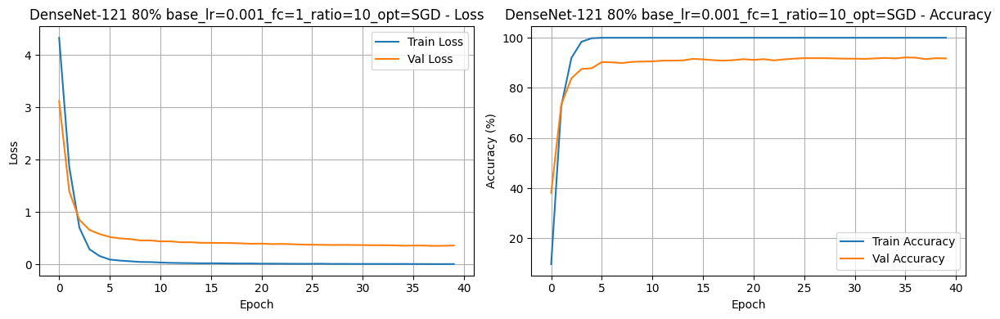


Training DenseNet-121 with 80% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 5,655,296
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 1,298,560
Epoch 1: Train Loss: 5.5016, Train Acc: 12.45%, Val Loss: 5.0590, Val Acc: 27.65%
Epoch 2: Train Loss: 1.8506, Train Acc: 55.00%, Val Loss: 1.8303, Val Acc: 60.39%
Epoch 3: Train Loss: 0.8170, Train Acc: 78.63%, Val Loss: 1.4168, Val Acc: 68.82%
Epoch 4: Train Loss: 0.5353, Train Acc: 85.88%, Val Loss: 0.9819, Val Acc: 76.67%
Epoch 5: Train Loss: 0.2430, Train Acc: 93.43%, Val Loss: 1.0264, Val Acc: 78.53%
Epoch 6: Train Loss: 0.1907, Train Acc: 95.10%, Val Loss: 0.8370, Val Acc: 80.59%
Epoch 7: Train Loss: 0.0985, Train Acc: 97.16%, Val Loss: 0.7097, Val Acc: 85.88%
Epoch 8: Train Loss: 0.0595, Train Acc: 98.33%, Val Loss: 0.9985, Val Acc: 80.88%
Epoch 9: Train Loss: 0.1294, Train Acc: 96.67%, Val Loss: 0.9032, Val Acc: 82.65%
Epoch 10: Train Loss: 0.

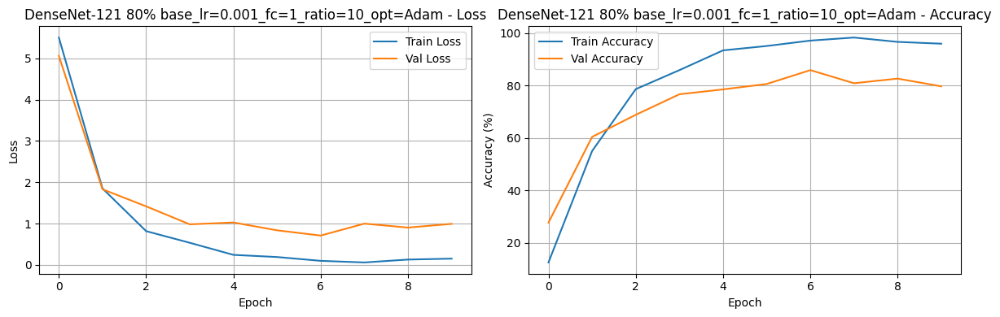


Training DenseNet-121 with 80% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 5,655,296
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 1,298,560
Epoch 1: Train Loss: 6.1349, Train Acc: 24.31%, Val Loss: 4.8990, Val Acc: 55.59%
Epoch 2: Train Loss: 1.6733, Train Acc: 76.47%, Val Loss: 1.6824, Val Acc: 71.57%
Epoch 3: Train Loss: 0.4685, Train Acc: 89.02%, Val Loss: 1.1476, Val Acc: 79.71%
Epoch 4: Train Loss: 0.2434, Train Acc: 95.88%, Val Loss: 0.9769, Val Acc: 83.04%
Epoch 5: Train Loss: 0.0616, Train Acc: 98.43%, Val Loss: 1.0749, Val Acc: 83.04%
Epoch 6: Train Loss: 0.0399, Train Acc: 98.63%, Val Loss: 0.8105, Val Acc: 85.59%
Epoch 7: Train Loss: 0.0125, Train Acc: 99.61%, Val Loss: 0.7302, Val Acc: 87.75%
Epoch 8: Train Loss: 0.0181, Train Acc: 99.51%, Val Loss: 0.6829, Val Acc: 87.25%
Epoch 9: Train Loss: 0.0056, Train Acc: 99.71%, Val Loss: 0.5575, Val Acc: 89.71%
Epoch 10: Train Loss: 0.

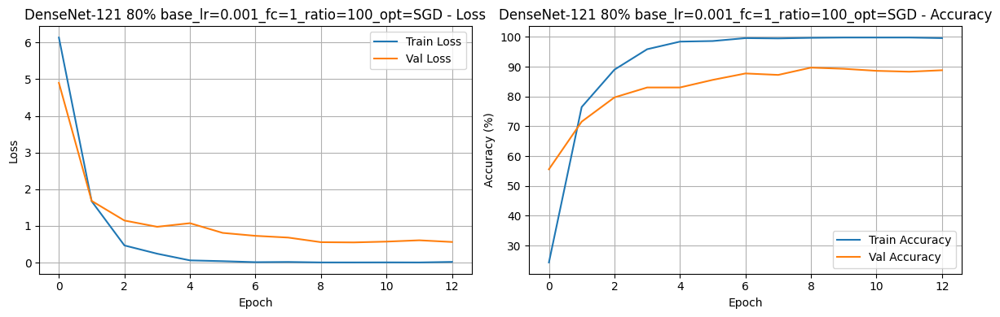


Training DenseNet-121 with 80% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 5,655,296
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 1,298,560
Epoch 1: Train Loss: 68.8316, Train Acc: 1.47%, Val Loss: 400.9593, Val Acc: 0.98%
Epoch 2: Train Loss: 42.3260, Train Acc: 2.35%, Val Loss: 199.1592, Val Acc: 2.75%
Epoch 3: Train Loss: 33.8622, Train Acc: 3.33%, Val Loss: 22.4863, Val Acc: 3.14%
Epoch 4: Train Loss: 25.5739, Train Acc: 2.55%, Val Loss: 45.3139, Val Acc: 6.47%
Epoch 5: Train Loss: 28.6699, Train Acc: 5.78%, Val Loss: 49.6237, Val Acc: 9.02%
Epoch 6: Train Loss: 22.7372, Train Acc: 11.76%, Val Loss: 424.4927, Val Acc: 16.27%
Early stopping triggered after epoch 6
Test Accuracy: 15.19%


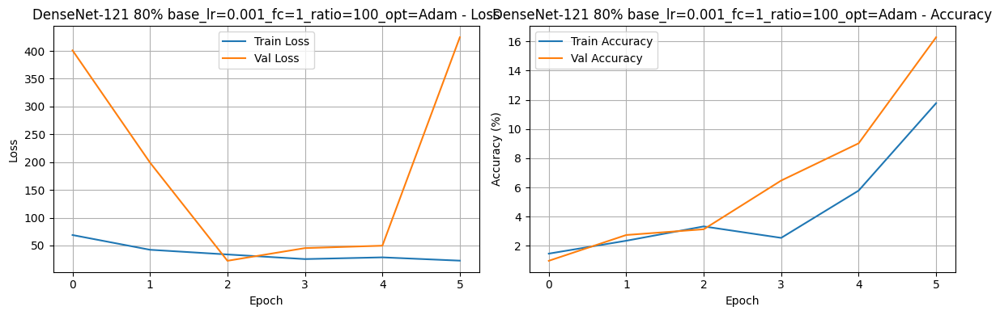


Training DenseNet-121 with 80% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 5,453,248
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 1,500,608
Epoch 1: Train Loss: 4.6037, Train Acc: 2.35%, Val Loss: 4.3511, Val Acc: 20.39%
Epoch 2: Train Loss: 4.1070, Train Acc: 16.18%, Val Loss: 3.6019, Val Acc: 42.65%
Epoch 3: Train Loss: 3.1660, Train Acc: 33.63%, Val Loss: 2.3845, Val Acc: 60.88%
Epoch 4: Train Loss: 2.0377, Train Acc: 52.65%, Val Loss: 1.5123, Val Acc: 71.08%
Epoch 5: Train Loss: 1.2761, Train Acc: 67.65%, Val Loss: 1.0479, Val Acc: 76.18%
Epoch 6: Train Loss: 0.7697, Train Acc: 82.06%, Val Loss: 0.7639, Val Acc: 83.33%
Epoch 7: Train Loss: 0.5422, Train Acc: 87.94%, Val Loss: 0.6456, Val Acc: 85.29%
Epoch 8: Train Loss: 0.3927, Train Acc: 91.57%, Val Loss: 0.5802, Val Acc: 85.69%
Epoch 9: Train Loss: 0.2406, Train Acc: 95.98%, Val Loss: 0.5028, Val Acc: 88.14%
Epoch 10: Train Loss: 0.18

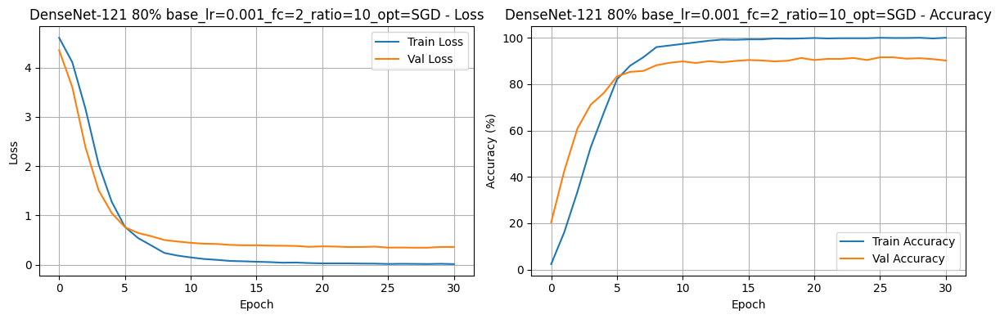


Training DenseNet-121 with 80% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 5,453,248
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 1,500,608
Epoch 1: Train Loss: 5.1370, Train Acc: 0.98%, Val Loss: 4.5928, Val Acc: 1.86%
Epoch 2: Train Loss: 4.6246, Train Acc: 1.08%, Val Loss: 4.6189, Val Acc: 1.47%
Epoch 3: Train Loss: 4.6303, Train Acc: 0.39%, Val Loss: 4.6253, Val Acc: 0.98%
Epoch 4: Train Loss: 4.6305, Train Acc: 0.10%, Val Loss: 4.6252, Val Acc: 0.98%
Early stopping triggered after epoch 4
Test Accuracy: 0.33%


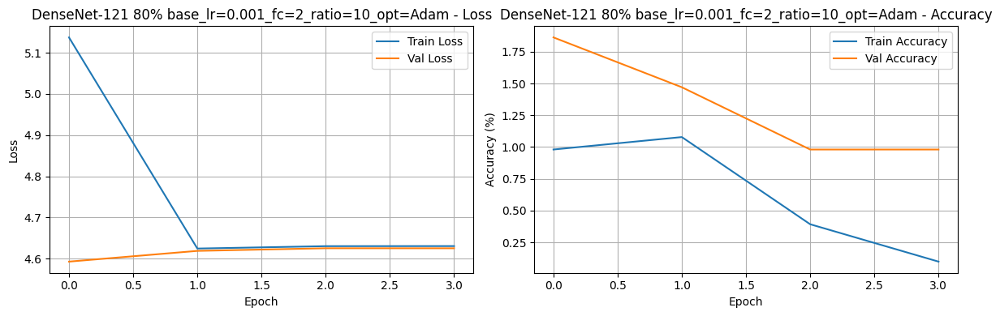


Training DenseNet-121 with 80% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 5,453,248
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 1,500,608
Epoch 1: Train Loss: 4.6504, Train Acc: 1.96%, Val Loss: 4.1201, Val Acc: 10.00%
Epoch 2: Train Loss: 4.3386, Train Acc: 5.78%, Val Loss: 4.0817, Val Acc: 12.16%
Epoch 3: Train Loss: 4.4169, Train Acc: 5.69%, Val Loss: 4.4272, Val Acc: 7.25%
Epoch 4: Train Loss: 4.4999, Train Acc: 3.82%, Val Loss: 4.4315, Val Acc: 6.76%
Epoch 5: Train Loss: 4.5518, Train Acc: 2.16%, Val Loss: 4.4617, Val Acc: 5.29%
Early stopping triggered after epoch 5
Test Accuracy: 4.63%


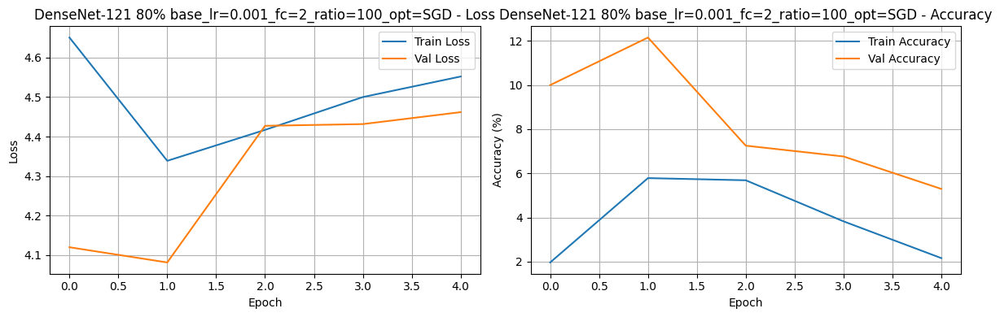


Training DenseNet-121 with 80% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 5,453,248
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 1,500,608
Epoch 1: Train Loss: 47.4116, Train Acc: 0.69%, Val Loss: 4.6409, Val Acc: 0.98%
Epoch 2: Train Loss: 4.6757, Train Acc: 0.59%, Val Loss: 4.6328, Val Acc: 0.98%
Epoch 3: Train Loss: 4.6784, Train Acc: 0.78%, Val Loss: 4.6289, Val Acc: 0.98%
Epoch 4: Train Loss: 4.6759, Train Acc: 0.39%, Val Loss: 4.6288, Val Acc: 0.98%
Epoch 5: Train Loss: 4.6784, Train Acc: 0.59%, Val Loss: 4.6291, Val Acc: 0.98%
Epoch 6: Train Loss: 4.6733, Train Acc: 0.39%, Val Loss: 4.6273, Val Acc: 0.98%
Epoch 7: Train Loss: 4.6733, Train Acc: 0.59%, Val Loss: 4.6293, Val Acc: 0.98%
Epoch 8: Train Loss: 4.6718, Train Acc: 0.39%, Val Loss: 4.6296, Val Acc: 0.98%
Epoch 9: Train Loss: 4.6791, Train Acc: 0.29%, Val Loss: 4.6285, Val Acc: 0.98%
Early stopping triggered after epoch 9
T

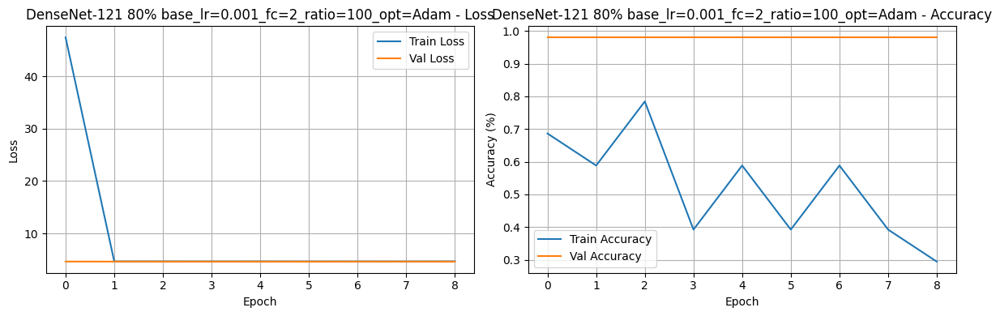


Training DenseNet-121 with 80% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 5,655,296
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 1,298,560
Epoch 1: Train Loss: 4.7012, Train Acc: 1.27%, Val Loss: 4.5189, Val Acc: 3.53%
Epoch 2: Train Loss: 4.3641, Train Acc: 7.16%, Val Loss: 4.2497, Val Acc: 14.41%
Epoch 3: Train Loss: 4.0447, Train Acc: 25.39%, Val Loss: 3.9815, Val Acc: 29.31%
Epoch 4: Train Loss: 3.7360, Train Acc: 46.86%, Val Loss: 3.7074, Val Acc: 44.22%
Epoch 5: Train Loss: 3.4004, Train Acc: 65.39%, Val Loss: 3.4327, Val Acc: 56.57%
Epoch 6: Train Loss: 3.0879, Train Acc: 76.18%, Val Loss: 3.1643, Val Acc: 65.00%
Epoch 7: Train Loss: 2.7859, Train Acc: 80.98%, Val Loss: 2.8911, Val Acc: 68.43%
Epoch 8: Train Loss: 2.4798, Train Acc: 86.57%, Val Loss: 2.6538, Val Acc: 74.02%
Epoch 9: Train Loss: 2.2070, Train Acc: 89.80%, Val Loss: 2.4196, Val Acc: 75.10%
Epoch 10: Train Loss: 1.960

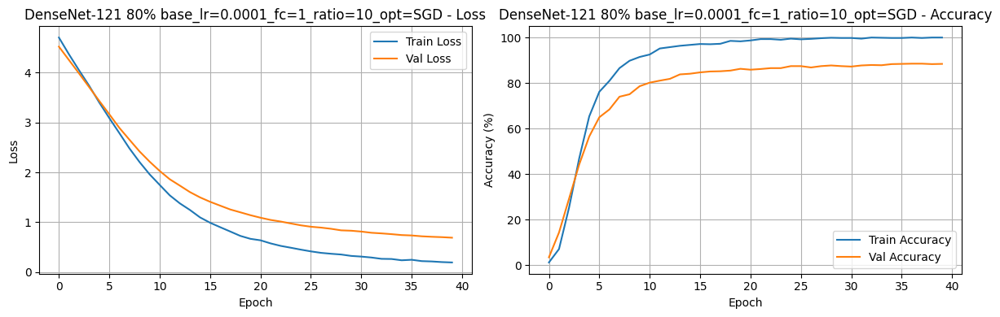


Training DenseNet-121 with 80% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 5,655,296
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 1,298,560
Epoch 1: Train Loss: 4.2842, Train Acc: 15.29%, Val Loss: 3.0057, Val Acc: 55.10%
Epoch 2: Train Loss: 1.9719, Train Acc: 80.78%, Val Loss: 1.6098, Val Acc: 80.98%
Epoch 3: Train Loss: 0.7726, Train Acc: 95.78%, Val Loss: 0.9802, Val Acc: 87.45%
Epoch 4: Train Loss: 0.3165, Train Acc: 99.31%, Val Loss: 0.7261, Val Acc: 89.71%
Epoch 5: Train Loss: 0.1449, Train Acc: 100.00%, Val Loss: 0.6168, Val Acc: 90.98%
Epoch 6: Train Loss: 0.0826, Train Acc: 100.00%, Val Loss: 0.5453, Val Acc: 91.18%
Epoch 7: Train Loss: 0.0552, Train Acc: 100.00%, Val Loss: 0.5107, Val Acc: 91.86%
Epoch 8: Train Loss: 0.0400, Train Acc: 100.00%, Val Loss: 0.4835, Val Acc: 90.88%
Epoch 9: Train Loss: 0.0319, Train Acc: 100.00%, Val Loss: 0.4497, Val Acc: 91.96%
Epoch 10: Train Lo

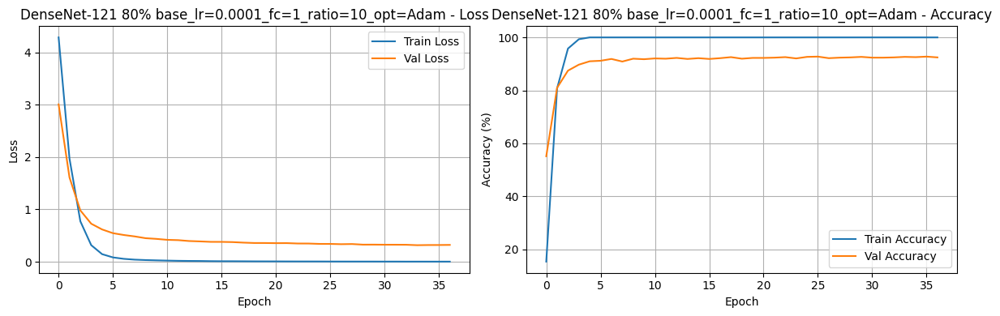


Training DenseNet-121 with 80% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 5,655,296
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 1,298,560
Epoch 1: Train Loss: 4.3623, Train Acc: 8.24%, Val Loss: 3.2984, Val Acc: 36.18%
Epoch 2: Train Loss: 2.3285, Train Acc: 59.61%, Val Loss: 1.8920, Val Acc: 68.92%
Epoch 3: Train Loss: 1.0468, Train Acc: 89.71%, Val Loss: 1.2130, Val Acc: 78.14%
Epoch 4: Train Loss: 0.5574, Train Acc: 95.98%, Val Loss: 0.9461, Val Acc: 82.65%
Epoch 5: Train Loss: 0.3286, Train Acc: 98.53%, Val Loss: 0.7858, Val Acc: 87.45%
Epoch 6: Train Loss: 0.2266, Train Acc: 99.61%, Val Loss: 0.7226, Val Acc: 87.25%
Epoch 7: Train Loss: 0.1694, Train Acc: 99.90%, Val Loss: 0.6816, Val Acc: 87.75%
Epoch 8: Train Loss: 0.1452, Train Acc: 99.80%, Val Loss: 0.6425, Val Acc: 88.63%
Epoch 9: Train Loss: 0.1162, Train Acc: 99.90%, Val Loss: 0.6181, Val Acc: 87.84%
Epoch 10: Train Loss: 0.

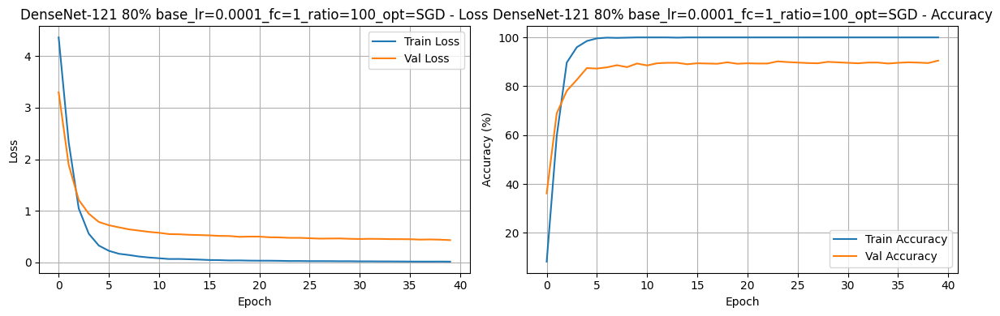


Training DenseNet-121 with 80% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 5,655,296
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 1,298,560
Epoch 1: Train Loss: 5.6915, Train Acc: 24.51%, Val Loss: 1.7508, Val Acc: 62.55%
Epoch 2: Train Loss: 0.4800, Train Acc: 86.57%, Val Loss: 0.5813, Val Acc: 84.31%
Epoch 3: Train Loss: 0.0836, Train Acc: 97.94%, Val Loss: 0.4894, Val Acc: 87.06%
Epoch 4: Train Loss: 0.0201, Train Acc: 99.90%, Val Loss: 0.3745, Val Acc: 90.29%
Epoch 5: Train Loss: 0.0108, Train Acc: 99.90%, Val Loss: 0.3485, Val Acc: 91.18%
Epoch 6: Train Loss: 0.0070, Train Acc: 99.90%, Val Loss: 0.3451, Val Acc: 91.08%
Epoch 7: Train Loss: 0.0110, Train Acc: 99.80%, Val Loss: 0.3461, Val Acc: 91.27%
Epoch 8: Train Loss: 0.0312, Train Acc: 99.02%, Val Loss: 0.3912, Val Acc: 89.41%
Epoch 9: Train Loss: 0.0055, Train Acc: 100.00%, Val Loss: 0.3888, Val Acc: 90.10%
Early stopping trigge

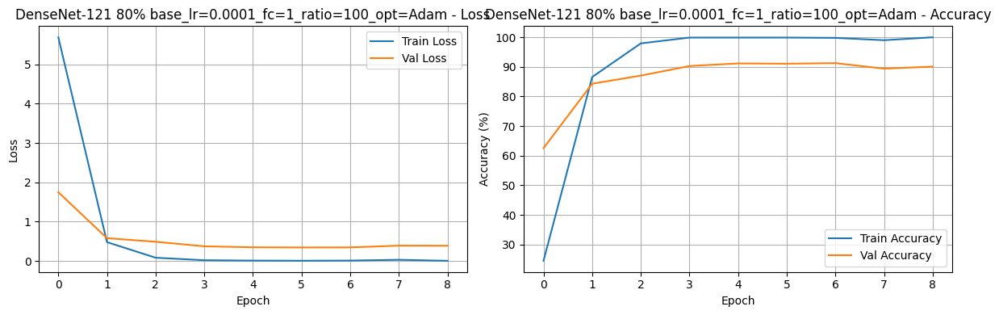


Training DenseNet-121 with 80% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 5,453,248
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 1,500,608
Epoch 1: Train Loss: 4.6560, Train Acc: 1.08%, Val Loss: 4.5995, Val Acc: 2.35%
Epoch 2: Train Loss: 4.5948, Train Acc: 2.25%, Val Loss: 4.5462, Val Acc: 4.90%
Epoch 3: Train Loss: 4.5281, Train Acc: 4.12%, Val Loss: 4.4934, Val Acc: 9.90%
Epoch 4: Train Loss: 4.4633, Train Acc: 6.67%, Val Loss: 4.4378, Val Acc: 15.00%
Epoch 5: Train Loss: 4.3855, Train Acc: 10.00%, Val Loss: 4.3766, Val Acc: 22.94%
Epoch 6: Train Loss: 4.3211, Train Acc: 14.12%, Val Loss: 4.3030, Val Acc: 29.71%
Epoch 7: Train Loss: 4.2530, Train Acc: 15.98%, Val Loss: 4.2275, Val Acc: 36.76%
Epoch 8: Train Loss: 4.1631, Train Acc: 23.24%, Val Loss: 4.1385, Val Acc: 42.25%
Epoch 9: Train Loss: 4.0623, Train Acc: 25.00%, Val Loss: 4.0441, Val Acc: 48.33%
Epoch 10: Train Loss: 3.9460, T

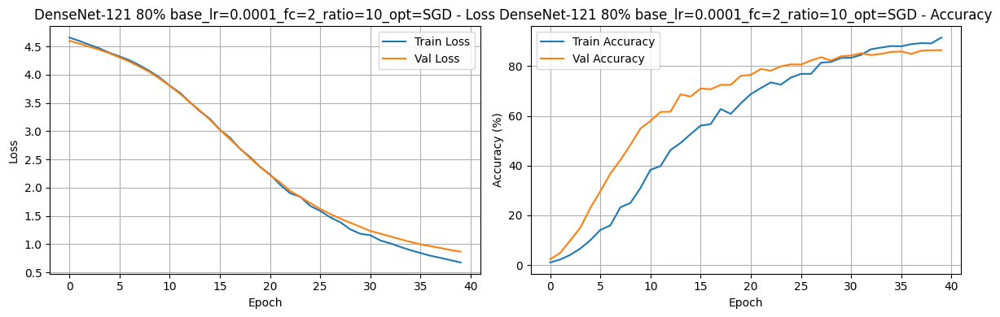


Training DenseNet-121 with 80% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 5,453,248
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 1,500,608
Epoch 1: Train Loss: 4.5632, Train Acc: 3.53%, Val Loss: 4.0821, Val Acc: 32.16%
Epoch 2: Train Loss: 3.4795, Train Acc: 27.65%, Val Loss: 2.5993, Val Acc: 55.78%
Epoch 3: Train Loss: 2.1637, Train Acc: 50.59%, Val Loss: 1.5543, Val Acc: 68.63%
Epoch 4: Train Loss: 1.1863, Train Acc: 73.24%, Val Loss: 0.9739, Val Acc: 81.47%
Epoch 5: Train Loss: 0.6817, Train Acc: 85.88%, Val Loss: 0.7048, Val Acc: 85.39%
Epoch 6: Train Loss: 0.3685, Train Acc: 93.24%, Val Loss: 0.5725, Val Acc: 87.84%
Epoch 7: Train Loss: 0.2119, Train Acc: 96.76%, Val Loss: 0.4949, Val Acc: 87.75%
Epoch 8: Train Loss: 0.1361, Train Acc: 98.24%, Val Loss: 0.4601, Val Acc: 88.73%
Epoch 9: Train Loss: 0.0948, Train Acc: 99.12%, Val Loss: 0.4119, Val Acc: 89.31%
Epoch 10: Train Loss: 0.

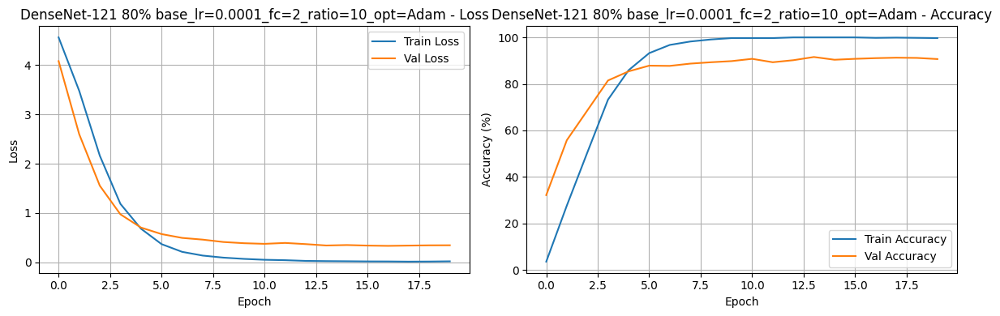


Training DenseNet-121 with 80% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 5,453,248
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 1,500,608
Epoch 1: Train Loss: 4.6108, Train Acc: 1.67%, Val Loss: 4.3761, Val Acc: 9.90%
Epoch 2: Train Loss: 4.1944, Train Acc: 13.14%, Val Loss: 3.8005, Val Acc: 37.16%
Epoch 3: Train Loss: 3.4406, Train Acc: 28.04%, Val Loss: 2.9045, Val Acc: 52.45%
Epoch 4: Train Loss: 2.4695, Train Acc: 46.18%, Val Loss: 2.0943, Val Acc: 59.80%
Epoch 5: Train Loss: 1.7612, Train Acc: 59.51%, Val Loss: 1.5339, Val Acc: 67.65%
Epoch 6: Train Loss: 1.2556, Train Acc: 70.69%, Val Loss: 1.2156, Val Acc: 71.08%
Epoch 7: Train Loss: 0.9156, Train Acc: 77.65%, Val Loss: 0.9074, Val Acc: 81.18%
Epoch 8: Train Loss: 0.6549, Train Acc: 84.12%, Val Loss: 0.7972, Val Acc: 81.96%
Epoch 9: Train Loss: 0.5372, Train Acc: 86.76%, Val Loss: 0.7229, Val Acc: 83.33%
Epoch 10: Train Loss: 0.4

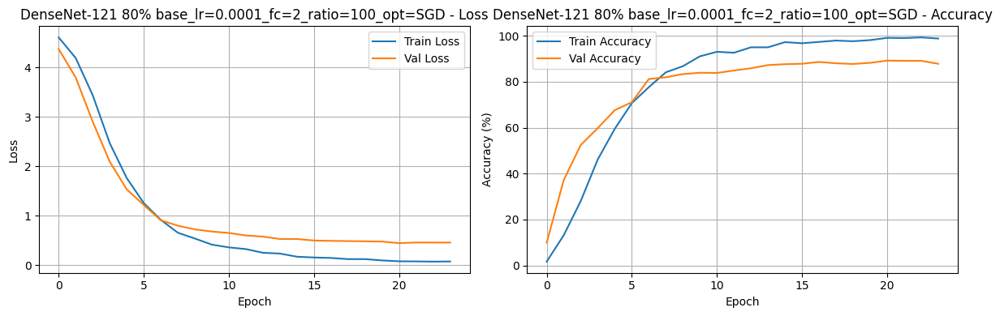


Training DenseNet-121 with 80% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 5,453,248
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 1,500,608
Epoch 1: Train Loss: 5.3583, Train Acc: 1.47%, Val Loss: 4.4771, Val Acc: 4.02%
Epoch 2: Train Loss: 4.3790, Train Acc: 4.90%, Val Loss: 4.0173, Val Acc: 11.08%
Epoch 3: Train Loss: 4.2060, Train Acc: 5.88%, Val Loss: 3.7328, Val Acc: 14.22%
Epoch 4: Train Loss: 4.0141, Train Acc: 6.86%, Val Loss: 3.4555, Val Acc: 17.94%
Epoch 5: Train Loss: 3.9678, Train Acc: 8.43%, Val Loss: 3.3648, Val Acc: 21.47%
Epoch 6: Train Loss: 3.7955, Train Acc: 9.51%, Val Loss: 3.2154, Val Acc: 24.80%
Epoch 7: Train Loss: 3.7270, Train Acc: 10.00%, Val Loss: 3.1363, Val Acc: 25.39%
Epoch 8: Train Loss: 3.7327, Train Acc: 9.61%, Val Loss: 3.1360, Val Acc: 27.16%
Epoch 9: Train Loss: 3.7019, Train Acc: 10.88%, Val Loss: 3.0292, Val Acc: 25.10%
Epoch 10: Train Loss: 3.6612, 

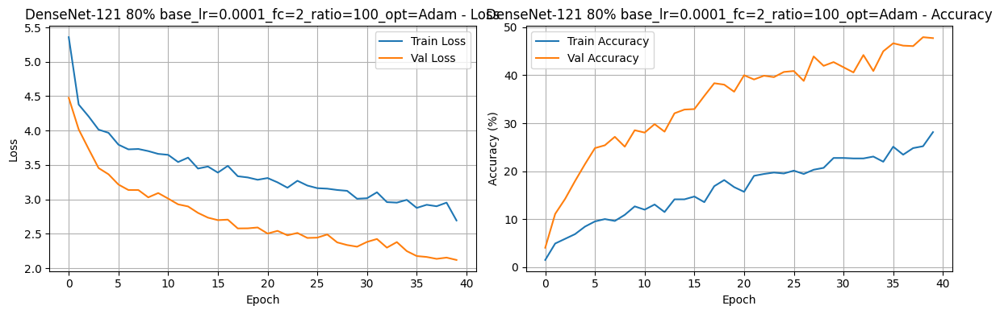

,base_lr,ratio,fc_layers,optimizer,final_val_accuracy,test_accuracy,final_train_loss,final_train_accuracy,final_val_loss
0,0.0010,10,1,SGD,91.764706,89.786957,0.008479,100.000000,0.361993
1,0.0010,10,1,Adam,79.705882,74.711335,0.151629,95.980392,0.993138
2,0.0010,100,1,SGD,88.823529,86.388031,0.019948,99.607843,0.563236
3,0.0010,100,1,Adam,16.274510,15.189462,22.737248,11.764706,424.492693
4,0.0010,10,2,SGD,90.196078,89.217759,0.014409,100.000000,0.362332
5,0.0010,10,2,Adam,0.980392,0.325256,4.630524,0.098039,4.625206
6,0.0010,100,2,SGD,5.294118,4.634900,4.551823,2.156863,4.461703
7,0.0010,100,2,Adam,0.980392,1.902748,4.679087,0.294118,4.628517
8,0.0001,10,1,SGD,88.431373,87.770369,0.195463,100.000000,0.691444
9,0.0001,10,1,Adam,92.450980,91.022931,0.002211,100.000000,0.321296


In [37]:
Optimizers = [
    lambda model, base_lr, ratio: optim.SGD(get_parameter_groups(model, base_lr, ratio), momentum=0.9),
    lambda model, base_lr, ratio: optim.Adam(get_parameter_groups(model, base_lr, ratio))

]
optimizer_names = ['SGD','Adam']
LRs = [0.001, 0.0001]
FCs = [1, 2]
Ratios = [10, 100]
all_results = []

for base_lr in LRs:
    for fc_layers in FCs:
        for ratio in Ratios:
            for opt_func, opt_name in zip(Optimizers, optimizer_names):
                dense121=models.densenet121
                model_name="DenseNet-121"
                trainable = "80%"
                
                print(f"\nTraining {model_name} with {trainable} trainable parameters, "
                      f"base_lr={base_lr}, fc_layers={fc_layers}, ratio={ratio}, optimizer={opt_name}")
                
                # Load and modify model
                model = dense121(pretrained=True)
                model = modify_model(model, num_layers=fc_layers).to(device)
                
                # Set trainable layers
                set_trainable_layers(model, trainable,0)
                
                # Print model structure
                print_model_structure(model,base_lr,ratio)
                
                # Train model with specified optimizer
                optimizer = opt_func(model, base_lr, ratio)
                train_losses, train_accuracies, val_losses, val_accuracies = train_model(
                    model, trainloader, valloader,optimizer, num_epochs=40, patience=3, min_delta=0.001,
                base_lr=base_lr,ratio=ratio)
                
                # Evaluate on test set
                test_acc = evaluate_model(model, testloader)
                print(f'Test Accuracy: {test_acc:.2f}%')
                
                # Store results
                results = {
                    'train_losses': train_losses,
                    'train_accuracies': train_accuracies,
                    'val_losses': val_losses,
                    'val_accuracies': val_accuracies,
                    'final_val_accuracy': val_accuracies[-1],
                    'test_accuracy': test_acc,
                    'base_lr': base_lr,
                    'ratio': ratio,
                    'fc_layers': fc_layers,
                    'optimizer': opt_name
                }
                all_results.append(results)
                
                # Plot metrics
                plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies,
                             f"{model_name} {trainable} base_lr={base_lr}_fc={fc_layers}_ratio={ratio}_opt={opt_name}")
results_df = pd.DataFrame([
    {
        'base_lr': res['base_lr'],
        'ratio': res['ratio'],
        'fc_layers': res['fc_layers'],
        'optimizer': res['optimizer'],
        'final_val_accuracy': res['final_val_accuracy'],
        'test_accuracy': res['test_accuracy'],
        'final_train_loss': res['train_losses'][-1],
        'final_train_accuracy': res['train_accuracies'][-1],
        'final_val_loss': res['val_losses'][-1]
    } for res in all_results
])
results_df

### 50% trainable

#### Hyper parameter tuning


Training DenseNet-121 with 50% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 3,473,536
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 3,480,320
Epoch 1: Train Loss: 4.2953, Train Acc: 9.31%, Val Loss: 3.1360, Val Acc: 40.00%
Epoch 2: Train Loss: 2.0149, Train Acc: 65.78%, Val Loss: 1.5807, Val Acc: 68.04%
Epoch 3: Train Loss: 0.7552, Train Acc: 92.45%, Val Loss: 0.9343, Val Acc: 83.43%
Epoch 4: Train Loss: 0.3700, Train Acc: 97.65%, Val Loss: 0.7363, Val Acc: 87.55%
Epoch 5: Train Loss: 0.2084, Train Acc: 99.51%, Val Loss: 0.6171, Val Acc: 88.73%
Epoch 6: Train Loss: 0.1403, Train Acc: 99.80%, Val Loss: 0.5776, Val Acc: 90.00%
Epoch 7: Train Loss: 0.1012, Train Acc: 100.00%, Val Loss: 0.5382, Val Acc: 90.29%
Epoch 8: Train Loss: 0.0758, Train Acc: 100.00%, Val Loss: 0.5143, Val Acc: 90.20%
Epoch 9: Train Loss: 0.0648, Train Acc: 100.00%, Val Loss: 0.4994, Val Acc: 90.49%
Epoch 10: Train Loss: 0

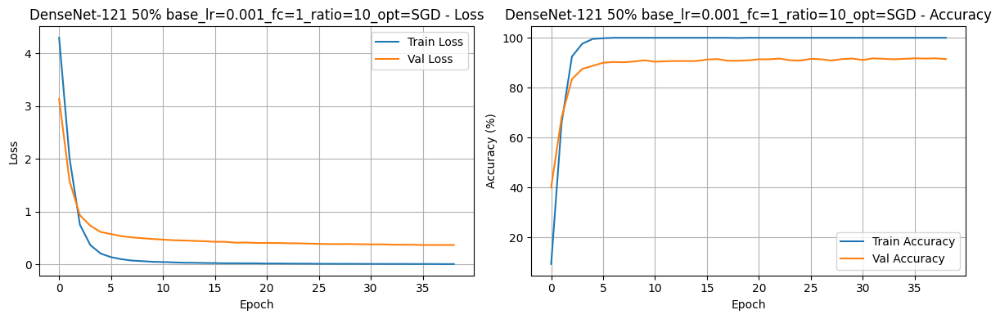


Training DenseNet-121 with 50% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 3,473,536
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 3,480,320
Epoch 1: Train Loss: 4.9854, Train Acc: 26.47%, Val Loss: 2.3708, Val Acc: 50.59%
Epoch 2: Train Loss: 0.8318, Train Acc: 79.41%, Val Loss: 1.1585, Val Acc: 73.53%
Epoch 3: Train Loss: 0.2439, Train Acc: 93.14%, Val Loss: 0.7067, Val Acc: 82.45%
Epoch 4: Train Loss: 0.1216, Train Acc: 96.08%, Val Loss: 0.7074, Val Acc: 83.24%
Epoch 5: Train Loss: 0.1175, Train Acc: 97.06%, Val Loss: 0.6871, Val Acc: 84.22%
Epoch 6: Train Loss: 0.0467, Train Acc: 98.82%, Val Loss: 0.7411, Val Acc: 82.75%
Epoch 7: Train Loss: 0.0753, Train Acc: 98.33%, Val Loss: 0.7469, Val Acc: 83.82%
Epoch 8: Train Loss: 0.1011, Train Acc: 97.16%, Val Loss: 0.8868, Val Acc: 80.00%
Early stopping triggered after epoch 8
Test Accuracy: 77.30%


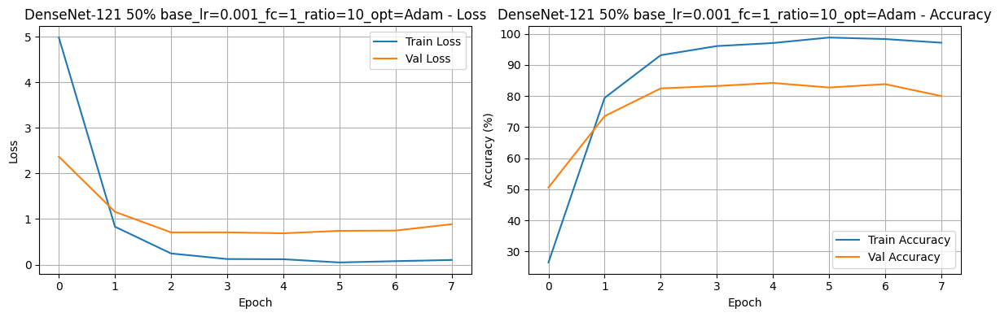


Training DenseNet-121 with 50% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 3,473,536
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 3,480,320
Epoch 1: Train Loss: 4.4277, Train Acc: 26.86%, Val Loss: 2.2543, Val Acc: 61.37%
Epoch 2: Train Loss: 0.8680, Train Acc: 84.51%, Val Loss: 1.8538, Val Acc: 67.16%
Epoch 3: Train Loss: 0.3632, Train Acc: 92.06%, Val Loss: 1.0057, Val Acc: 78.92%
Epoch 4: Train Loss: 0.1268, Train Acc: 96.37%, Val Loss: 0.8173, Val Acc: 83.14%
Epoch 5: Train Loss: 0.0686, Train Acc: 97.65%, Val Loss: 0.8983, Val Acc: 82.45%
Epoch 6: Train Loss: 0.0414, Train Acc: 98.92%, Val Loss: 0.8489, Val Acc: 82.84%
Epoch 7: Train Loss: 0.0131, Train Acc: 99.71%, Val Loss: 0.6919, Val Acc: 84.90%
Epoch 8: Train Loss: 0.0225, Train Acc: 99.41%, Val Loss: 0.6794, Val Acc: 85.59%
Epoch 9: Train Loss: 0.0034, Train Acc: 99.90%, Val Loss: 0.6738, Val Acc: 86.27%
Epoch 10: Train Loss: 0.

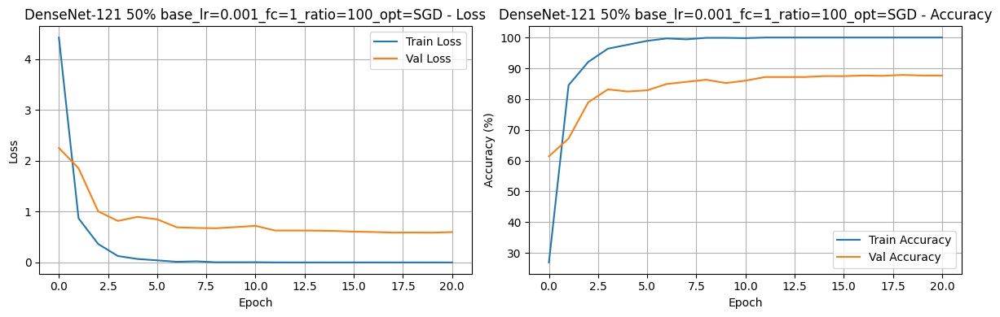


Training DenseNet-121 with 50% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 3,473,536
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 3,480,320
Epoch 1: Train Loss: 62.6025, Train Acc: 4.02%, Val Loss: 74.4833, Val Acc: 6.37%
Epoch 2: Train Loss: 29.2164, Train Acc: 8.63%, Val Loss: 27.5309, Val Acc: 18.04%
Epoch 3: Train Loss: 17.9962, Train Acc: 22.45%, Val Loss: 13.7345, Val Acc: 31.57%
Epoch 4: Train Loss: 12.9798, Train Acc: 38.33%, Val Loss: 9.3570, Val Acc: 44.41%
Epoch 5: Train Loss: 11.8875, Train Acc: 49.02%, Val Loss: 26.3740, Val Acc: 43.33%
Epoch 6: Train Loss: 11.5368, Train Acc: 55.88%, Val Loss: 17.1745, Val Acc: 45.39%
Epoch 7: Train Loss: 13.0075, Train Acc: 60.10%, Val Loss: 7.0011, Val Acc: 56.18%
Epoch 8: Train Loss: 6.8061, Train Acc: 65.10%, Val Loss: 6.8416, Val Acc: 61.08%
Epoch 9: Train Loss: 5.7790, Train Acc: 73.63%, Val Loss: 6.8413, Val Acc: 65.39%
Epoch 10: Trai

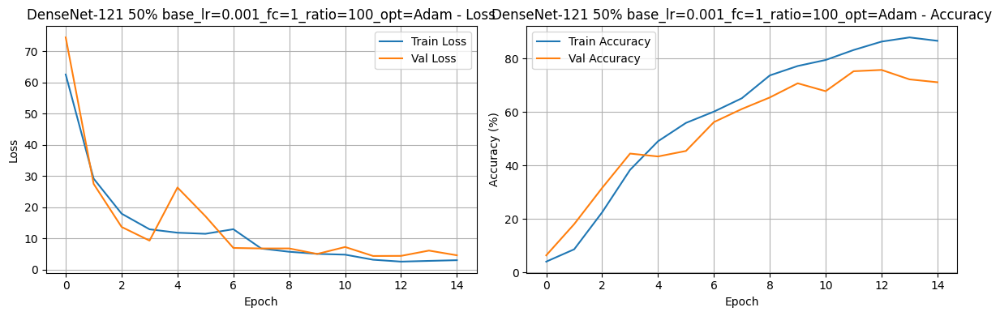


Training DenseNet-121 with 50% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 3,209,088
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 3,744,768
Epoch 1: Train Loss: 4.5916, Train Acc: 2.65%, Val Loss: 4.3480, Val Acc: 16.37%
Epoch 2: Train Loss: 4.1337, Train Acc: 14.31%, Val Loss: 3.6999, Val Acc: 35.20%
Epoch 3: Train Loss: 3.2060, Train Acc: 30.00%, Val Loss: 2.5146, Val Acc: 57.84%
Epoch 4: Train Loss: 2.1605, Train Acc: 52.25%, Val Loss: 1.6208, Val Acc: 69.31%
Epoch 5: Train Loss: 1.4184, Train Acc: 66.86%, Val Loss: 1.1797, Val Acc: 74.71%
Epoch 6: Train Loss: 0.9564, Train Acc: 76.47%, Val Loss: 0.9148, Val Acc: 80.59%
Epoch 7: Train Loss: 0.6802, Train Acc: 84.02%, Val Loss: 0.7594, Val Acc: 82.25%
Epoch 8: Train Loss: 0.4890, Train Acc: 89.61%, Val Loss: 0.6301, Val Acc: 85.78%
Epoch 9: Train Loss: 0.3456, Train Acc: 92.94%, Val Loss: 0.5849, Val Acc: 85.59%
Epoch 10: Train Loss: 0.24

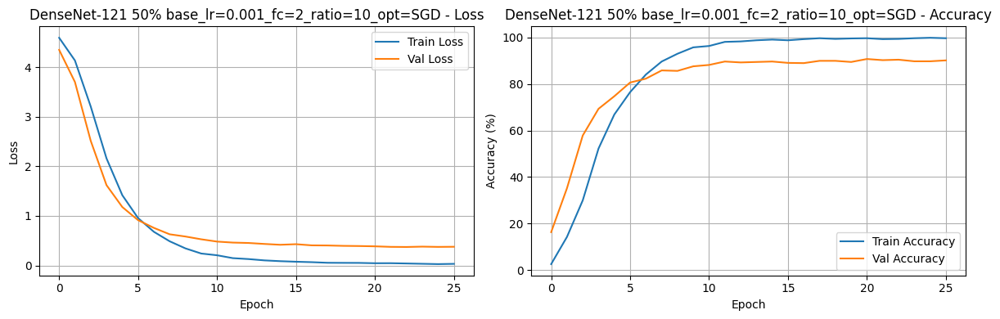


Training DenseNet-121 with 50% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 3,209,088
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 3,744,768
Epoch 1: Train Loss: 5.4077, Train Acc: 1.67%, Val Loss: 4.3027, Val Acc: 4.41%
Epoch 2: Train Loss: 4.4365, Train Acc: 3.53%, Val Loss: 4.1333, Val Acc: 5.98%
Epoch 3: Train Loss: 4.3626, Train Acc: 3.24%, Val Loss: 4.0549, Val Acc: 6.27%
Epoch 4: Train Loss: 4.2426, Train Acc: 3.92%, Val Loss: 3.9314, Val Acc: 8.04%
Epoch 5: Train Loss: 4.1312, Train Acc: 5.59%, Val Loss: 3.6653, Val Acc: 11.47%
Epoch 6: Train Loss: 4.0668, Train Acc: 5.49%, Val Loss: 3.6530, Val Acc: 11.27%
Epoch 7: Train Loss: 3.9806, Train Acc: 5.78%, Val Loss: 3.6353, Val Acc: 11.86%
Epoch 8: Train Loss: 3.9851, Train Acc: 5.78%, Val Loss: 3.5634, Val Acc: 14.22%
Epoch 9: Train Loss: 3.8641, Train Acc: 7.35%, Val Loss: 3.3528, Val Acc: 13.63%
Epoch 10: Train Loss: 3.7425, Train A

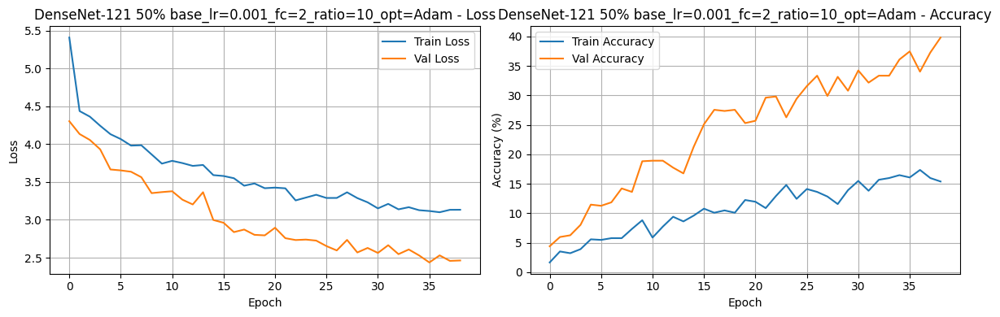


Training DenseNet-121 with 50% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 3,209,088
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 3,744,768
Epoch 1: Train Loss: 4.6205, Train Acc: 2.94%, Val Loss: 4.0258, Val Acc: 15.69%
Epoch 2: Train Loss: 4.3057, Train Acc: 6.18%, Val Loss: 4.0809, Val Acc: 11.76%
Epoch 3: Train Loss: 4.3583, Train Acc: 6.76%, Val Loss: 4.0623, Val Acc: 12.84%
Epoch 4: Train Loss: 4.4420, Train Acc: 4.80%, Val Loss: 4.4822, Val Acc: 4.80%
Early stopping triggered after epoch 4
Test Accuracy: 4.90%


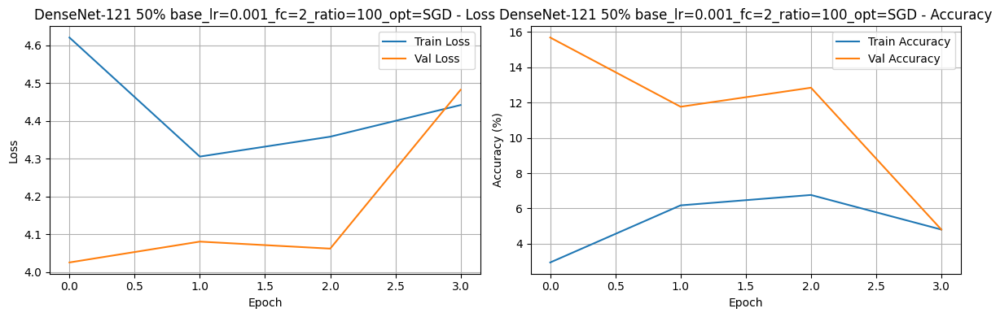


Training DenseNet-121 with 50% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 3,209,088
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 3,744,768
Epoch 1: Train Loss: 63.8415, Train Acc: 0.29%, Val Loss: 4.6426, Val Acc: 0.98%
Epoch 2: Train Loss: 4.6804, Train Acc: 0.20%, Val Loss: 4.6325, Val Acc: 0.98%
Epoch 3: Train Loss: 4.6733, Train Acc: 0.39%, Val Loss: 4.6292, Val Acc: 0.98%
Epoch 4: Train Loss: 4.6715, Train Acc: 0.49%, Val Loss: 4.6293, Val Acc: 0.98%
Epoch 5: Train Loss: 4.6750, Train Acc: 0.29%, Val Loss: 4.6295, Val Acc: 0.98%
Epoch 6: Train Loss: 4.6728, Train Acc: 0.69%, Val Loss: 4.6293, Val Acc: 0.98%
Early stopping triggered after epoch 6
Test Accuracy: 0.67%


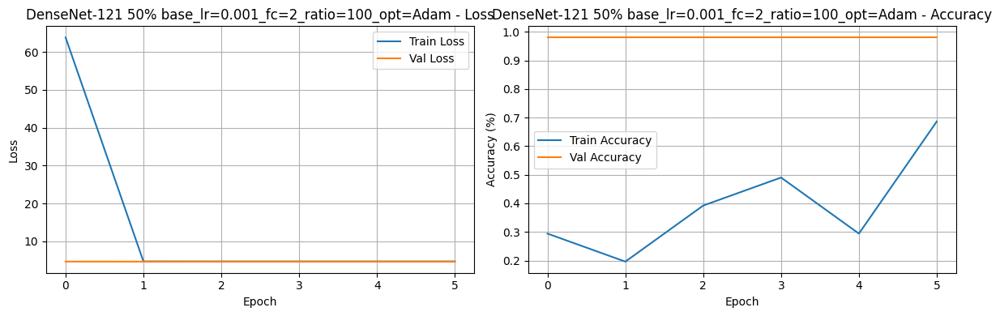


Training DenseNet-121 with 50% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 3,473,536
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 3,480,320
Epoch 1: Train Loss: 4.6791, Train Acc: 1.18%, Val Loss: 4.5037, Val Acc: 1.67%
Epoch 2: Train Loss: 4.3748, Train Acc: 7.16%, Val Loss: 4.2371, Val Acc: 13.14%
Epoch 3: Train Loss: 4.0607, Train Acc: 26.37%, Val Loss: 3.9789, Val Acc: 30.69%
Epoch 4: Train Loss: 3.7648, Train Acc: 46.57%, Val Loss: 3.7275, Val Acc: 46.18%
Epoch 5: Train Loss: 3.4515, Train Acc: 62.94%, Val Loss: 3.4673, Val Acc: 55.59%
Epoch 6: Train Loss: 3.1679, Train Acc: 72.25%, Val Loss: 3.2140, Val Acc: 61.08%
Epoch 7: Train Loss: 2.8670, Train Acc: 80.29%, Val Loss: 2.9818, Val Acc: 67.84%
Epoch 8: Train Loss: 2.5916, Train Acc: 86.96%, Val Loss: 2.7536, Val Acc: 70.10%
Epoch 9: Train Loss: 2.3475, Train Acc: 87.75%, Val Loss: 2.5378, Val Acc: 74.12%
Epoch 10: Train Loss: 2.115

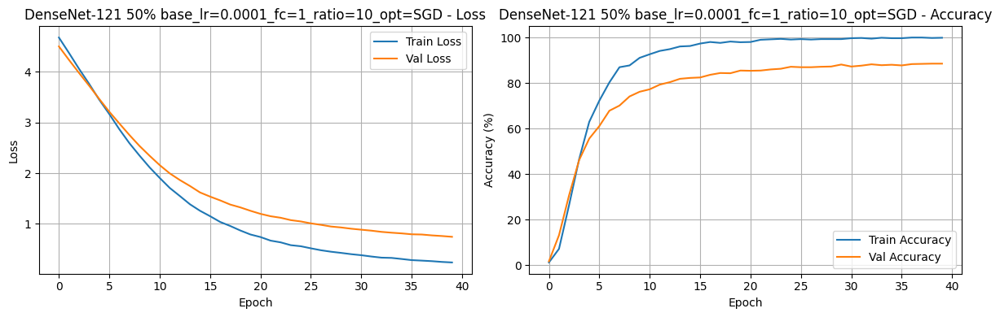


Training DenseNet-121 with 50% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 3,473,536
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 3,480,320
Epoch 1: Train Loss: 4.3014, Train Acc: 13.63%, Val Loss: 3.2349, Val Acc: 49.80%
Epoch 2: Train Loss: 2.1507, Train Acc: 78.33%, Val Loss: 1.8290, Val Acc: 76.08%
Epoch 3: Train Loss: 0.9481, Train Acc: 94.71%, Val Loss: 1.1343, Val Acc: 84.51%
Epoch 4: Train Loss: 0.4389, Train Acc: 98.43%, Val Loss: 0.8630, Val Acc: 87.94%
Epoch 5: Train Loss: 0.2186, Train Acc: 99.90%, Val Loss: 0.7106, Val Acc: 89.22%
Epoch 6: Train Loss: 0.1292, Train Acc: 100.00%, Val Loss: 0.6279, Val Acc: 90.78%
Epoch 7: Train Loss: 0.0778, Train Acc: 100.00%, Val Loss: 0.5739, Val Acc: 90.69%
Epoch 8: Train Loss: 0.0570, Train Acc: 100.00%, Val Loss: 0.5444, Val Acc: 90.98%
Epoch 9: Train Loss: 0.0459, Train Acc: 100.00%, Val Loss: 0.5111, Val Acc: 90.10%
Epoch 10: Train Los

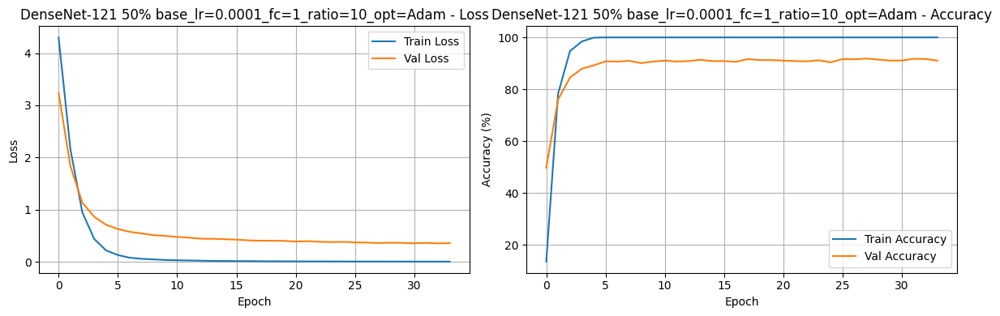


Training DenseNet-121 with 50% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 3,473,536
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 3,480,320
Epoch 1: Train Loss: 4.3596, Train Acc: 8.73%, Val Loss: 3.3329, Val Acc: 37.16%
Epoch 2: Train Loss: 2.3258, Train Acc: 61.86%, Val Loss: 1.9233, Val Acc: 66.08%
Epoch 3: Train Loss: 1.1257, Train Acc: 88.14%, Val Loss: 1.2340, Val Acc: 81.27%
Epoch 4: Train Loss: 0.5939, Train Acc: 96.37%, Val Loss: 1.0233, Val Acc: 82.06%
Epoch 5: Train Loss: 0.3917, Train Acc: 98.14%, Val Loss: 0.8611, Val Acc: 85.78%
Epoch 6: Train Loss: 0.2681, Train Acc: 99.31%, Val Loss: 0.7660, Val Acc: 87.25%
Epoch 7: Train Loss: 0.2070, Train Acc: 99.80%, Val Loss: 0.7102, Val Acc: 88.92%
Epoch 8: Train Loss: 0.1637, Train Acc: 99.90%, Val Loss: 0.6921, Val Acc: 87.75%
Epoch 9: Train Loss: 0.1363, Train Acc: 100.00%, Val Loss: 0.6508, Val Acc: 89.61%
Epoch 10: Train Loss: 0

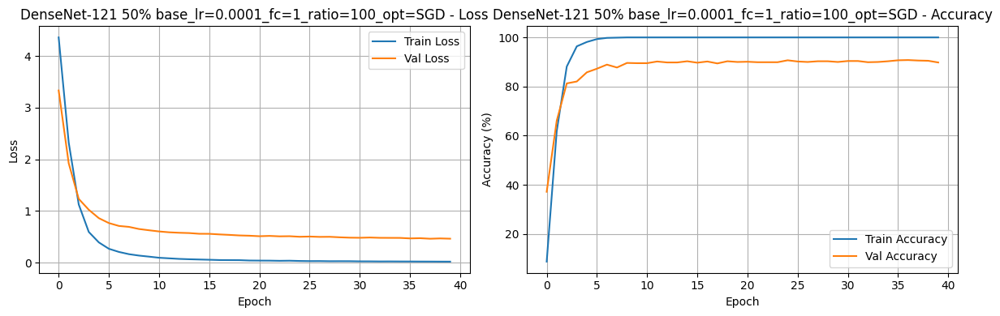


Training DenseNet-121 with 50% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 3,473,536
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 3,480,320
Epoch 1: Train Loss: 5.6813, Train Acc: 23.33%, Val Loss: 1.8904, Val Acc: 61.67%
Epoch 2: Train Loss: 0.5764, Train Acc: 88.43%, Val Loss: 0.7152, Val Acc: 81.18%
Epoch 3: Train Loss: 0.1129, Train Acc: 97.65%, Val Loss: 0.5554, Val Acc: 85.20%
Epoch 4: Train Loss: 0.0338, Train Acc: 99.71%, Val Loss: 0.4425, Val Acc: 88.14%
Epoch 5: Train Loss: 0.0157, Train Acc: 99.80%, Val Loss: 0.4221, Val Acc: 89.41%
Epoch 6: Train Loss: 0.0067, Train Acc: 100.00%, Val Loss: 0.3889, Val Acc: 89.51%
Epoch 7: Train Loss: 0.0045, Train Acc: 100.00%, Val Loss: 0.3684, Val Acc: 90.78%
Epoch 8: Train Loss: 0.0037, Train Acc: 100.00%, Val Loss: 0.3666, Val Acc: 90.59%
Epoch 9: Train Loss: 0.0035, Train Acc: 100.00%, Val Loss: 0.3531, Val Acc: 90.78%
Epoch 10: Train Lo

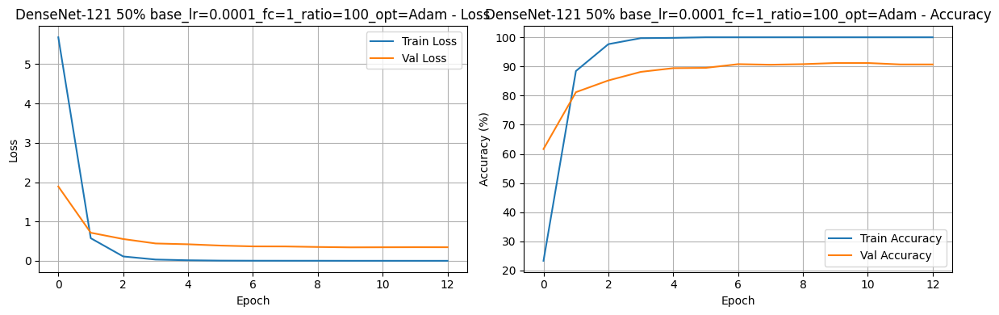


Training DenseNet-121 with 50% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 3,209,088
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 3,744,768
Epoch 1: Train Loss: 4.6573, Train Acc: 0.88%, Val Loss: 4.5977, Val Acc: 1.67%
Epoch 2: Train Loss: 4.5904, Train Acc: 1.96%, Val Loss: 4.5440, Val Acc: 2.94%
Epoch 3: Train Loss: 4.5193, Train Acc: 2.84%, Val Loss: 4.4908, Val Acc: 7.84%
Epoch 4: Train Loss: 4.4654, Train Acc: 5.59%, Val Loss: 4.4380, Val Acc: 13.14%
Epoch 5: Train Loss: 4.3909, Train Acc: 9.12%, Val Loss: 4.3756, Val Acc: 21.67%
Epoch 6: Train Loss: 4.3092, Train Acc: 13.92%, Val Loss: 4.3048, Val Acc: 29.22%
Epoch 7: Train Loss: 4.2330, Train Acc: 17.35%, Val Loss: 4.2295, Val Acc: 35.39%
Epoch 8: Train Loss: 4.1457, Train Acc: 21.67%, Val Loss: 4.1408, Val Acc: 42.65%
Epoch 9: Train Loss: 4.0421, Train Acc: 26.18%, Val Loss: 4.0469, Val Acc: 48.33%
Epoch 10: Train Loss: 3.9406, Tr

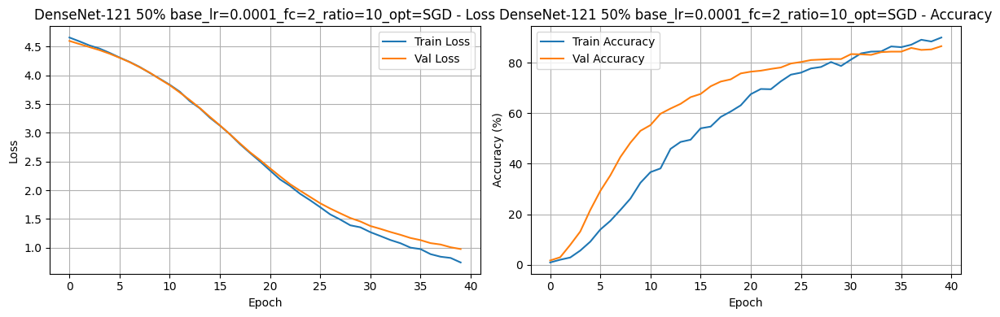


Training DenseNet-121 with 50% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 3,209,088
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 3,744,768
Epoch 1: Train Loss: 4.5721, Train Acc: 3.14%, Val Loss: 4.0644, Val Acc: 31.08%
Epoch 2: Train Loss: 3.5663, Train Acc: 26.57%, Val Loss: 2.6684, Val Acc: 62.75%
Epoch 3: Train Loss: 2.2089, Train Acc: 50.98%, Val Loss: 1.5710, Val Acc: 73.04%
Epoch 4: Train Loss: 1.2673, Train Acc: 72.84%, Val Loss: 1.0055, Val Acc: 77.94%
Epoch 5: Train Loss: 0.7371, Train Acc: 84.51%, Val Loss: 0.7407, Val Acc: 84.31%
Epoch 6: Train Loss: 0.4927, Train Acc: 88.82%, Val Loss: 0.6028, Val Acc: 85.88%
Epoch 7: Train Loss: 0.2781, Train Acc: 95.39%, Val Loss: 0.5018, Val Acc: 88.53%
Epoch 8: Train Loss: 0.1918, Train Acc: 97.16%, Val Loss: 0.4710, Val Acc: 89.61%
Epoch 9: Train Loss: 0.1314, Train Acc: 98.24%, Val Loss: 0.4262, Val Acc: 89.41%
Epoch 10: Train Loss: 0.

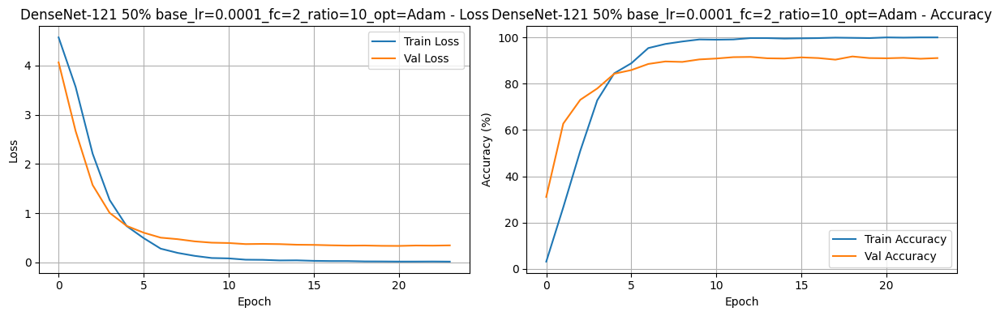


Training DenseNet-121 with 50% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 3,209,088
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 3,744,768
Epoch 1: Train Loss: 4.6160, Train Acc: 1.47%, Val Loss: 4.3666, Val Acc: 15.98%
Epoch 2: Train Loss: 4.1870, Train Acc: 11.76%, Val Loss: 3.7940, Val Acc: 36.27%
Epoch 3: Train Loss: 3.3873, Train Acc: 30.98%, Val Loss: 2.8699, Val Acc: 55.10%
Epoch 4: Train Loss: 2.4818, Train Acc: 47.06%, Val Loss: 2.0251, Val Acc: 62.84%
Epoch 5: Train Loss: 1.7250, Train Acc: 59.51%, Val Loss: 1.4863, Val Acc: 68.73%
Epoch 6: Train Loss: 1.2569, Train Acc: 69.41%, Val Loss: 1.1554, Val Acc: 76.76%
Epoch 7: Train Loss: 0.9155, Train Acc: 78.14%, Val Loss: 0.9792, Val Acc: 78.24%
Epoch 8: Train Loss: 0.6675, Train Acc: 85.29%, Val Loss: 0.8360, Val Acc: 81.27%
Epoch 9: Train Loss: 0.5592, Train Acc: 86.96%, Val Loss: 0.7584, Val Acc: 83.04%
Epoch 10: Train Loss: 0.

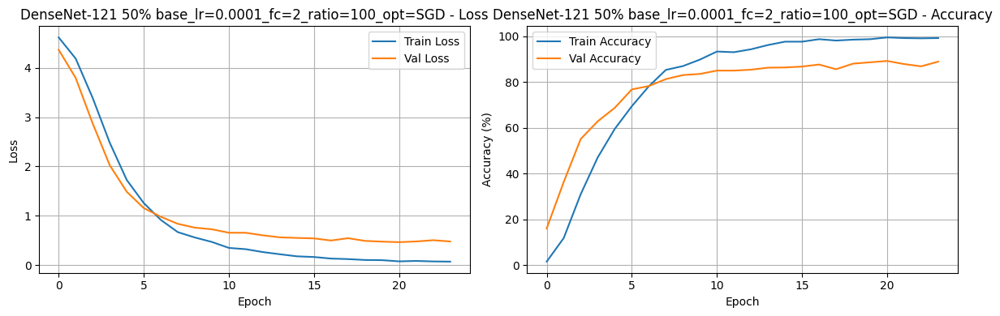


Training DenseNet-121 with 50% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 3,209,088
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 3,744,768
Epoch 1: Train Loss: 5.7268, Train Acc: 1.47%, Val Loss: 4.5115, Val Acc: 5.00%
Epoch 2: Train Loss: 4.4656, Train Acc: 3.24%, Val Loss: 4.1353, Val Acc: 10.29%
Epoch 3: Train Loss: 4.2916, Train Acc: 5.00%, Val Loss: 3.9266, Val Acc: 10.00%
Epoch 4: Train Loss: 4.2103, Train Acc: 4.80%, Val Loss: 3.8138, Val Acc: 11.57%
Epoch 5: Train Loss: 4.1334, Train Acc: 5.39%, Val Loss: 3.8080, Val Acc: 12.25%
Epoch 6: Train Loss: 4.1034, Train Acc: 4.61%, Val Loss: 3.5481, Val Acc: 16.27%
Epoch 7: Train Loss: 4.0097, Train Acc: 5.49%, Val Loss: 3.6986, Val Acc: 11.96%
Epoch 8: Train Loss: 3.9615, Train Acc: 7.94%, Val Loss: 3.6611, Val Acc: 11.96%
Epoch 9: Train Loss: 3.9822, Train Acc: 6.67%, Val Loss: 3.4431, Val Acc: 17.75%
Epoch 10: Train Loss: 3.8976, Tr

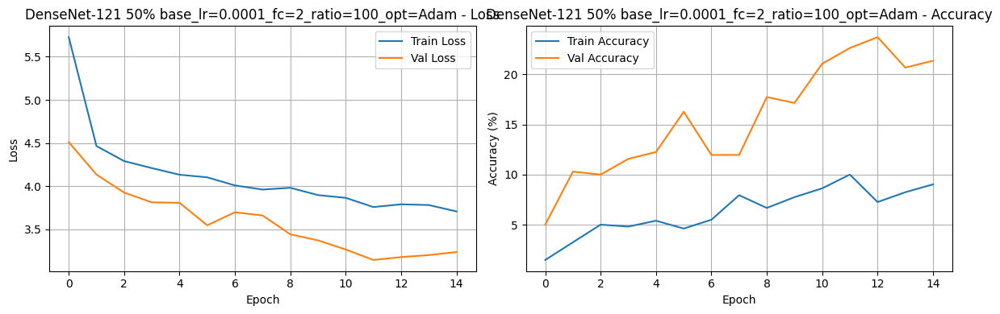

,base_lr,ratio,fc_layers,optimizer,final_val_accuracy,test_accuracy,final_train_loss,final_train_accuracy,final_val_loss
0,0.0010,10,1,SGD,91.470588,89.201496,0.009901,100.000000,0.370596
1,0.0010,10,1,Adam,80.000000,77.297121,0.101134,97.156863,0.886782
2,0.0010,100,1,SGD,87.647059,85.737518,0.000254,100.000000,0.597807
3,0.0010,100,1,Adam,71.078431,68.450154,3.077810,86.568627,4.649541
4,0.0010,10,2,SGD,90.098039,87.721581,0.034050,99.607843,0.378463
5,0.0010,10,2,Adam,39.803922,38.152545,3.133141,15.392157,2.463335
6,0.0010,100,2,SGD,4.803922,4.895105,4.442015,4.803922,4.482226
7,0.0010,100,2,Adam,0.980392,0.666775,4.672823,0.686275,4.629283
8,0.0001,10,1,SGD,88.529412,86.566921,0.238285,99.901961,0.744402
9,0.0001,10,1,Adam,91.078431,90.502521,0.003140,100.000000,0.357478


In [39]:
Optimizers = [
    lambda model, base_lr, ratio: optim.SGD(get_parameter_groups(model, base_lr, ratio), momentum=0.9),
    lambda model, base_lr, ratio: optim.Adam(get_parameter_groups(model, base_lr, ratio))

]
optimizer_names = ['SGD','Adam']
LRs = [0.001, 0.0001]
FCs = [1, 2]
Ratios = [10, 100]
all_results = []

for base_lr in LRs:
    for fc_layers in FCs:
        for ratio in Ratios:
            for opt_func, opt_name in zip(Optimizers, optimizer_names):
                dense121=models.densenet121
                model_name="DenseNet-121"
                trainable = "50%"
                
                print(f"\nTraining {model_name} with {trainable} trainable parameters, "
                      f"base_lr={base_lr}, fc_layers={fc_layers}, ratio={ratio}, optimizer={opt_name}")
                
                # Load and modify model
                model = dense121(pretrained=True)
                model = modify_model(model, num_layers=fc_layers).to(device)
                
                # Set trainable layers
                set_trainable_layers(model, trainable,0)
                
                # Print model structure
                print_model_structure(model,base_lr,ratio)
                
                # Train model with specified optimizer
                optimizer = opt_func(model, base_lr, ratio)
                train_losses, train_accuracies, val_losses, val_accuracies = train_model(
                    model, trainloader, valloader,optimizer, num_epochs=40, patience=3, min_delta=0.001,
                base_lr=base_lr,ratio=ratio)
                
                # Evaluate on test set
                test_acc = evaluate_model(model, testloader)
                print(f'Test Accuracy: {test_acc:.2f}%')
                
                # Store results
                results = {
                    'train_losses': train_losses,
                    'train_accuracies': train_accuracies,
                    'val_losses': val_losses,
                    'val_accuracies': val_accuracies,
                    'final_val_accuracy': val_accuracies[-1],
                    'test_accuracy': test_acc,
                    'base_lr': base_lr,
                    'ratio': ratio,
                    'fc_layers': fc_layers,
                    'optimizer': opt_name
                }
                all_results.append(results)
                
                # Plot metrics
                plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies,
                             f"{model_name} {trainable} base_lr={base_lr}_fc={fc_layers}_ratio={ratio}_opt={opt_name}")
results_df = pd.DataFrame([
    {
        'base_lr': res['base_lr'],
        'ratio': res['ratio'],
        'fc_layers': res['fc_layers'],
        'optimizer': res['optimizer'],
        'final_val_accuracy': res['final_val_accuracy'],
        'test_accuracy': res['test_accuracy'],
        'final_train_loss': res['train_losses'][-1],
        'final_train_accuracy': res['train_accuracies'][-1],
        'final_val_loss': res['val_losses'][-1]
    } for res in all_results
])
results_df

### 30% trainable

#### Hyper parameter tuning


Training DenseNet-121 with 30% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 2,055,360
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 4,898,496


C:\Users\Kia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Kia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss: 4.3533, Train Acc: 11.08%, Val Loss: 3.1607, Val Acc: 39.71%
Epoch 2: Train Loss: 2.1334, Train Acc: 64.22%, Val Loss: 1.6137, Val Acc: 70.39%
Epoch 3: Train Loss: 0.9082, Train Acc: 90.88%, Val Loss: 1.0721, Val Acc: 80.69%
Epoch 4: Train Loss: 0.4856, Train Acc: 95.98%, Val Loss: 0.8418, Val Acc: 84.02%
Epoch 5: Train Loss: 0.2934, Train Acc: 98.63%, Val Loss: 0.7340, Val Acc: 87.45%
Epoch 6: Train Loss: 0.1879, Train Acc: 99.31%, Val Loss: 0.6566, Val Acc: 88.53%
Epoch 7: Train Loss: 0.1292, Train Acc: 99.80%, Val Loss: 0.6094, Val Acc: 89.02%
Epoch 8: Train Loss: 0.1048, Train Acc: 100.00%, Val Loss: 0.5804, Val Acc: 90.00%
Epoch 9: Train Loss: 0.0831, Train Acc: 100.00%, Val Loss: 0.5598, Val Acc: 89.80%
Epoch 10: Train Loss: 0.0737, Train Acc: 100.00%, Val Loss: 0.5440, Val Acc: 89.61%
Epoch 11: Train Loss: 0.0640, Train Acc: 100.00%, Val Loss: 0.5333, Val Acc: 90.20%
Epoch 12: Train Loss: 0.0617, Train Acc: 100.00%, Val Loss: 0.5228, Val Acc: 90.59%
Epoch 13

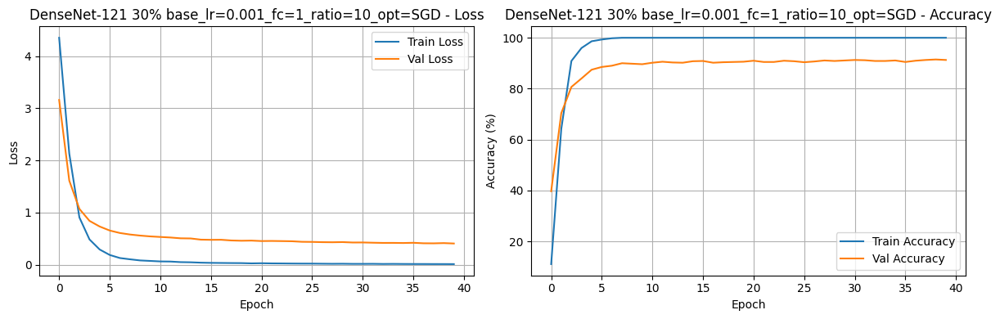


Training DenseNet-121 with 30% trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 2,055,360
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 4,898,496
Epoch 1: Train Loss: 5.4310, Train Acc: 21.86%, Val Loss: 2.0800, Val Acc: 58.24%
Epoch 2: Train Loss: 0.6367, Train Acc: 83.04%, Val Loss: 0.7425, Val Acc: 80.00%
Epoch 3: Train Loss: 0.1187, Train Acc: 96.27%, Val Loss: 0.6228, Val Acc: 83.04%
Epoch 4: Train Loss: 0.0421, Train Acc: 99.22%, Val Loss: 0.5011, Val Acc: 86.76%
Epoch 5: Train Loss: 0.0407, Train Acc: 99.02%, Val Loss: 0.5468, Val Acc: 86.18%
Epoch 6: Train Loss: 0.0447, Train Acc: 99.12%, Val Loss: 0.4762, Val Acc: 88.14%
Epoch 7: Train Loss: 0.0114, Train Acc: 99.71%, Val Loss: 0.4756, Val Acc: 88.33%
Epoch 8: Train Loss: 0.0081, Train Acc: 99.80%, Val Loss: 0.3809, Val Acc: 90.59%
Epoch 9: Train Loss: 0.0177, Train Acc: 99.61%, Val Loss: 0.4804, Val Acc: 87.06%
Epoch 10: Train Loss: 0.

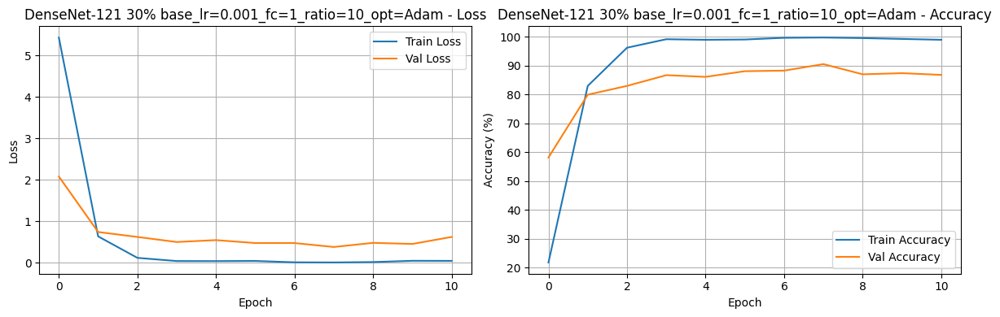


Training DenseNet-121 with 30% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 2,055,360
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 4,898,496
Epoch 1: Train Loss: 6.5662, Train Acc: 22.84%, Val Loss: 4.4261, Val Acc: 56.67%
Epoch 2: Train Loss: 1.5557, Train Acc: 77.16%, Val Loss: 1.5364, Val Acc: 74.51%
Epoch 3: Train Loss: 0.3264, Train Acc: 92.75%, Val Loss: 1.1741, Val Acc: 77.55%
Epoch 4: Train Loss: 0.1991, Train Acc: 94.71%, Val Loss: 1.1067, Val Acc: 78.63%
Epoch 5: Train Loss: 0.0858, Train Acc: 97.65%, Val Loss: 0.9304, Val Acc: 81.27%
Epoch 6: Train Loss: 0.0361, Train Acc: 98.92%, Val Loss: 0.8680, Val Acc: 81.76%
Epoch 7: Train Loss: 0.0159, Train Acc: 99.51%, Val Loss: 0.9261, Val Acc: 81.18%
Epoch 8: Train Loss: 0.0145, Train Acc: 99.61%, Val Loss: 0.7377, Val Acc: 85.98%
Epoch 9: Train Loss: 0.0394, Train Acc: 99.02%, Val Loss: 0.7127, Val Acc: 85.59%
Epoch 10: Train Loss: 0.

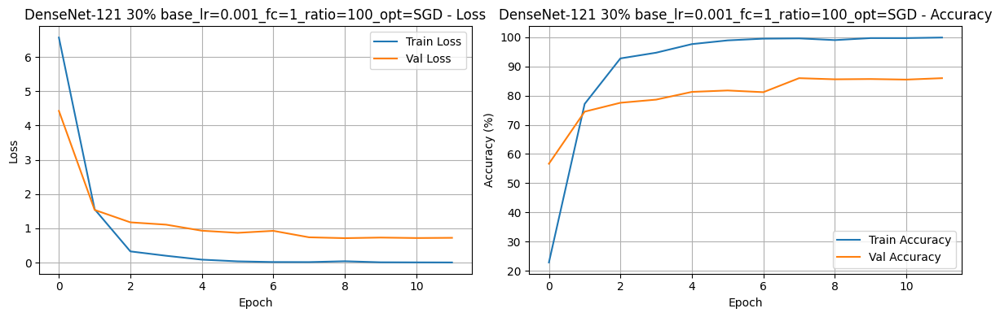


Training DenseNet-121 with 30% trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 2,055,360
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 4,898,496
Epoch 1: Train Loss: 83.3382, Train Acc: 9.31%, Val Loss: 112.7439, Val Acc: 12.16%
Epoch 2: Train Loss: 29.5920, Train Acc: 35.59%, Val Loss: 22.2618, Val Acc: 44.51%
Epoch 3: Train Loss: 9.6148, Train Acc: 63.92%, Val Loss: 8.7743, Val Acc: 61.86%
Epoch 4: Train Loss: 4.3747, Train Acc: 78.14%, Val Loss: 7.4314, Val Acc: 70.20%
Epoch 5: Train Loss: 3.1682, Train Acc: 83.24%, Val Loss: 6.9690, Val Acc: 71.27%
Epoch 6: Train Loss: 2.0228, Train Acc: 87.65%, Val Loss: 6.9375, Val Acc: 73.14%
Epoch 7: Train Loss: 1.2428, Train Acc: 92.25%, Val Loss: 6.9316, Val Acc: 73.33%
Epoch 8: Train Loss: 1.1551, Train Acc: 92.45%, Val Loss: 6.6873, Val Acc: 74.51%
Epoch 9: Train Loss: 1.1116, Train Acc: 93.14%, Val Loss: 6.5156, Val Acc: 75.59%
Epoch 10: Train Los

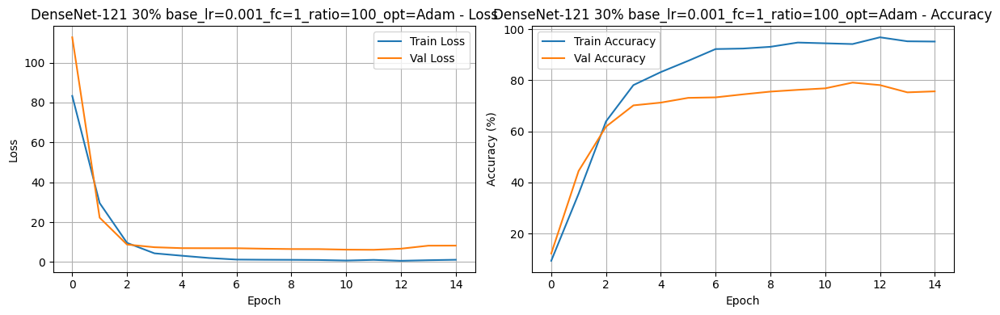


Training DenseNet-121 with 30% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 1,719,168
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 5,234,688
Epoch 1: Train Loss: 4.6045, Train Acc: 2.06%, Val Loss: 4.3605, Val Acc: 16.47%
Epoch 2: Train Loss: 4.1939, Train Acc: 11.08%, Val Loss: 3.7496, Val Acc: 38.53%
Epoch 3: Train Loss: 3.3528, Train Acc: 29.41%, Val Loss: 2.7098, Val Acc: 50.10%
Epoch 4: Train Loss: 2.3084, Train Acc: 50.29%, Val Loss: 1.8722, Val Acc: 63.14%
Epoch 5: Train Loss: 1.5438, Train Acc: 65.98%, Val Loss: 1.3723, Val Acc: 70.00%
Epoch 6: Train Loss: 1.1001, Train Acc: 74.61%, Val Loss: 1.0422, Val Acc: 77.75%
Epoch 7: Train Loss: 0.8151, Train Acc: 81.08%, Val Loss: 0.8631, Val Acc: 81.86%
Epoch 8: Train Loss: 0.5656, Train Acc: 87.84%, Val Loss: 0.7421, Val Acc: 83.14%
Epoch 9: Train Loss: 0.4501, Train Acc: 90.49%, Val Loss: 0.7096, Val Acc: 82.55%
Epoch 10: Train Loss: 0.36

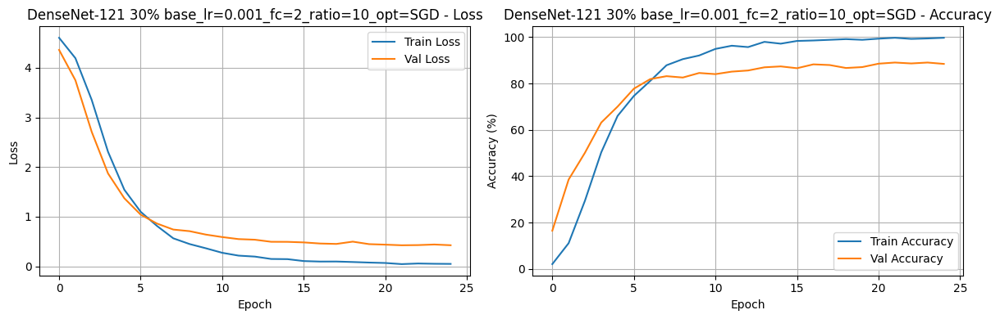


Training DenseNet-121 with 30% trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 1,719,168
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 5,234,688
Epoch 1: Train Loss: 5.2037, Train Acc: 1.37%, Val Loss: 4.3167, Val Acc: 5.39%
Epoch 2: Train Loss: 4.3400, Train Acc: 4.02%, Val Loss: 4.0117, Val Acc: 11.18%
Epoch 3: Train Loss: 4.1901, Train Acc: 6.86%, Val Loss: 3.8642, Val Acc: 15.69%
Epoch 4: Train Loss: 4.1327, Train Acc: 6.47%, Val Loss: 3.6459, Val Acc: 12.65%
Epoch 5: Train Loss: 3.9645, Train Acc: 8.24%, Val Loss: 3.4690, Val Acc: 17.65%
Epoch 6: Train Loss: 3.9579, Train Acc: 8.14%, Val Loss: 3.4353, Val Acc: 16.08%
Epoch 7: Train Loss: 3.8375, Train Acc: 10.10%, Val Loss: 3.2459, Val Acc: 19.71%
Epoch 8: Train Loss: 3.7836, Train Acc: 9.31%, Val Loss: 3.2084, Val Acc: 19.51%
Epoch 9: Train Loss: 3.8254, Train Acc: 9.51%, Val Loss: 3.3327, Val Acc: 16.76%
Epoch 10: Train Loss: 3.7987, Tra

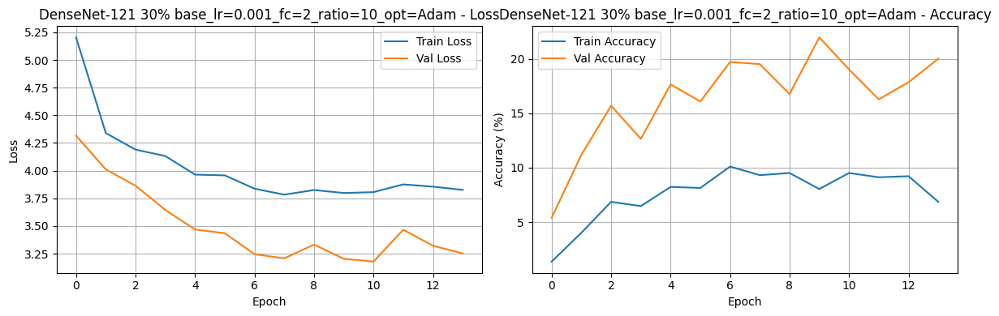


Training DenseNet-121 with 30% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 1,719,168
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 5,234,688
Epoch 1: Train Loss: 4.6049, Train Acc: 2.94%, Val Loss: 3.9314, Val Acc: 19.80%
Epoch 2: Train Loss: 4.1928, Train Acc: 8.82%, Val Loss: 3.9225, Val Acc: 13.33%
Epoch 3: Train Loss: 4.5230, Train Acc: 4.12%, Val Loss: 4.3194, Val Acc: 7.45%
Epoch 4: Train Loss: 4.4541, Train Acc: 4.02%, Val Loss: 4.2844, Val Acc: 6.47%
Epoch 5: Train Loss: 4.4660, Train Acc: 3.92%, Val Loss: 4.2957, Val Acc: 5.10%
Early stopping triggered after epoch 5
Test Accuracy: 5.19%


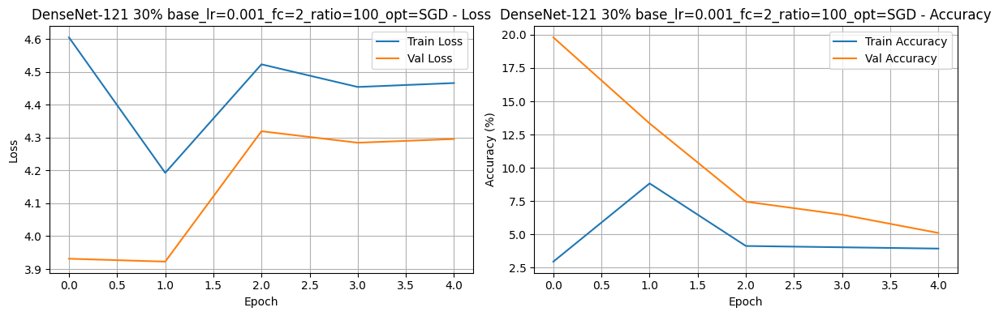


Training DenseNet-121 with 30% trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 1,719,168
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 5,234,688
Epoch 1: Train Loss: 77.1283, Train Acc: 0.78%, Val Loss: 4.6639, Val Acc: 1.18%
Epoch 2: Train Loss: 4.8093, Train Acc: 0.98%, Val Loss: 4.6971, Val Acc: 1.08%
Epoch 3: Train Loss: 4.7327, Train Acc: 0.59%, Val Loss: 4.6503, Val Acc: 0.98%
Epoch 4: Train Loss: 4.6700, Train Acc: 0.29%, Val Loss: 4.6450, Val Acc: 0.98%
Epoch 5: Train Loss: 4.9602, Train Acc: 0.88%, Val Loss: 4.6320, Val Acc: 0.98%
Epoch 6: Train Loss: 4.6715, Train Acc: 0.49%, Val Loss: 4.6301, Val Acc: 0.98%
Epoch 7: Train Loss: 4.6758, Train Acc: 0.49%, Val Loss: 4.6294, Val Acc: 0.98%
Epoch 8: Train Loss: 4.6729, Train Acc: 0.29%, Val Loss: 4.6298, Val Acc: 0.98%
Epoch 9: Train Loss: 4.6714, Train Acc: 0.39%, Val Loss: 4.6284, Val Acc: 0.98%
Epoch 10: Train Loss: 4.8202, Train Acc:

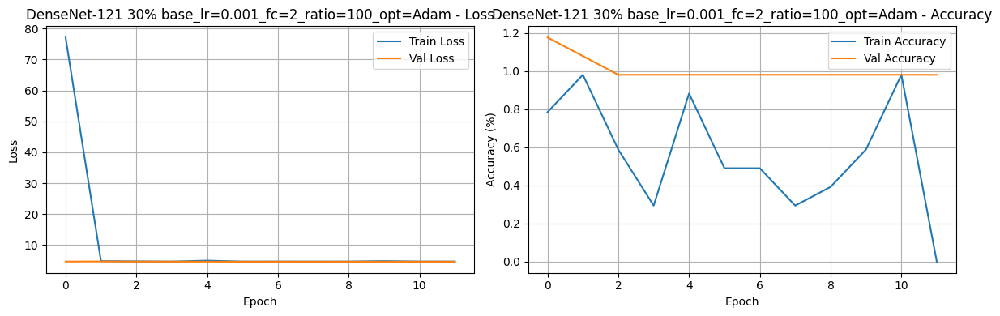


Training DenseNet-121 with 30% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 2,055,360
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 4,898,496
Epoch 1: Train Loss: 4.6661, Train Acc: 1.57%, Val Loss: 4.4837, Val Acc: 3.53%
Epoch 2: Train Loss: 4.3516, Train Acc: 7.45%, Val Loss: 4.2205, Val Acc: 14.61%
Epoch 3: Train Loss: 4.0585, Train Acc: 24.71%, Val Loss: 3.9716, Val Acc: 31.47%
Epoch 4: Train Loss: 3.7620, Train Acc: 44.02%, Val Loss: 3.7276, Val Acc: 44.80%
Epoch 5: Train Loss: 3.4904, Train Acc: 60.29%, Val Loss: 3.4862, Val Acc: 53.63%
Epoch 6: Train Loss: 3.2096, Train Acc: 72.75%, Val Loss: 3.2572, Val Acc: 62.45%
Epoch 7: Train Loss: 2.9480, Train Acc: 78.82%, Val Loss: 3.0395, Val Acc: 67.06%
Epoch 8: Train Loss: 2.6975, Train Acc: 83.63%, Val Loss: 2.8248, Val Acc: 70.78%
Epoch 9: Train Loss: 2.4617, Train Acc: 86.27%, Val Loss: 2.6319, Val Acc: 73.04%
Epoch 10: Train Loss: 2.240

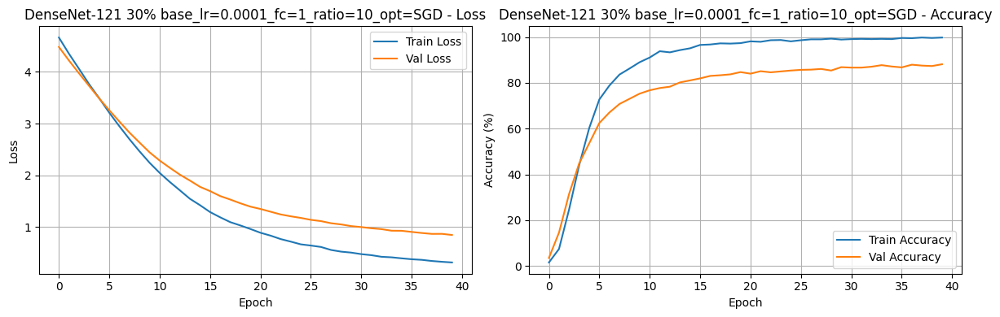


Training DenseNet-121 with 30% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 2,055,360
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 4,898,496
Epoch 1: Train Loss: 4.4437, Train Acc: 9.71%, Val Loss: 3.3666, Val Acc: 43.53%
Epoch 2: Train Loss: 2.5318, Train Acc: 67.06%, Val Loss: 2.1528, Val Acc: 74.02%
Epoch 3: Train Loss: 1.3149, Train Acc: 92.84%, Val Loss: 1.4033, Val Acc: 81.67%
Epoch 4: Train Loss: 0.6893, Train Acc: 97.94%, Val Loss: 1.0482, Val Acc: 86.76%
Epoch 5: Train Loss: 0.3841, Train Acc: 99.41%, Val Loss: 0.8508, Val Acc: 87.84%
Epoch 6: Train Loss: 0.2350, Train Acc: 100.00%, Val Loss: 0.7429, Val Acc: 89.12%
Epoch 7: Train Loss: 0.1579, Train Acc: 99.90%, Val Loss: 0.6679, Val Acc: 89.12%
Epoch 8: Train Loss: 0.1104, Train Acc: 100.00%, Val Loss: 0.6183, Val Acc: 89.31%
Epoch 9: Train Loss: 0.0831, Train Acc: 100.00%, Val Loss: 0.5917, Val Acc: 90.00%
Epoch 10: Train Loss:

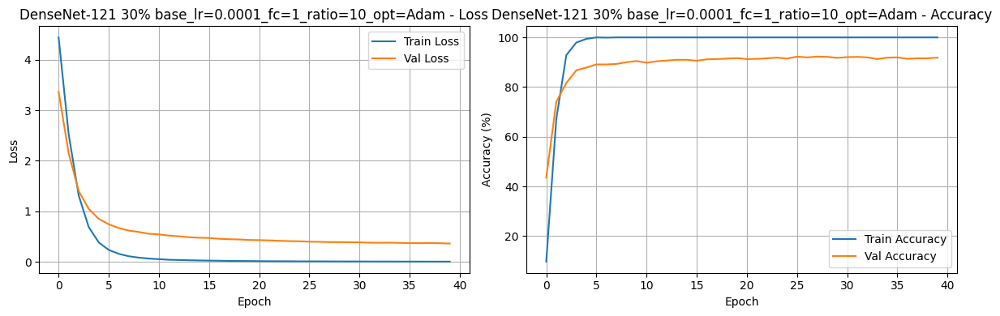


Training DenseNet-121 with 30% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 2,055,360
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 4,898,496
Epoch 1: Train Loss: 4.3418, Train Acc: 9.02%, Val Loss: 3.2473, Val Acc: 41.76%
Epoch 2: Train Loss: 2.3580, Train Acc: 60.49%, Val Loss: 1.9105, Val Acc: 69.31%
Epoch 3: Train Loss: 1.1179, Train Acc: 88.04%, Val Loss: 1.3168, Val Acc: 77.75%
Epoch 4: Train Loss: 0.6435, Train Acc: 95.88%, Val Loss: 1.0304, Val Acc: 83.43%
Epoch 5: Train Loss: 0.4041, Train Acc: 98.33%, Val Loss: 0.9008, Val Acc: 84.71%
Epoch 6: Train Loss: 0.2904, Train Acc: 99.12%, Val Loss: 0.8032, Val Acc: 86.96%
Epoch 7: Train Loss: 0.2196, Train Acc: 99.71%, Val Loss: 0.7660, Val Acc: 87.45%
Epoch 8: Train Loss: 0.1797, Train Acc: 99.90%, Val Loss: 0.7258, Val Acc: 87.45%
Epoch 9: Train Loss: 0.1471, Train Acc: 99.71%, Val Loss: 0.6939, Val Acc: 88.63%
Epoch 10: Train Loss: 0.

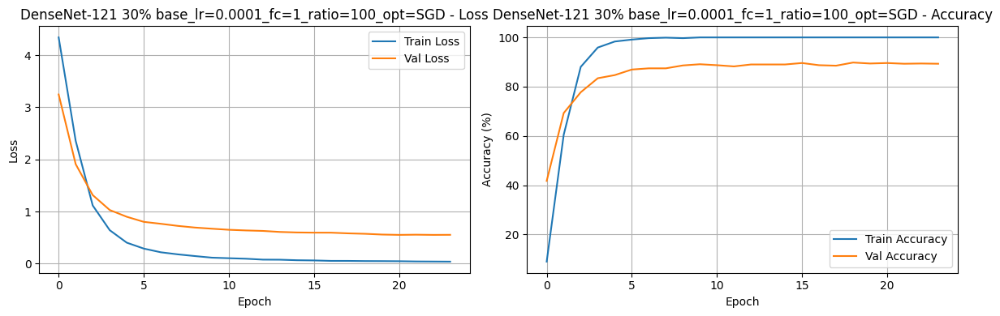


Training DenseNet-121 with 30% trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 2,055,360
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 4,898,496
Epoch 1: Train Loss: 5.6346, Train Acc: 20.39%, Val Loss: 1.9388, Val Acc: 56.47%
Epoch 2: Train Loss: 0.6493, Train Acc: 83.63%, Val Loss: 0.8152, Val Acc: 79.51%
Epoch 3: Train Loss: 0.1184, Train Acc: 97.45%, Val Loss: 0.7139, Val Acc: 80.59%
Epoch 4: Train Loss: 0.0439, Train Acc: 99.41%, Val Loss: 0.5346, Val Acc: 86.67%
Epoch 5: Train Loss: 0.0187, Train Acc: 99.90%, Val Loss: 0.4695, Val Acc: 86.96%
Epoch 6: Train Loss: 0.0086, Train Acc: 100.00%, Val Loss: 0.4275, Val Acc: 89.02%
Epoch 7: Train Loss: 0.0060, Train Acc: 100.00%, Val Loss: 0.4194, Val Acc: 89.22%
Epoch 8: Train Loss: 0.0064, Train Acc: 100.00%, Val Loss: 0.4143, Val Acc: 89.41%
Epoch 9: Train Loss: 0.0057, Train Acc: 100.00%, Val Loss: 0.4221, Val Acc: 89.12%
Epoch 10: Train Lo

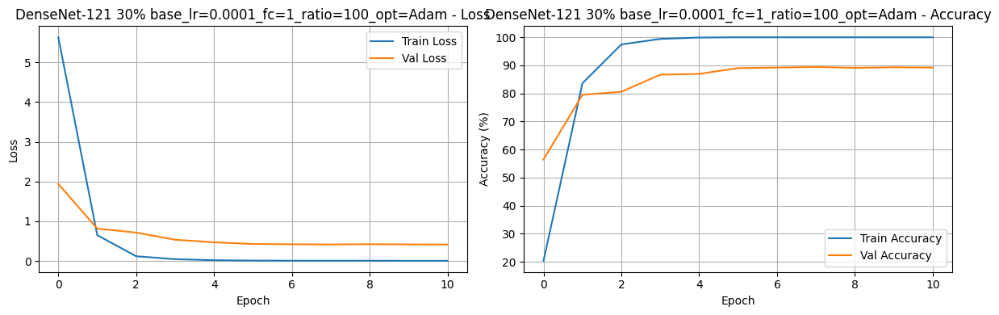


Training DenseNet-121 with 30% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 1,719,168
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 5,234,688
Epoch 1: Train Loss: 4.6490, Train Acc: 1.08%, Val Loss: 4.5936, Val Acc: 1.57%
Epoch 2: Train Loss: 4.5793, Train Acc: 1.76%, Val Loss: 4.5360, Val Acc: 3.43%
Epoch 3: Train Loss: 4.5057, Train Acc: 5.10%, Val Loss: 4.4808, Val Acc: 8.43%
Epoch 4: Train Loss: 4.4449, Train Acc: 4.90%, Val Loss: 4.4211, Val Acc: 14.71%
Epoch 5: Train Loss: 4.3738, Train Acc: 9.41%, Val Loss: 4.3578, Val Acc: 21.67%
Epoch 6: Train Loss: 4.3066, Train Acc: 12.94%, Val Loss: 4.2806, Val Acc: 30.78%
Epoch 7: Train Loss: 4.2046, Train Acc: 18.73%, Val Loss: 4.2049, Val Acc: 38.43%
Epoch 8: Train Loss: 4.1145, Train Acc: 22.25%, Val Loss: 4.1152, Val Acc: 45.10%
Epoch 9: Train Loss: 4.0210, Train Acc: 27.45%, Val Loss: 4.0165, Val Acc: 51.08%
Epoch 10: Train Loss: 3.9232, Tr

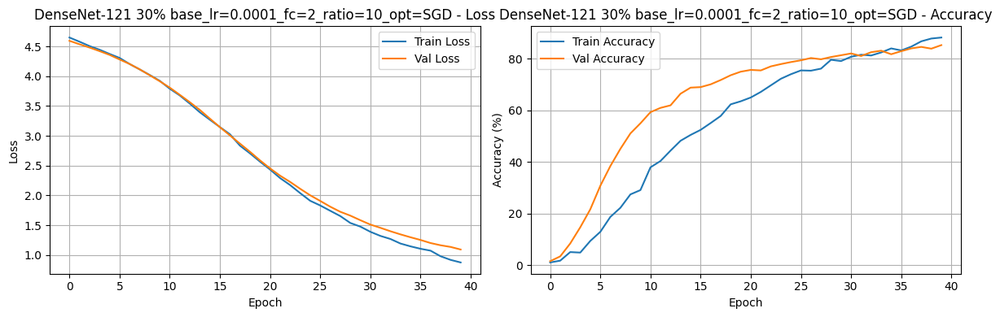


Training DenseNet-121 with 30% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 1,719,168
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 5,234,688
Epoch 1: Train Loss: 4.6078, Train Acc: 2.35%, Val Loss: 4.2162, Val Acc: 20.10%
Epoch 2: Train Loss: 3.8738, Train Acc: 17.84%, Val Loss: 3.2186, Val Acc: 44.80%
Epoch 3: Train Loss: 2.6987, Train Acc: 40.69%, Val Loss: 2.0692, Val Acc: 65.69%
Epoch 4: Train Loss: 1.8880, Train Acc: 55.88%, Val Loss: 1.4412, Val Acc: 73.82%
Epoch 5: Train Loss: 1.2355, Train Acc: 72.25%, Val Loss: 1.0613, Val Acc: 80.39%
Epoch 6: Train Loss: 0.8465, Train Acc: 81.76%, Val Loss: 0.8497, Val Acc: 81.67%
Epoch 7: Train Loss: 0.6195, Train Acc: 86.86%, Val Loss: 0.7275, Val Acc: 85.39%
Epoch 8: Train Loss: 0.4079, Train Acc: 92.55%, Val Loss: 0.6243, Val Acc: 85.98%
Epoch 9: Train Loss: 0.2984, Train Acc: 94.31%, Val Loss: 0.5762, Val Acc: 86.76%
Epoch 10: Train Loss: 0.

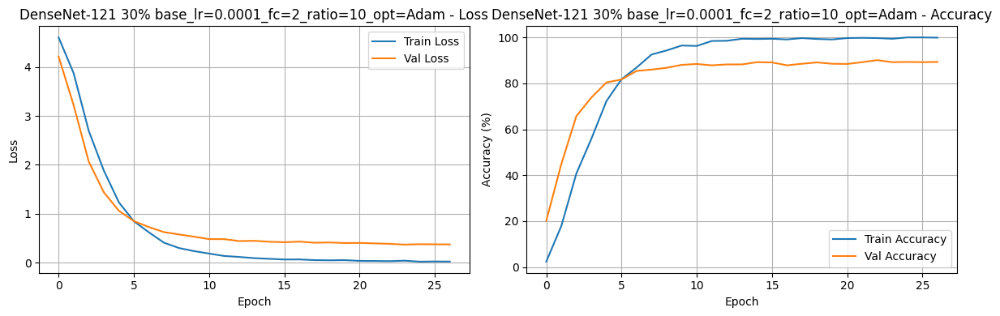


Training DenseNet-121 with 30% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 1,719,168
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 5,234,688
Epoch 1: Train Loss: 4.6174, Train Acc: 1.18%, Val Loss: 4.3879, Val Acc: 14.31%
Epoch 2: Train Loss: 4.2132, Train Acc: 12.16%, Val Loss: 3.8308, Val Acc: 34.90%
Epoch 3: Train Loss: 3.5454, Train Acc: 26.96%, Val Loss: 3.0359, Val Acc: 48.14%
Epoch 4: Train Loss: 2.6321, Train Acc: 42.65%, Val Loss: 2.1830, Val Acc: 60.88%
Epoch 5: Train Loss: 1.8770, Train Acc: 58.33%, Val Loss: 1.5352, Val Acc: 71.18%
Epoch 6: Train Loss: 1.3599, Train Acc: 68.92%, Val Loss: 1.2759, Val Acc: 74.22%
Epoch 7: Train Loss: 1.0350, Train Acc: 76.57%, Val Loss: 1.0645, Val Acc: 76.86%
Epoch 8: Train Loss: 0.8118, Train Acc: 83.04%, Val Loss: 0.8823, Val Acc: 80.49%
Epoch 9: Train Loss: 0.6148, Train Acc: 87.45%, Val Loss: 0.8309, Val Acc: 80.88%
Epoch 10: Train Loss: 0.

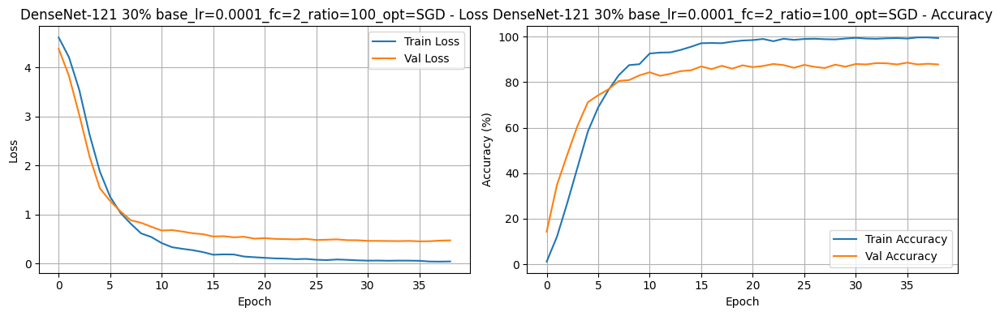


Training DenseNet-121 with 30% trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 1,719,168
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 5,234,688
Epoch 1: Train Loss: 5.6175, Train Acc: 1.47%, Val Loss: 4.5456, Val Acc: 4.90%
Epoch 2: Train Loss: 4.4839, Train Acc: 2.55%, Val Loss: 4.2440, Val Acc: 7.84%
Epoch 3: Train Loss: 4.3538, Train Acc: 3.63%, Val Loss: 4.1198, Val Acc: 7.45%
Epoch 4: Train Loss: 4.2353, Train Acc: 4.31%, Val Loss: 3.9662, Val Acc: 7.84%
Epoch 5: Train Loss: 4.2394, Train Acc: 4.51%, Val Loss: 3.7994, Val Acc: 11.08%
Epoch 6: Train Loss: 4.1573, Train Acc: 5.00%, Val Loss: 3.7855, Val Acc: 9.51%
Epoch 7: Train Loss: 4.1613, Train Acc: 6.08%, Val Loss: 4.0846, Val Acc: 7.55%
Epoch 8: Train Loss: 4.1793, Train Acc: 5.49%, Val Loss: 3.9587, Val Acc: 11.08%
Epoch 9: Train Loss: 4.1180, Train Acc: 5.20%, Val Loss: 3.5279, Val Acc: 12.94%
Epoch 10: Train Loss: 4.1026, Train A

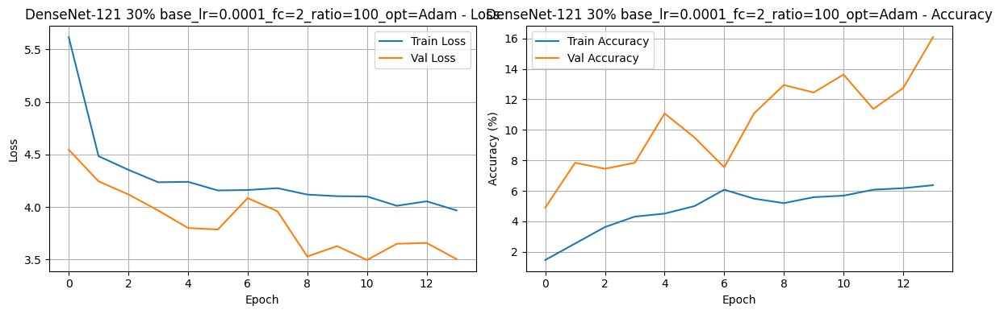

,base_lr,ratio,fc_layers,optimizer,final_val_accuracy,test_accuracy,final_train_loss,final_train_accuracy,final_val_loss
0,0.0010,10,1,SGD,91.274510,88.144414,0.012652,100.000000,0.407869
1,0.0010,10,1,Adam,86.862745,84.599122,0.046078,99.019608,0.623196
2,0.0010,100,1,SGD,85.980392,83.021630,0.003909,99.901961,0.722707
3,0.0010,100,1,Adam,75.686275,73.881932,1.138775,95.196078,8.239467
4,0.0010,10,2,SGD,88.431373,86.827126,0.050381,99.705882,0.426294
5,0.0010,10,2,Adam,20.000000,16.994633,3.826754,6.862745,3.252595
6,0.0010,100,2,SGD,5.098039,5.187835,4.466023,3.921569,4.295683
7,0.0010,100,2,Adam,0.980392,1.057082,4.675316,0.000000,4.629287
8,0.0001,10,1,SGD,88.137255,85.412262,0.310729,99.803922,0.842748
9,0.0001,10,1,Adam,91.862745,89.917060,0.003954,100.000000,0.361771


In [40]:
Optimizers = [
    lambda model, base_lr, ratio: optim.SGD(get_parameter_groups(model, base_lr, ratio), momentum=0.9),
    lambda model, base_lr, ratio: optim.Adam(get_parameter_groups(model, base_lr, ratio))

]
optimizer_names = ['SGD','Adam']
LRs = [0.001, 0.0001]
FCs = [1, 2]
Ratios = [10, 100]
all_results = []

for base_lr in LRs:
    for fc_layers in FCs:
        for ratio in Ratios:
            for opt_func, opt_name in zip(Optimizers, optimizer_names):
                dense121=models.densenet121
                model_name="DenseNet-121"
                trainable = "30%"
                
                print(f"\nTraining {model_name} with {trainable} trainable parameters, "
                      f"base_lr={base_lr}, fc_layers={fc_layers}, ratio={ratio}, optimizer={opt_name}")
                
                # Load and modify model
                model = dense121(pretrained=True)
                model = modify_model(model, num_layers=fc_layers).to(device)
                
                # Set trainable layers
                set_trainable_layers(model, trainable,0)
                
                # Print model structure
                print_model_structure(model,base_lr,ratio)
                
                # Train model with specified optimizer
                optimizer = opt_func(model, base_lr, ratio)
                train_losses, train_accuracies, val_losses, val_accuracies = train_model(
                    model, trainloader, valloader,optimizer, num_epochs=40, patience=3, min_delta=0.001,
                base_lr=base_lr,ratio=ratio)
                
                # Evaluate on test set
                test_acc = evaluate_model(model, testloader)
                print(f'Test Accuracy: {test_acc:.2f}%')
                
                # Store results
                results = {
                    'train_losses': train_losses,
                    'train_accuracies': train_accuracies,
                    'val_losses': val_losses,
                    'val_accuracies': val_accuracies,
                    'final_val_accuracy': val_accuracies[-1],
                    'test_accuracy': test_acc,
                    'base_lr': base_lr,
                    'ratio': ratio,
                    'fc_layers': fc_layers,
                    'optimizer': opt_name
                }
                all_results.append(results)
                
                # Plot metrics
                plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies,
                             f"{model_name} {trainable} base_lr={base_lr}_fc={fc_layers}_ratio={ratio}_opt={opt_name}")
results_df = pd.DataFrame([
    {
        'base_lr': res['base_lr'],
        'ratio': res['ratio'],
        'fc_layers': res['fc_layers'],
        'optimizer': res['optimizer'],
        'final_val_accuracy': res['final_val_accuracy'],
        'test_accuracy': res['test_accuracy'],
        'final_train_loss': res['train_losses'][-1],
        'final_train_accuracy': res['train_accuracies'][-1],
        'final_val_loss': res['val_losses'][-1]
    } for res in all_results
])
results_df

### only classifire



#### Hyper parameter tuning


Training DenseNet-121 with last trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 6,953,856


C:\Users\Kia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\Kia\AppData\Local\Programs\Python\Python312\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1: Train Loss: 4.3883, Train Acc: 8.24%, Val Loss: 3.2919, Val Acc: 33.14%
Epoch 2: Train Loss: 2.3582, Train Acc: 62.16%, Val Loss: 1.9509, Val Acc: 64.41%
Epoch 3: Train Loss: 1.1733, Train Acc: 88.43%, Val Loss: 1.3268, Val Acc: 79.22%
Epoch 4: Train Loss: 0.6601, Train Acc: 96.08%, Val Loss: 1.0963, Val Acc: 82.84%
Epoch 5: Train Loss: 0.4658, Train Acc: 97.16%, Val Loss: 0.9821, Val Acc: 82.45%
Epoch 6: Train Loss: 0.3242, Train Acc: 98.82%, Val Loss: 0.8576, Val Acc: 85.10%
Epoch 7: Train Loss: 0.2401, Train Acc: 99.90%, Val Loss: 0.8061, Val Acc: 87.16%
Epoch 8: Train Loss: 0.1938, Train Acc: 99.80%, Val Loss: 0.7706, Val Acc: 86.76%
Epoch 9: Train Loss: 0.1603, Train Acc: 99.90%, Val Loss: 0.7407, Val Acc: 87.35%
Epoch 10: Train Loss: 0.1396, Train Acc: 100.00%, Val Loss: 0.7175, Val Acc: 87.55%
Epoch 11: Train Loss: 0.1207, Train Acc: 100.00%, Val Loss: 0.7021, Val Acc: 87.45%
Epoch 12: Train Loss: 0.1025, Train Acc: 100.00%, Val Loss: 0.6743, Val Acc: 88.04%
Epoch 13: T

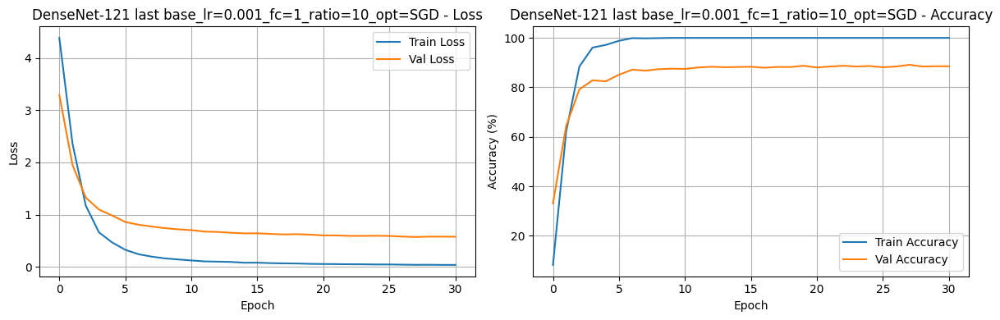


Training DenseNet-121 with last trainable parameters, base_lr=0.001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 5.8010, Train Acc: 21.57%, Val Loss: 2.4698, Val Acc: 54.02%
Epoch 2: Train Loss: 0.9141, Train Acc: 80.98%, Val Loss: 0.9613, Val Acc: 75.78%
Epoch 3: Train Loss: 0.1797, Train Acc: 96.57%, Val Loss: 0.8601, Val Acc: 78.33%
Epoch 4: Train Loss: 0.0852, Train Acc: 98.43%, Val Loss: 0.6047, Val Acc: 85.49%
Epoch 5: Train Loss: 0.0397, Train Acc: 100.00%, Val Loss: 0.5702, Val Acc: 86.18%
Epoch 6: Train Loss: 0.0260, Train Acc: 100.00%, Val Loss: 0.5849, Val Acc: 84.31%
Epoch 7: Train Loss: 0.0190, Train Acc: 100.00%, Val Loss: 0.5588, Val Acc: 85.78%
Epoch 8: Train Loss: 0.0166, Train Acc: 100.00%, Val Loss: 0.5621, Val Acc: 85.49%
Epoch 9: Train Loss: 0.0115, Train Acc: 100.00%, Val Loss: 0.5185, Val Acc: 87.45%
Epoch 10: Train Loss: 0.00

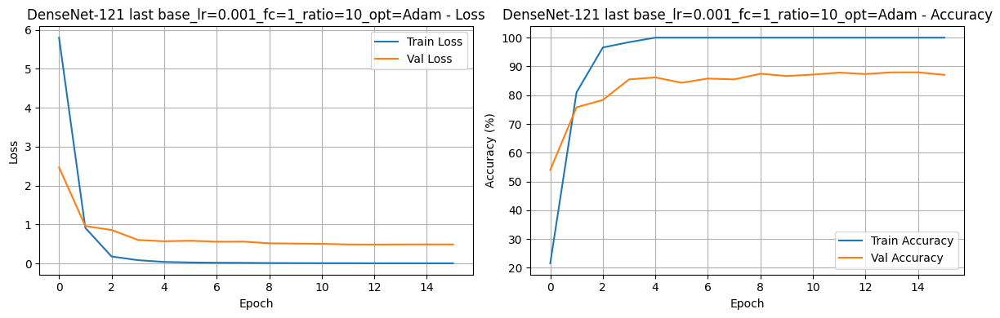


Training DenseNet-121 with last trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 5.8784, Train Acc: 24.22%, Val Loss: 5.0480, Val Acc: 54.31%
Epoch 2: Train Loss: 2.2331, Train Acc: 77.16%, Val Loss: 1.7111, Val Acc: 70.29%
Epoch 3: Train Loss: 0.4786, Train Acc: 90.00%, Val Loss: 1.4639, Val Acc: 70.88%
Epoch 4: Train Loss: 0.1897, Train Acc: 94.90%, Val Loss: 1.3699, Val Acc: 73.73%
Epoch 5: Train Loss: 0.1633, Train Acc: 95.88%, Val Loss: 1.1884, Val Acc: 79.51%
Epoch 6: Train Loss: 0.0960, Train Acc: 97.25%, Val Loss: 1.1515, Val Acc: 79.90%
Epoch 7: Train Loss: 0.0402, Train Acc: 98.53%, Val Loss: 0.8637, Val Acc: 82.35%
Epoch 8: Train Loss: 0.0229, Train Acc: 99.31%, Val Loss: 0.8036, Val Acc: 83.33%
Epoch 9: Train Loss: 0.0045, Train Acc: 99.90%, Val Loss: 0.7698, Val Acc: 85.88%
Epoch 10: Train Loss: 0.0023, T

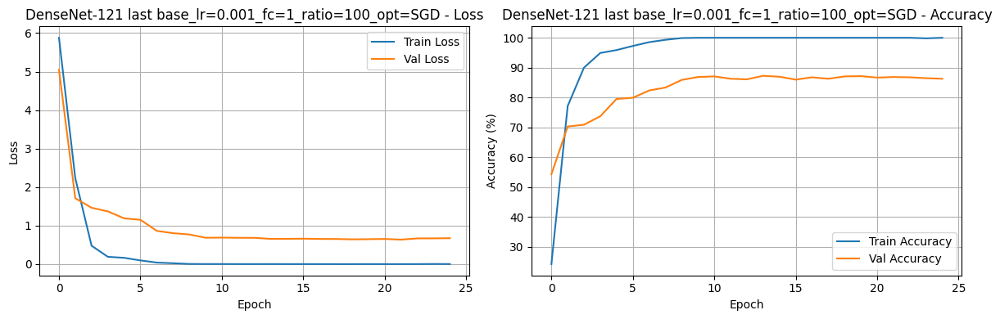


Training DenseNet-121 with last trainable parameters, base_lr=0.001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 102.4296, Train Acc: 5.88%, Val Loss: 112.5848, Val Acc: 13.73%
Epoch 2: Train Loss: 62.6212, Train Acc: 37.75%, Val Loss: 22.0521, Val Acc: 48.24%
Epoch 3: Train Loss: 7.3370, Train Acc: 71.27%, Val Loss: 9.4536, Val Acc: 61.18%
Epoch 4: Train Loss: 2.0290, Train Acc: 86.27%, Val Loss: 5.8090, Val Acc: 67.94%
Epoch 5: Train Loss: 1.5273, Train Acc: 90.00%, Val Loss: 7.2544, Val Acc: 67.06%
Epoch 6: Train Loss: 1.6788, Train Acc: 90.20%, Val Loss: 7.3499, Val Acc: 68.14%
Epoch 7: Train Loss: 1.3843, Train Acc: 91.57%, Val Loss: 9.3423, Val Acc: 62.16%
Early stopping triggered after epoch 7
Test Accuracy: 59.52%


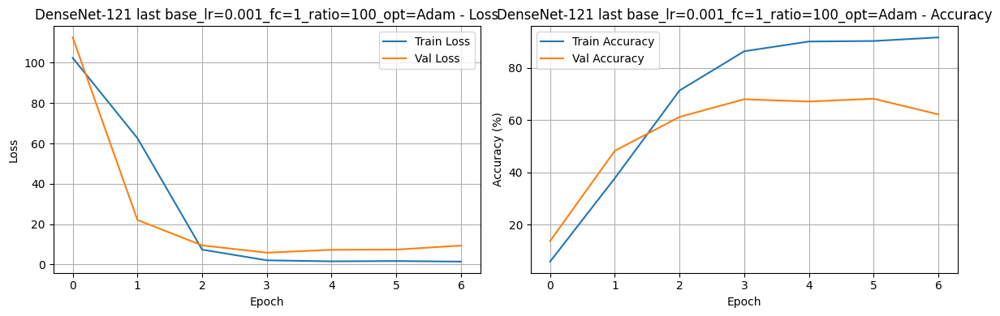


Training DenseNet-121 with last trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 4.6105, Train Acc: 1.27%, Val Loss: 4.3535, Val Acc: 17.84%
Epoch 2: Train Loss: 4.1899, Train Acc: 11.96%, Val Loss: 3.7976, Val Acc: 32.06%
Epoch 3: Train Loss: 3.4032, Train Acc: 29.31%, Val Loss: 2.8720, Val Acc: 53.63%
Epoch 4: Train Loss: 2.4509, Train Acc: 46.86%, Val Loss: 2.1055, Val Acc: 60.00%
Epoch 5: Train Loss: 1.8074, Train Acc: 60.69%, Val Loss: 1.5582, Val Acc: 70.78%
Epoch 6: Train Loss: 1.3082, Train Acc: 70.59%, Val Loss: 1.2628, Val Acc: 74.51%
Epoch 7: Train Loss: 1.0267, Train Acc: 76.96%, Val Loss: 1.0900, Val Acc: 76.47%
Epoch 8: Train Loss: 0.8064, Train Acc: 82.25%, Val Loss: 0.9487, Val Acc: 79.61%
Epoch 9: Train Loss: 0.6253, Train Acc: 87.45%, Val Loss: 0.8479, Val Acc: 80.39%
Epoch 10: Train Loss: 0.5118, Tra

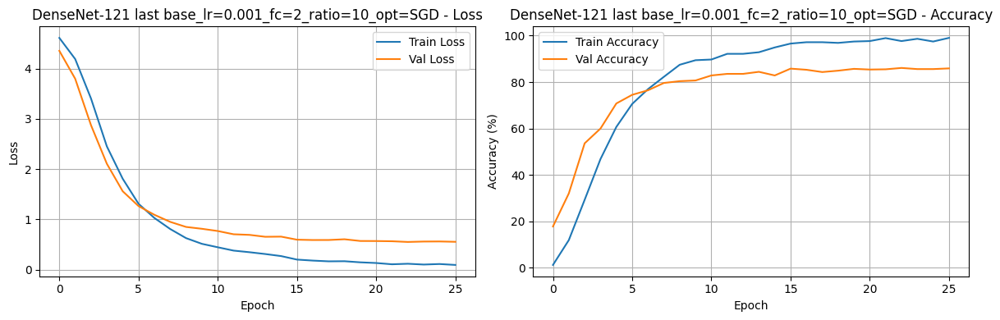


Training DenseNet-121 with last trainable parameters, base_lr=0.001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 5.2684, Train Acc: 1.37%, Val Loss: 4.4562, Val Acc: 2.25%
Epoch 2: Train Loss: 4.4341, Train Acc: 3.14%, Val Loss: 4.2832, Val Acc: 5.00%
Epoch 3: Train Loss: 4.3274, Train Acc: 2.55%, Val Loss: 4.1338, Val Acc: 6.86%
Epoch 4: Train Loss: 4.2976, Train Acc: 3.53%, Val Loss: 4.0980, Val Acc: 8.14%
Epoch 5: Train Loss: 4.2809, Train Acc: 3.63%, Val Loss: 3.9380, Val Acc: 7.75%
Epoch 6: Train Loss: 4.2350, Train Acc: 3.73%, Val Loss: 3.8765, Val Acc: 7.55%
Epoch 7: Train Loss: 4.1468, Train Acc: 3.82%, Val Loss: 3.6399, Val Acc: 13.04%
Epoch 8: Train Loss: 4.1173, Train Acc: 4.31%, Val Loss: 3.7715, Val Acc: 9.31%
Epoch 9: Train Loss: 4.0717, Train Acc: 5.10%, Val Loss: 3.6185, Val Acc: 11.57%
Epoch 10: Train Loss: 4.0218, Train Acc: 5.10%,

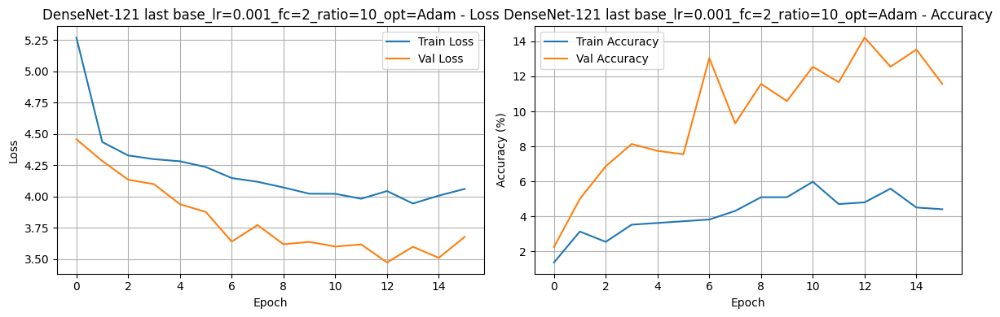


Training DenseNet-121 with last trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 4.6538, Train Acc: 1.86%, Val Loss: 3.9247, Val Acc: 13.14%
Epoch 2: Train Loss: 4.3775, Train Acc: 5.98%, Val Loss: 4.2513, Val Acc: 6.37%
Epoch 3: Train Loss: 4.4520, Train Acc: 3.92%, Val Loss: 4.4152, Val Acc: 4.51%
Epoch 4: Train Loss: 4.6037, Train Acc: 1.96%, Val Loss: 4.5445, Val Acc: 3.33%
Early stopping triggered after epoch 4
Test Accuracy: 4.72%


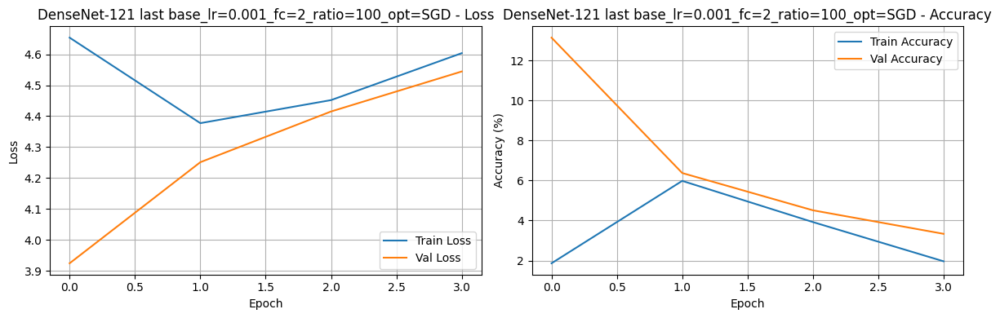


Training DenseNet-121 with last trainable parameters, base_lr=0.001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 41.1498, Train Acc: 1.08%, Val Loss: 4.6328, Val Acc: 1.57%
Epoch 2: Train Loss: 5.0819, Train Acc: 1.47%, Val Loss: 4.7000, Val Acc: 2.16%
Epoch 3: Train Loss: 4.9735, Train Acc: 0.78%, Val Loss: 4.6232, Val Acc: 1.18%
Epoch 4: Train Loss: 4.7492, Train Acc: 0.49%, Val Loss: 4.6241, Val Acc: 1.18%
Epoch 5: Train Loss: 4.6688, Train Acc: 0.39%, Val Loss: 4.6258, Val Acc: 1.08%
Epoch 6: Train Loss: 4.7623, Train Acc: 0.59%, Val Loss: 4.5992, Val Acc: 1.67%
Epoch 7: Train Loss: 4.7282, Train Acc: 0.29%, Val Loss: 4.6293, Val Acc: 0.98%
Epoch 8: Train Loss: 5.7075, Train Acc: 0.69%, Val Loss: 4.6304, Val Acc: 0.98%
Epoch 9: Train Loss: 4.6855, Train Acc: 0.29%, Val Loss: 4.6325, Val Acc: 0.98%
Early stopping triggered after epoch 9
Test Acc

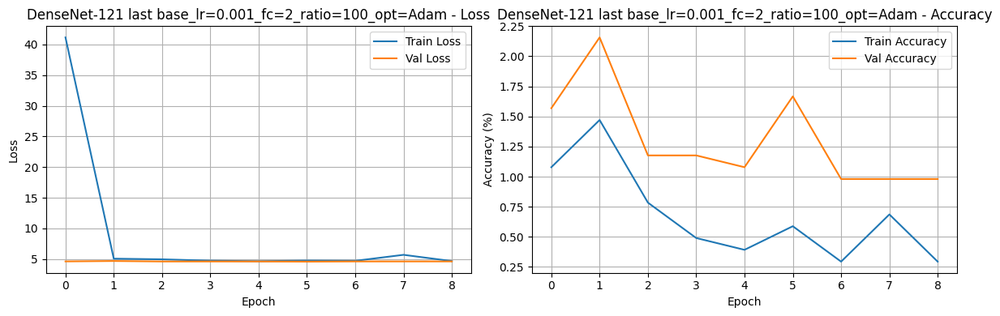


Training DenseNet-121 with last trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 4.6798, Train Acc: 1.96%, Val Loss: 4.4918, Val Acc: 5.20%
Epoch 2: Train Loss: 4.3802, Train Acc: 6.76%, Val Loss: 4.2444, Val Acc: 14.71%
Epoch 3: Train Loss: 4.0970, Train Acc: 22.45%, Val Loss: 4.0062, Val Acc: 28.43%
Epoch 4: Train Loss: 3.8121, Train Acc: 42.25%, Val Loss: 3.7755, Val Acc: 41.86%
Epoch 5: Train Loss: 3.5654, Train Acc: 57.84%, Val Loss: 3.5729, Val Acc: 50.98%
Epoch 6: Train Loss: 3.3126, Train Acc: 69.31%, Val Loss: 3.3583, Val Acc: 57.25%
Epoch 7: Train Loss: 3.0818, Train Acc: 75.69%, Val Loss: 3.1724, Val Acc: 61.96%
Epoch 8: Train Loss: 2.8427, Train Acc: 82.25%, Val Loss: 2.9821, Val Acc: 65.29%
Epoch 9: Train Loss: 2.6406, Train Acc: 85.29%, Val Loss: 2.8160, Val Acc: 69.51%
Epoch 10: Train Loss: 2.4366, Trai

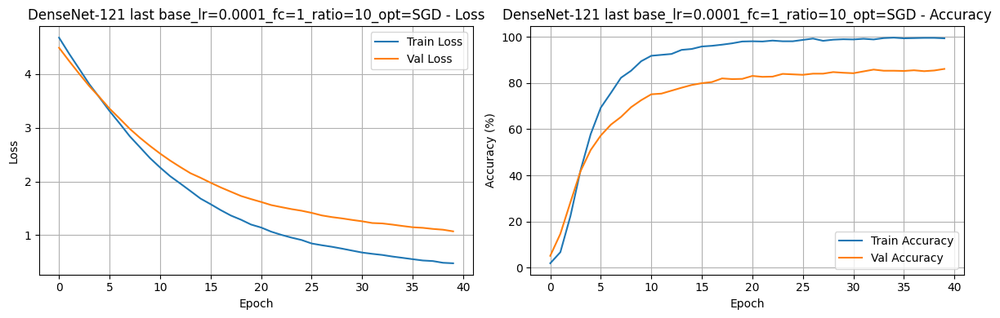


Training DenseNet-121 with last trainable parameters, base_lr=0.0001, fc_layers=1, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 4.5883, Train Acc: 5.29%, Val Loss: 3.8376, Val Acc: 20.78%
Epoch 2: Train Loss: 3.2000, Train Acc: 51.47%, Val Loss: 2.8809, Val Acc: 63.63%
Epoch 3: Train Loss: 2.2228, Train Acc: 81.18%, Val Loss: 2.2186, Val Acc: 74.02%
Epoch 4: Train Loss: 1.5405, Train Acc: 89.90%, Val Loss: 1.7958, Val Acc: 77.55%
Epoch 5: Train Loss: 1.1068, Train Acc: 95.10%, Val Loss: 1.4832, Val Acc: 84.02%
Epoch 6: Train Loss: 0.7891, Train Acc: 98.04%, Val Loss: 1.3010, Val Acc: 84.61%
Epoch 7: Train Loss: 0.6027, Train Acc: 98.33%, Val Loss: 1.1660, Val Acc: 85.00%
Epoch 8: Train Loss: 0.4694, Train Acc: 99.12%, Val Loss: 1.0631, Val Acc: 85.78%
Epoch 9: Train Loss: 0.3899, Train Acc: 99.31%, Val Loss: 0.9880, Val Acc: 85.98%
Epoch 10: Train Loss: 0.3037, T

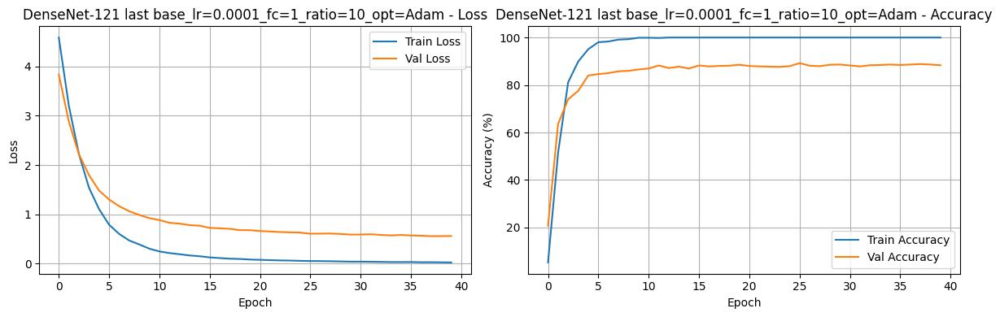


Training DenseNet-121 with last trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 4.3704, Train Acc: 9.31%, Val Loss: 3.3586, Val Acc: 36.08%
Epoch 2: Train Loss: 2.3420, Train Acc: 62.45%, Val Loss: 1.9875, Val Acc: 64.41%
Epoch 3: Train Loss: 1.1596, Train Acc: 87.84%, Val Loss: 1.3352, Val Acc: 78.82%
Epoch 4: Train Loss: 0.6718, Train Acc: 94.80%, Val Loss: 1.0906, Val Acc: 82.06%
Epoch 5: Train Loss: 0.4439, Train Acc: 97.94%, Val Loss: 0.9543, Val Acc: 84.12%
Epoch 6: Train Loss: 0.3103, Train Acc: 99.61%, Val Loss: 0.8677, Val Acc: 86.18%
Epoch 7: Train Loss: 0.2507, Train Acc: 99.71%, Val Loss: 0.8018, Val Acc: 87.16%
Epoch 8: Train Loss: 0.2019, Train Acc: 99.80%, Val Loss: 0.7688, Val Acc: 85.98%
Epoch 9: Train Loss: 0.1630, Train Acc: 99.90%, Val Loss: 0.7328, Val Acc: 86.86%
Epoch 10: Train Loss: 0.1361, T

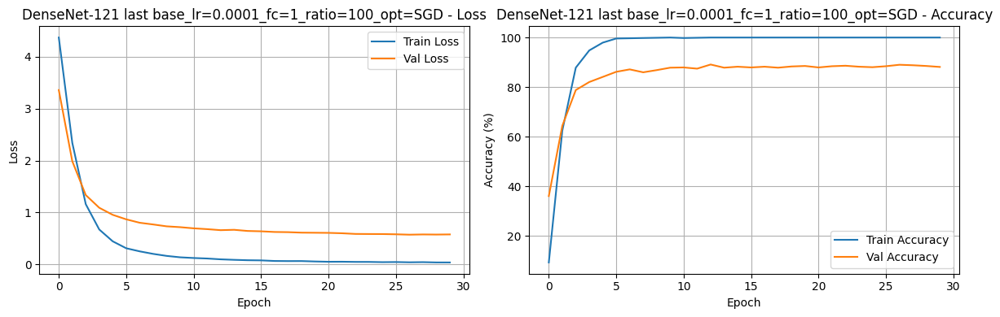


Training DenseNet-121 with last trainable parameters, base_lr=0.0001, fc_layers=1, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 6.0431, Train Acc: 19.22%, Val Loss: 2.5577, Val Acc: 51.37%
Epoch 2: Train Loss: 1.1091, Train Acc: 78.24%, Val Loss: 1.0683, Val Acc: 74.22%
Epoch 3: Train Loss: 0.2492, Train Acc: 94.90%, Val Loss: 0.7970, Val Acc: 80.00%
Epoch 4: Train Loss: 0.1053, Train Acc: 97.94%, Val Loss: 0.7055, Val Acc: 81.47%
Epoch 5: Train Loss: 0.0571, Train Acc: 99.61%, Val Loss: 0.6297, Val Acc: 84.22%
Epoch 6: Train Loss: 0.0632, Train Acc: 99.02%, Val Loss: 0.6330, Val Acc: 83.73%
Epoch 7: Train Loss: 0.0207, Train Acc: 99.90%, Val Loss: 0.5377, Val Acc: 86.86%
Epoch 8: Train Loss: 0.0124, Train Acc: 100.00%, Val Loss: 0.5093, Val Acc: 87.35%
Epoch 9: Train Loss: 0.0091, Train Acc: 100.00%, Val Loss: 0.4986, Val Acc: 87.75%
Epoch 10: Train Loss: 0.008

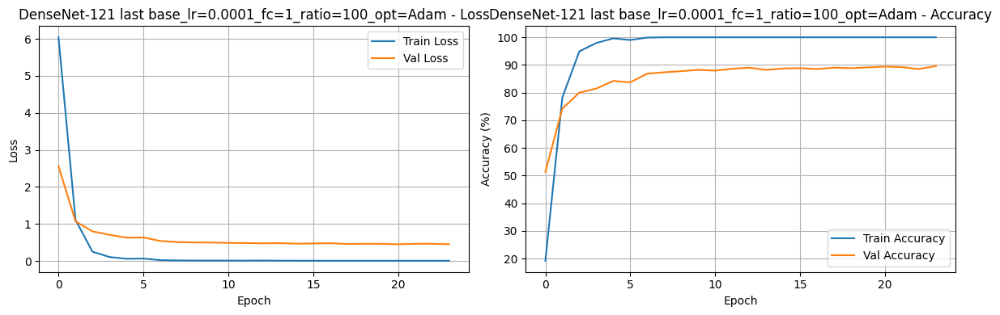


Training DenseNet-121 with last trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 4.6508, Train Acc: 1.37%, Val Loss: 4.5927, Val Acc: 3.24%
Epoch 2: Train Loss: 4.5809, Train Acc: 2.35%, Val Loss: 4.5346, Val Acc: 6.27%
Epoch 3: Train Loss: 4.5035, Train Acc: 4.41%, Val Loss: 4.4828, Val Acc: 11.18%
Epoch 4: Train Loss: 4.4357, Train Acc: 7.65%, Val Loss: 4.4256, Val Acc: 17.25%
Epoch 5: Train Loss: 4.3805, Train Acc: 8.14%, Val Loss: 4.3628, Val Acc: 23.92%
Epoch 6: Train Loss: 4.3056, Train Acc: 13.43%, Val Loss: 4.2907, Val Acc: 28.73%
Epoch 7: Train Loss: 4.2253, Train Acc: 18.73%, Val Loss: 4.2192, Val Acc: 34.80%
Epoch 8: Train Loss: 4.1413, Train Acc: 21.76%, Val Loss: 4.1369, Val Acc: 40.69%
Epoch 9: Train Loss: 4.0401, Train Acc: 26.76%, Val Loss: 4.0476, Val Acc: 47.45%
Epoch 10: Train Loss: 3.9488, Train Ac

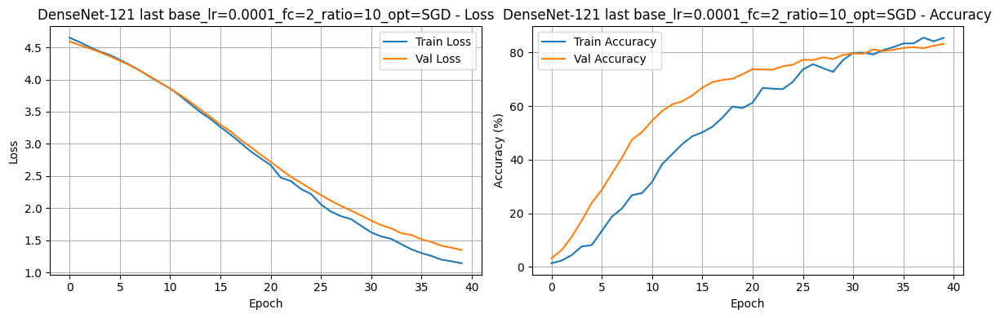


Training DenseNet-121 with last trainable parameters, base_lr=0.0001, fc_layers=2, ratio=10, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 4.6428, Train Acc: 2.55%, Val Loss: 4.2873, Val Acc: 18.14%
Epoch 2: Train Loss: 4.0109, Train Acc: 13.24%, Val Loss: 3.5883, Val Acc: 36.76%
Epoch 3: Train Loss: 3.2857, Train Acc: 30.78%, Val Loss: 2.8014, Val Acc: 58.04%
Epoch 4: Train Loss: 2.5337, Train Acc: 46.86%, Val Loss: 2.1145, Val Acc: 68.33%
Epoch 5: Train Loss: 1.9279, Train Acc: 60.69%, Val Loss: 1.6835, Val Acc: 73.24%
Epoch 6: Train Loss: 1.5136, Train Acc: 67.84%, Val Loss: 1.3656, Val Acc: 77.45%
Epoch 7: Train Loss: 1.2068, Train Acc: 74.90%, Val Loss: 1.1940, Val Acc: 78.43%
Epoch 8: Train Loss: 1.0560, Train Acc: 77.25%, Val Loss: 1.0988, Val Acc: 77.45%
Epoch 9: Train Loss: 0.8875, Train Acc: 81.08%, Val Loss: 0.9495, Val Acc: 80.29%
Epoch 10: Train Loss: 0.7306, T

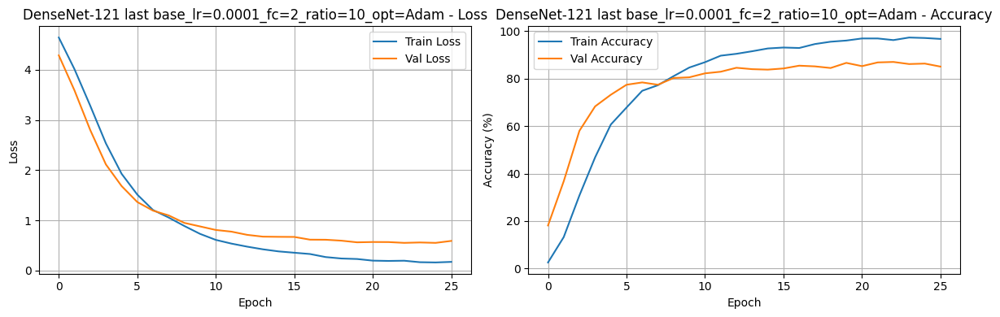


Training DenseNet-121 with last trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=SGD
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 4.6093, Train Acc: 1.96%, Val Loss: 4.3737, Val Acc: 14.02%
Epoch 2: Train Loss: 4.1851, Train Acc: 11.18%, Val Loss: 3.8187, Val Acc: 30.00%
Epoch 3: Train Loss: 3.4492, Train Acc: 28.33%, Val Loss: 2.9777, Val Acc: 46.27%
Epoch 4: Train Loss: 2.5821, Train Acc: 42.75%, Val Loss: 2.1212, Val Acc: 63.82%
Epoch 5: Train Loss: 1.8078, Train Acc: 61.18%, Val Loss: 1.5696, Val Acc: 71.76%
Epoch 6: Train Loss: 1.3755, Train Acc: 67.94%, Val Loss: 1.2937, Val Acc: 71.96%
Epoch 7: Train Loss: 1.0503, Train Acc: 75.49%, Val Loss: 1.1334, Val Acc: 74.41%
Epoch 8: Train Loss: 0.7790, Train Acc: 81.86%, Val Loss: 0.9349, Val Acc: 79.02%
Epoch 9: Train Loss: 0.6530, Train Acc: 85.29%, Val Loss: 0.8416, Val Acc: 82.06%
Epoch 10: Train Loss: 0.4890, T

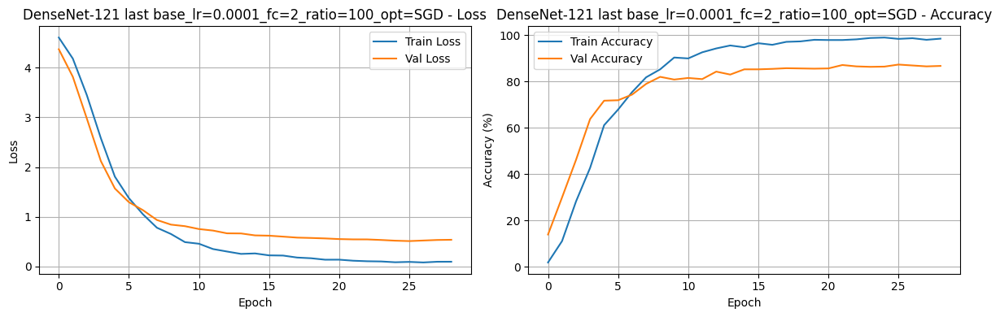


Training DenseNet-121 with last trainable parameters, base_lr=0.0001, fc_layers=2, ratio=100, optimizer=Adam
Total Trainable Parameters in Group 1: 0
Total Trainable Parameters in Group 2: 577,126
Total Frozen Parameters: 6,953,856
Epoch 1: Train Loss: 5.1496, Train Acc: 1.86%, Val Loss: 4.4953, Val Acc: 2.84%
Epoch 2: Train Loss: 4.4944, Train Acc: 2.45%, Val Loss: 4.2781, Val Acc: 6.47%
Epoch 3: Train Loss: 4.4513, Train Acc: 1.86%, Val Loss: 4.3245, Val Acc: 3.92%
Epoch 4: Train Loss: 4.4310, Train Acc: 2.35%, Val Loss: 4.2258, Val Acc: 4.51%
Epoch 5: Train Loss: 4.4391, Train Acc: 2.35%, Val Loss: 4.2679, Val Acc: 5.20%
Epoch 6: Train Loss: 4.3653, Train Acc: 2.84%, Val Loss: 4.2169, Val Acc: 5.00%
Epoch 7: Train Loss: 4.3753, Train Acc: 2.65%, Val Loss: 4.1586, Val Acc: 5.39%
Epoch 8: Train Loss: 4.2610, Train Acc: 2.84%, Val Loss: 3.9561, Val Acc: 8.24%
Epoch 9: Train Loss: 4.2332, Train Acc: 2.94%, Val Loss: 3.9798, Val Acc: 8.63%
Epoch 10: Train Loss: 4.2913, Train Acc: 3.14%,

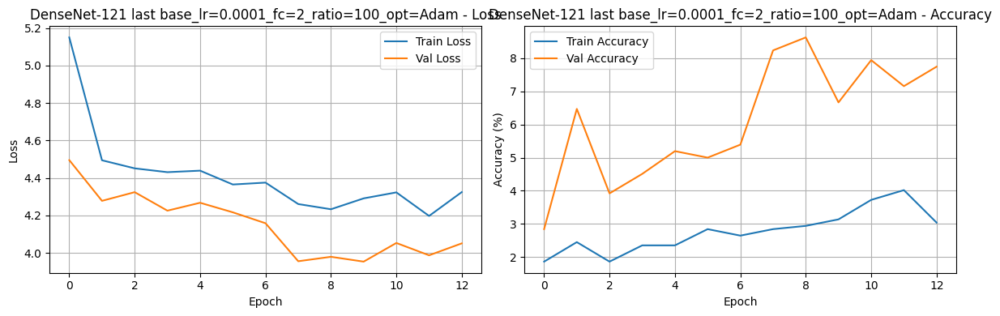

,base_lr,ratio,fc_layers,optimizer,final_val_accuracy,test_accuracy,final_train_loss,final_train_accuracy,final_val_loss
0,0.0010,10,1,SGD,88.529412,85.314685,0.034688,100.000000,0.575557
1,0.0010,10,1,Adam,87.058824,85.623679,0.005099,100.000000,0.489129
2,0.0010,100,1,SGD,86.274510,83.363148,0.002113,100.000000,0.673139
3,0.0010,100,1,Adam,62.156863,59.521873,1.384275,91.568627,9.342328
4,0.0010,10,2,SGD,85.882353,82.956578,0.091717,99.019608,0.552012
5,0.0010,10,2,Adam,11.568627,8.603025,4.060301,4.411765,3.677770
6,0.0010,100,2,SGD,3.333333,4.716214,4.603684,1.960784,4.544493
7,0.0010,100,2,Adam,0.980392,3.756708,4.685461,0.294118,4.632528
8,0.0001,10,1,SGD,86.078431,83.216783,0.477683,99.313725,1.072542
9,0.0001,10,1,Adam,88.333333,85.656204,0.024575,100.000000,0.560358


In [41]:
Optimizers = [
    lambda model, base_lr, ratio: optim.SGD(get_parameter_groups(model, base_lr, ratio), momentum=0.9),
    lambda model, base_lr, ratio: optim.Adam(get_parameter_groups(model, base_lr, ratio))

]
optimizer_names = ['SGD','Adam']
LRs = [0.001, 0.0001]
FCs = [1, 2]
Ratios = [10, 100]
all_results = []

for base_lr in LRs:
    for fc_layers in FCs:
        for ratio in Ratios:
            for opt_func, opt_name in zip(Optimizers, optimizer_names):
                dense121=models.densenet121
                model_name="DenseNet-121"
                trainable = "last"
                
                print(f"\nTraining {model_name} with {trainable} trainable parameters, "
                      f"base_lr={base_lr}, fc_layers={fc_layers}, ratio={ratio}, optimizer={opt_name}")
                
                # Load and modify model
                model = dense121(pretrained=True)
                model = modify_model(model, num_layers=fc_layers).to(device)
                
                # Set trainable layers
                set_trainable_layers(model, trainable,0)
                
                # Print model structure
                print_model_structure(model,base_lr,ratio)
                
                # Train model with specified optimizer
                optimizer = opt_func(model, base_lr, ratio)
                train_losses, train_accuracies, val_losses, val_accuracies = train_model(
                    model, trainloader, valloader,optimizer, num_epochs=40, patience=3, min_delta=0.001,
                base_lr=base_lr,ratio=ratio)
                
                # Evaluate on test set
                test_acc = evaluate_model(model, testloader)
                print(f'Test Accuracy: {test_acc:.2f}%')
                
                # Store results
                results = {
                    'train_losses': train_losses,
                    'train_accuracies': train_accuracies,
                    'val_losses': val_losses,
                    'val_accuracies': val_accuracies,
                    'final_val_accuracy': val_accuracies[-1],
                    'test_accuracy': test_acc,
                    'base_lr': base_lr,
                    'ratio': ratio,
                    'fc_layers': fc_layers,
                    'optimizer': opt_name
                }
                all_results.append(results)
                
                # Plot metrics
                plot_metrics(train_losses, val_losses, train_accuracies, val_accuracies,
                             f"{model_name} {trainable} base_lr={base_lr}_fc={fc_layers}_ratio={ratio}_opt={opt_name}")
results_df = pd.DataFrame([
    {
        'base_lr': res['base_lr'],
        'ratio': res['ratio'],
        'fc_layers': res['fc_layers'],
        'optimizer': res['optimizer'],
        'final_val_accuracy': res['final_val_accuracy'],
        'test_accuracy': res['test_accuracy'],
        'final_train_loss': res['train_losses'][-1],
        'final_train_accuracy': res['train_accuracies'][-1],
        'final_val_loss': res['val_losses'][-1]
    } for res in all_results
])
results_df

## Best Model

Total Trainable Parameters in Group 1: 5,655,296
Total Trainable Parameters in Group 2: 104,550
Total Frozen Parameters: 1,298,560
Epoch 1: Train Loss: 4.2597, Train Acc: 17.35%, Val Loss: 3.0490, Val Acc: 51.27%, 
Epoch 2: Train Loss: 1.9588, Train Acc: 79.31%, Val Loss: 1.6081, Val Acc: 78.24%, 
Epoch 3: Train Loss: 0.7985, Train Acc: 95.98%, Val Loss: 1.0063, Val Acc: 86.76%, 
Epoch 4: Train Loss: 0.3157, Train Acc: 99.71%, Val Loss: 0.7677, Val Acc: 88.53%, 
Epoch 5: Train Loss: 0.1456, Train Acc: 100.00%, Val Loss: 0.6355, Val Acc: 90.10%, 
Epoch 6: Train Loss: 0.0840, Train Acc: 100.00%, Val Loss: 0.5751, Val Acc: 89.90%, 
Epoch 7: Train Loss: 0.0583, Train Acc: 100.00%, Val Loss: 0.5292, Val Acc: 90.88%, 
Epoch 8: Train Loss: 0.0405, Train Acc: 100.00%, Val Loss: 0.5056, Val Acc: 90.59%, 
Epoch 9: Train Loss: 0.0303, Train Acc: 100.00%, Val Loss: 0.4880, Val Acc: 90.29%, 
Epoch 10: Train Loss: 0.0269, Train Acc: 100.00%, Val Loss: 0.4659, Val Acc: 91.08%, 
Epoch 11: Train Loss: 

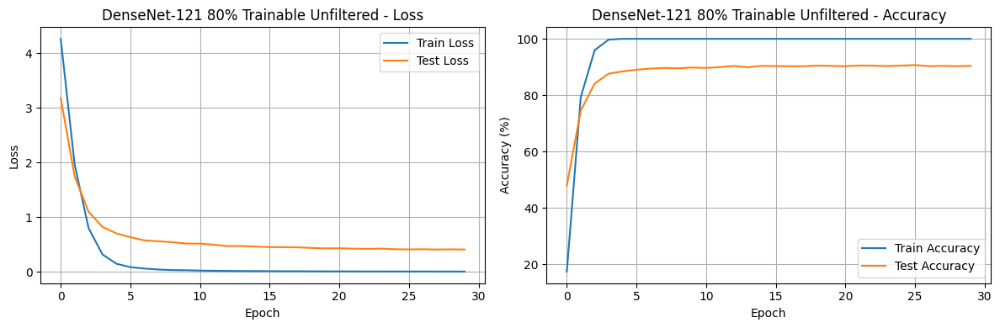

Test Accuracy: 90.40%


In [47]:
dense121=models.densenet121
trainable = "80%"
base_lr=0.0001
ratio=10
model = dense121(pretrained=True)
model = modify_model(model, num_layers=1).to(device)

set_trainable_layers(model, trainable,0)

print_model_structure(model,base_lr,ratio)
summary(model, input_size=(32, 3, 224, 224), col_names=["output_size", "num_params", "trainable"])
optimizer = optim.Adam(get_parameter_groups(model, base_lr, ratio))

train_losses, train_accuracies, val_losses, val_accuracies, test_losses, test_accuracies = train_model(
        model, trainloader, valloader, testloader,optimizer, num_epochs=40, patience=3, min_delta=0.005
    )
plot_metrics2(train_losses, train_accuracies,  test_losses, test_accuracies,
                 "DenseNet-121 80% Trainable Unfiltered")
# Evaluate on test set
test_acc = evaluate_model(model, testloader)
print(f'Test Accuracy: {test_acc:.2f}%')

# Phase2

## Functions

### Prepare Data

In [23]:
def load_data(filter_type=None, r=None, subset_size=1000):
    transform_train = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    transform_test = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    
    trainset = Flowers102(root='./data', split='train', download=True, transform=transform_train)
    valset = Flowers102(root='./data', split='val', download=True, transform=transform_test)
    testset = Flowers102(root='./data', split='test', download=True, transform=transform_test)
    
    # Subset training data to 1000 images
    if subset_size is not None:
        indices = random.sample(range(len(trainset)), subset_size)
        trainset = Subset(trainset, indices)
    
    # Apply frequency filter if specified
    if filter_type is not None:
        trainset = FilteredDataset(trainset, filter_type, r)
        valset = FilteredDataset(valset, filter_type, r)
        testset = FilteredDataset(testset, filter_type, r)
    
    trainloader = DataLoader(trainset, batch_size=32, shuffle=True, num_workers=0)
    valloader = DataLoader(valset, batch_size=32, shuffle=False, num_workers=0)
    testloader = DataLoader(testset, batch_size=32, shuffle=False, num_workers=0)
    
    return trainloader, valloader, testloader
class FilteredDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, filter_type, r):
        self.dataset = dataset
        self.filter_type = filter_type
        self.r = r
    
    def __len__(self):
        return len(self.dataset)
    
    def __getitem__(self, idx):
        img, label = self.dataset[idx]
        img = img.numpy()  # Convert to numpy for FFT
        img_filtered = apply_frequency_filter(img, self.filter_type, self.r)
        return torch.tensor(img_filtered, dtype=torch.float32), label

# Apply low-pass or high-pass filter using 2D FFT
def apply_frequency_filter(img, filter_type, r):
    img_filtered = np.zeros_like(img)
    for c in range(img.shape[0]):  # Apply to each channel
        # Perform 2D FFT
        f = fft2(img[c])
        fshift = np.fft.fftshift(f)
        
        # Create mask
        rows, cols = img[c].shape
        crow, ccol = rows // 2, cols // 2
        mask = np.zeros((rows, cols), dtype=np.uint8)
        
        # Circular mask for low-pass or high-pass
        y, x = np.ogrid[-crow:rows-crow, -ccol:cols-ccol]
        mask_area = x**2 + y**2 <= r**2
        if filter_type == 'low':
            mask[mask_area] = 1
        elif filter_type == 'high':
            mask[~mask_area] = 1
        
        # Apply mask and inverse FFT
        fshift_filtered = fshift * mask
        f_ishift = np.fft.ifftshift(fshift_filtered)
        img_back = ifft2(f_ishift)
        img_filtered[c] = np.abs(img_back)
    
    return img_filtered    

### plots

In [24]:
def plot_filtered_images(dataset, r_values, num_images=3):
    indices = random.sample(range(len(dataset)), num_images)
    for idx in indices:
        img, _ = dataset[idx]
        img = img.numpy()
        
        plt.figure(figsize=(5, 2 * len(r_values)))
        for i, r in enumerate(r_values):
            # Original image
            plt.subplot(len(r_values), 3, i * 3 + 1)
            plt.imshow(np.transpose(img, (1, 2, 0)))
            plt.title(f'Original (r={r})')
            plt.axis('off')
            
            # Low-pass filtered
            img_low = apply_frequency_filter(img, 'low', r)
            plt.subplot(len(r_values), 3, i * 3 + 2)
            plt.imshow(np.transpose(img_low, (1, 2, 0)))
            plt.title(f'Low-Pass (r={r})')
            plt.axis('off')
            
            # High-pass filtered
            img_high = apply_frequency_filter(img, 'high', r)
            plt.subplot(len(r_values), 3, i * 3 + 3)
            plt.imshow(np.transpose(img_high, (1, 2, 0)))
            plt.title(f'High-Pass (r={r})')
            plt.axis('off')
        
        plt.tight_layout()
        plt.savefig(f'filtered_images_idx_{idx}.png')
        plt.show()
        plt.close()
        
def plot_accuracy_vs_r(low_pass_accuracies, high_pass_accuracies, r_values):
    plt.figure(figsize=(8, 6))
    plt.plot(r_values, low_pass_accuracies, marker='o', label='Low-Pass')
    plt.plot(r_values, high_pass_accuracies, marker='s', label='High-Pass')
    plt.title('Test Accuracy vs. Filter Radius (r)')
    plt.xlabel('Radius (r)')
    plt.ylabel('Test Accuracy (%)')
    plt.legend()
    plt.grid(True)
    plt.savefig('accuracy_vs_r.png')
    plt.show()
    plt.close()        

## Applying low-pass high-pass filter

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

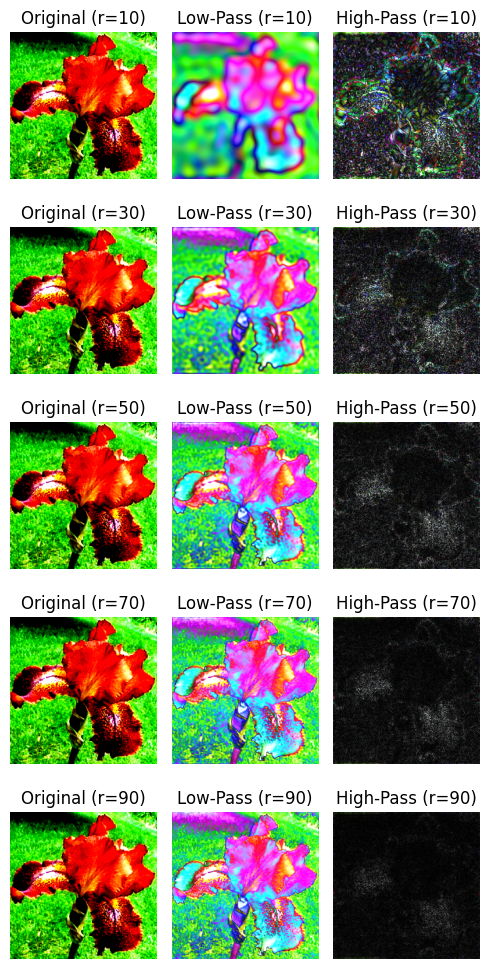

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

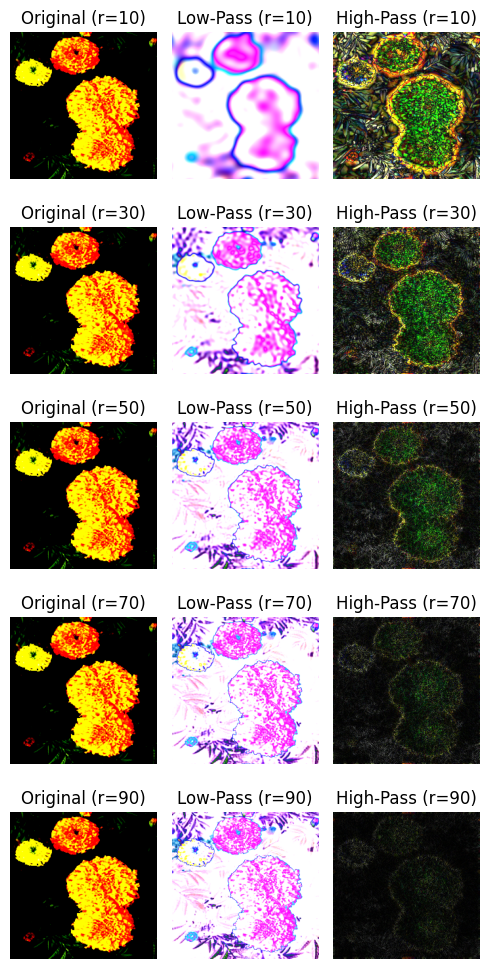

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

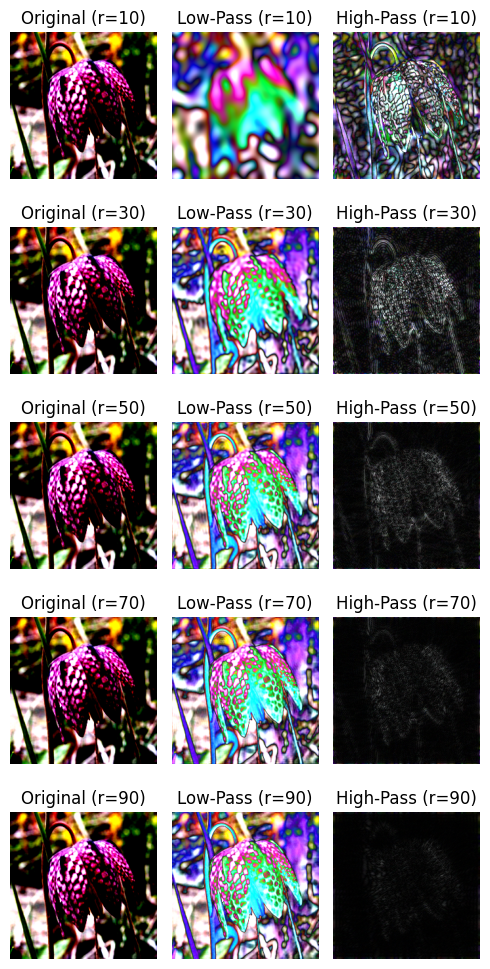

In [25]:
# Plot filtered images
trainloader, valloader, testloader = load_data(subset_size=1000)
r_values = [10, 30, 50, 70, 90]
plot_filtered_images(trainloader.dataset, r_values)

# Train models with filtered data
low_pass_accuracies = []
high_pass_accuracies = []
dense121=models.densenet121
trainable = "80%"
base_lr=0.0001
ratio=10

### Low-Pass


Training with low-pass filter, r=10
Epoch 1: Train Loss: 4.7716, Train Acc: 3.20%, Val Loss: 4.3032, Val Acc: 9.80%, 
Epoch 2: Train Loss: 3.4300, Train Acc: 35.00%, Val Loss: 3.5752, Val Acc: 22.84%, 
Epoch 3: Train Loss: 2.3897, Train Acc: 61.30%, Val Loss: 3.0638, Val Acc: 33.33%, 
Epoch 4: Train Loss: 1.5112, Train Acc: 84.00%, Val Loss: 2.7615, Val Acc: 37.16%, 
Epoch 5: Train Loss: 0.9418, Train Acc: 94.20%, Val Loss: 2.5560, Val Acc: 40.20%, 
Epoch 6: Train Loss: 0.5487, Train Acc: 98.40%, Val Loss: 2.4359, Val Acc: 43.63%, 
Epoch 7: Train Loss: 0.3205, Train Acc: 99.20%, Val Loss: 2.3645, Val Acc: 44.51%, 
Epoch 8: Train Loss: 0.1883, Train Acc: 99.90%, Val Loss: 2.3008, Val Acc: 45.10%, 
Epoch 9: Train Loss: 0.1214, Train Acc: 99.90%, Val Loss: 2.2715, Val Acc: 44.71%, 
Epoch 10: Train Loss: 0.0934, Train Acc: 100.00%, Val Loss: 2.2694, Val Acc: 44.90%, 
Epoch 11: Train Loss: 0.0677, Train Acc: 100.00%, Val Loss: 2.2599, Val Acc: 44.02%, 
Epoch 12: Train Loss: 0.0480, Train A

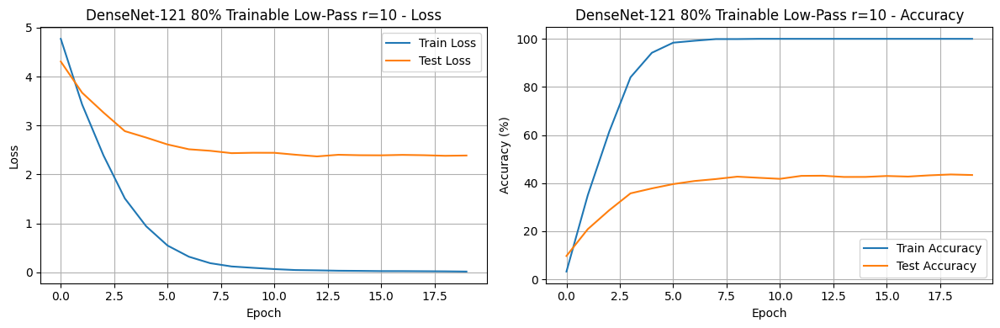


Training with low-pass filter, r=30
Epoch 1: Train Loss: 4.6429, Train Acc: 6.60%, Val Loss: 3.8810, Val Acc: 23.63%, 
Epoch 2: Train Loss: 2.8374, Train Acc: 55.40%, Val Loss: 2.7426, Val Acc: 52.16%, 
Epoch 3: Train Loss: 1.5555, Train Acc: 86.00%, Val Loss: 2.0503, Val Acc: 63.53%, 
Epoch 4: Train Loss: 0.7989, Train Acc: 95.90%, Val Loss: 1.6726, Val Acc: 70.10%, 
Epoch 5: Train Loss: 0.3830, Train Acc: 99.40%, Val Loss: 1.5033, Val Acc: 69.80%, 
Epoch 6: Train Loss: 0.2111, Train Acc: 99.90%, Val Loss: 1.3729, Val Acc: 72.65%, 
Epoch 7: Train Loss: 0.1360, Train Acc: 99.80%, Val Loss: 1.3241, Val Acc: 72.35%, 
Epoch 8: Train Loss: 0.0861, Train Acc: 100.00%, Val Loss: 1.2509, Val Acc: 73.14%, 
Epoch 9: Train Loss: 0.0639, Train Acc: 100.00%, Val Loss: 1.2085, Val Acc: 73.04%, 
Epoch 10: Train Loss: 0.0466, Train Acc: 100.00%, Val Loss: 1.1966, Val Acc: 73.43%, 
Epoch 11: Train Loss: 0.0412, Train Acc: 100.00%, Val Loss: 1.1858, Val Acc: 72.94%, 
Epoch 12: Train Loss: 0.0339, Trai

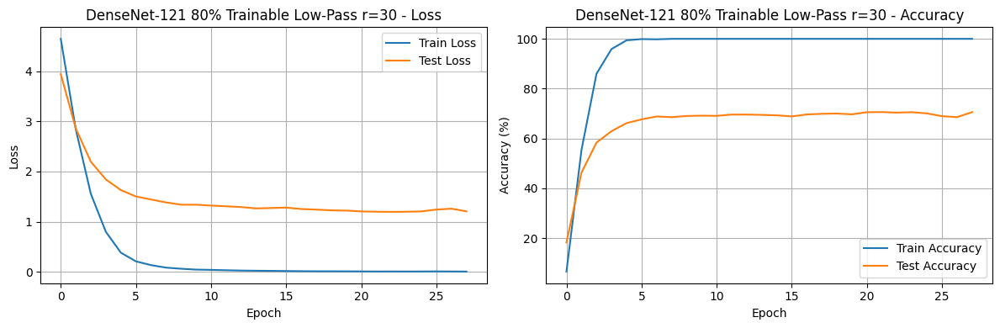


Training with low-pass filter, r=50
Epoch 1: Train Loss: 4.5194, Train Acc: 7.90%, Val Loss: 3.5902, Val Acc: 30.98%, 
Epoch 2: Train Loss: 2.5509, Train Acc: 64.10%, Val Loss: 2.3842, Val Acc: 58.53%, 
Epoch 3: Train Loss: 1.3113, Train Acc: 90.70%, Val Loss: 1.6750, Val Acc: 72.06%, 
Epoch 4: Train Loss: 0.6074, Train Acc: 98.00%, Val Loss: 1.3278, Val Acc: 75.69%, 
Epoch 5: Train Loss: 0.2987, Train Acc: 99.20%, Val Loss: 1.1441, Val Acc: 78.82%, 
Epoch 6: Train Loss: 0.1604, Train Acc: 100.00%, Val Loss: 1.0607, Val Acc: 78.63%, 
Epoch 7: Train Loss: 0.0990, Train Acc: 99.90%, Val Loss: 0.9935, Val Acc: 78.92%, 
Epoch 8: Train Loss: 0.0628, Train Acc: 100.00%, Val Loss: 0.9531, Val Acc: 80.39%, 
Epoch 9: Train Loss: 0.0499, Train Acc: 100.00%, Val Loss: 0.9356, Val Acc: 80.00%, 
Epoch 10: Train Loss: 0.0688, Train Acc: 99.90%, Val Loss: 0.9042, Val Acc: 78.92%, 
Epoch 11: Train Loss: 0.0473, Train Acc: 100.00%, Val Loss: 0.9110, Val Acc: 79.71%, 
Epoch 12: Train Loss: 0.0312, Trai

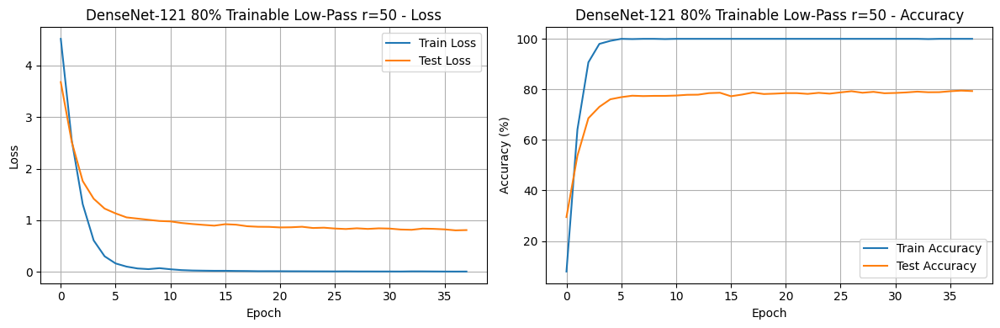


Training with low-pass filter, r=70
Epoch 1: Train Loss: 4.4448, Train Acc: 10.10%, Val Loss: 3.4946, Val Acc: 33.63%, 
Epoch 2: Train Loss: 2.4004, Train Acc: 66.20%, Val Loss: 2.2818, Val Acc: 61.18%, 
Epoch 3: Train Loss: 1.1746, Train Acc: 92.80%, Val Loss: 1.5586, Val Acc: 73.73%, 
Epoch 4: Train Loss: 0.5336, Train Acc: 98.90%, Val Loss: 1.2284, Val Acc: 79.22%, 
Epoch 5: Train Loss: 0.2603, Train Acc: 100.00%, Val Loss: 1.0925, Val Acc: 78.43%, 
Epoch 6: Train Loss: 0.1386, Train Acc: 100.00%, Val Loss: 1.0073, Val Acc: 80.29%, 
Epoch 7: Train Loss: 0.0819, Train Acc: 100.00%, Val Loss: 0.9448, Val Acc: 80.88%, 
Epoch 8: Train Loss: 0.0662, Train Acc: 100.00%, Val Loss: 0.9066, Val Acc: 80.78%, 
Epoch 9: Train Loss: 0.0467, Train Acc: 99.90%, Val Loss: 0.8673, Val Acc: 81.86%, 
Epoch 10: Train Loss: 0.0375, Train Acc: 100.00%, Val Loss: 0.8642, Val Acc: 80.69%, 
Epoch 11: Train Loss: 0.0315, Train Acc: 100.00%, Val Loss: 0.8254, Val Acc: 81.76%, 
Epoch 12: Train Loss: 0.0268, T

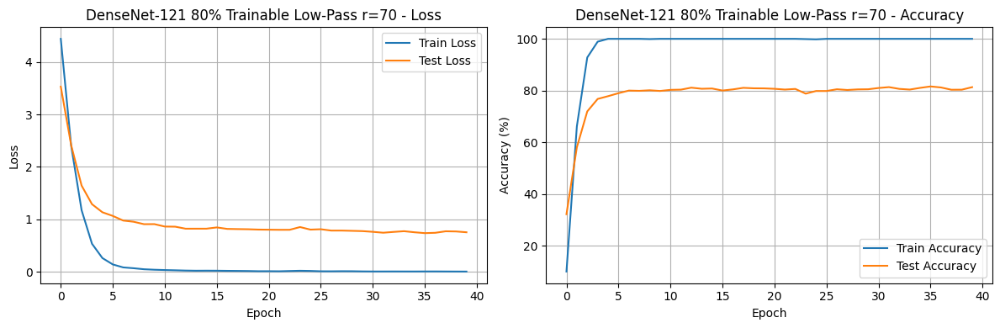


Training with low-pass filter, r=90
Epoch 1: Train Loss: 4.5037, Train Acc: 9.00%, Val Loss: 3.4253, Val Acc: 35.88%, 
Epoch 2: Train Loss: 2.4189, Train Acc: 68.40%, Val Loss: 2.2172, Val Acc: 66.18%, 
Epoch 3: Train Loss: 1.2206, Train Acc: 92.20%, Val Loss: 1.5200, Val Acc: 75.20%, 
Epoch 4: Train Loss: 0.5538, Train Acc: 98.80%, Val Loss: 1.2217, Val Acc: 80.69%, 
Epoch 5: Train Loss: 0.2704, Train Acc: 99.90%, Val Loss: 1.0460, Val Acc: 81.67%, 
Epoch 6: Train Loss: 0.1459, Train Acc: 100.00%, Val Loss: 0.9373, Val Acc: 82.75%, 
Epoch 7: Train Loss: 0.0978, Train Acc: 100.00%, Val Loss: 0.8859, Val Acc: 83.92%, 
Epoch 8: Train Loss: 0.0695, Train Acc: 100.00%, Val Loss: 0.8395, Val Acc: 84.02%, 
Epoch 9: Train Loss: 0.0503, Train Acc: 100.00%, Val Loss: 0.7923, Val Acc: 85.00%, 
Epoch 10: Train Loss: 0.0398, Train Acc: 100.00%, Val Loss: 0.7917, Val Acc: 84.12%, 
Epoch 11: Train Loss: 0.0302, Train Acc: 100.00%, Val Loss: 0.7760, Val Acc: 84.31%, 
Epoch 12: Train Loss: 0.0253, Tr

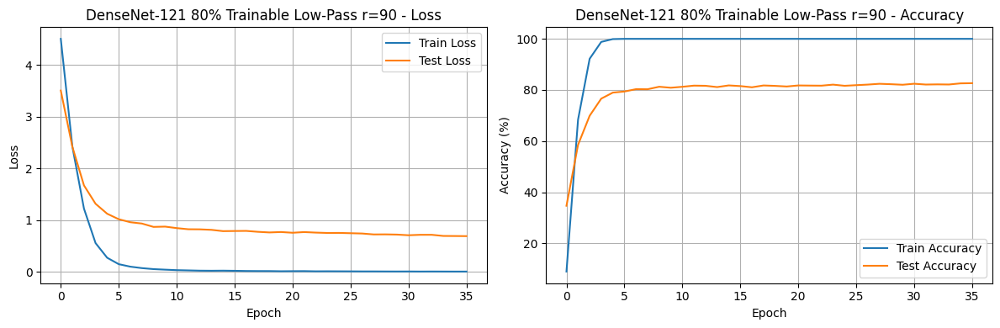

In [26]:
 for r in r_values:
        # Low-pass filter
        print(f"\nTraining with low-pass filter, r={r}")
        trainloader, valloader, testloader = load_data(filter_type='low', r=r, subset_size=1000)
        model = dense121(pretrained=True)
        model = modify_model(model, num_layers=1).to(device)
        set_trainable_layers(model, trainable,0)
        optimizer = optim.Adam(get_parameter_groups(model, base_lr, ratio))
        train_losses, train_accuracies, val_losses, val_accuracies, test_losses, test_accuracies = train_model(
        model, trainloader, valloader, testloader,optimizer, num_epochs=40, patience=5, min_delta=0.005)
     
        low_pass_accuracies.append(test_accuracies[-1])
        plot_metrics2(train_losses, train_accuracies, test_losses, test_accuracies,
                     f"DenseNet-121 80% Trainable Low-Pass r={r}")

### High-Pass


Training with high-pass filter, r=10
Epoch 1: Train Loss: 4.6028, Train Acc: 7.10%, Val Loss: 3.6914, Val Acc: 27.06%, 
Epoch 2: Train Loss: 2.7270, Train Acc: 59.70%, Val Loss: 2.5185, Val Acc: 52.75%, 
Epoch 3: Train Loss: 1.4955, Train Acc: 85.80%, Val Loss: 1.8241, Val Acc: 65.10%, 
Epoch 4: Train Loss: 0.7370, Train Acc: 95.90%, Val Loss: 1.4674, Val Acc: 71.37%, 
Epoch 5: Train Loss: 0.3735, Train Acc: 98.90%, Val Loss: 1.2712, Val Acc: 74.22%, 
Epoch 6: Train Loss: 0.2161, Train Acc: 100.00%, Val Loss: 1.1716, Val Acc: 74.02%, 
Epoch 7: Train Loss: 0.1216, Train Acc: 100.00%, Val Loss: 1.1143, Val Acc: 75.10%, 
Epoch 8: Train Loss: 0.0866, Train Acc: 100.00%, Val Loss: 1.0586, Val Acc: 75.10%, 
Epoch 9: Train Loss: 0.0619, Train Acc: 100.00%, Val Loss: 1.0314, Val Acc: 75.10%, 
Epoch 10: Train Loss: 0.0482, Train Acc: 100.00%, Val Loss: 1.0163, Val Acc: 76.18%, 
Epoch 11: Train Loss: 0.0412, Train Acc: 100.00%, Val Loss: 0.9999, Val Acc: 74.61%, 
Epoch 12: Train Loss: 0.0391, T

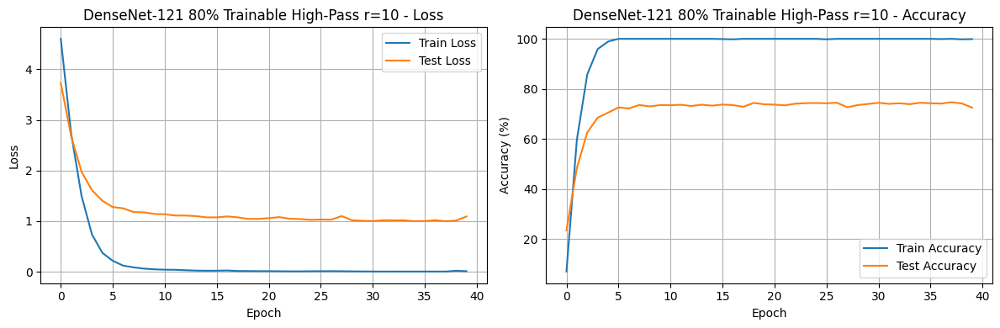


Training with high-pass filter, r=30
Epoch 1: Train Loss: 4.6230, Train Acc: 5.30%, Val Loss: 3.9347, Val Acc: 16.86%, 
Epoch 2: Train Loss: 2.8819, Train Acc: 55.30%, Val Loss: 2.7285, Val Acc: 49.61%, 
Epoch 3: Train Loss: 1.6420, Train Acc: 81.60%, Val Loss: 2.0611, Val Acc: 60.88%, 
Epoch 4: Train Loss: 0.9391, Train Acc: 92.40%, Val Loss: 1.6560, Val Acc: 65.00%, 
Epoch 5: Train Loss: 0.5139, Train Acc: 97.10%, Val Loss: 1.4692, Val Acc: 67.84%, 
Epoch 6: Train Loss: 0.2675, Train Acc: 99.40%, Val Loss: 1.3476, Val Acc: 69.31%, 
Epoch 7: Train Loss: 0.1744, Train Acc: 99.80%, Val Loss: 1.2709, Val Acc: 70.59%, 
Epoch 8: Train Loss: 0.1180, Train Acc: 99.90%, Val Loss: 1.2189, Val Acc: 71.27%, 
Epoch 9: Train Loss: 0.0817, Train Acc: 99.90%, Val Loss: 1.1933, Val Acc: 72.55%, 
Epoch 10: Train Loss: 0.0651, Train Acc: 100.00%, Val Loss: 1.1618, Val Acc: 71.37%, 
Epoch 11: Train Loss: 0.0530, Train Acc: 100.00%, Val Loss: 1.1324, Val Acc: 71.76%, 
Epoch 12: Train Loss: 0.0403, Train

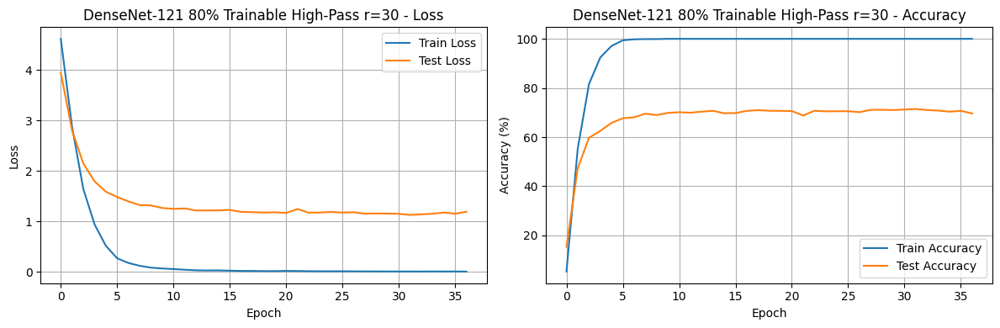


Training with high-pass filter, r=50
Epoch 1: Train Loss: 4.7523, Train Acc: 3.00%, Val Loss: 4.2843, Val Acc: 8.82%, 
Epoch 2: Train Loss: 3.2731, Train Acc: 37.10%, Val Loss: 3.2219, Val Acc: 35.29%, 
Epoch 3: Train Loss: 2.1183, Train Acc: 71.30%, Val Loss: 2.5849, Val Acc: 45.88%, 
Epoch 4: Train Loss: 1.3544, Train Acc: 86.00%, Val Loss: 2.2079, Val Acc: 52.45%, 
Epoch 5: Train Loss: 0.8371, Train Acc: 92.80%, Val Loss: 1.9972, Val Acc: 54.02%, 
Epoch 6: Train Loss: 0.4695, Train Acc: 98.10%, Val Loss: 1.8185, Val Acc: 57.55%, 
Epoch 7: Train Loss: 0.2675, Train Acc: 99.30%, Val Loss: 1.7560, Val Acc: 58.43%, 
Epoch 8: Train Loss: 0.1641, Train Acc: 99.50%, Val Loss: 1.6925, Val Acc: 59.41%, 
Epoch 9: Train Loss: 0.1318, Train Acc: 100.00%, Val Loss: 1.6585, Val Acc: 59.51%, 
Epoch 10: Train Loss: 0.1046, Train Acc: 99.80%, Val Loss: 1.6375, Val Acc: 60.39%, 
Epoch 11: Train Loss: 0.0731, Train Acc: 100.00%, Val Loss: 1.6112, Val Acc: 59.71%, 
Epoch 12: Train Loss: 0.0578, Train 

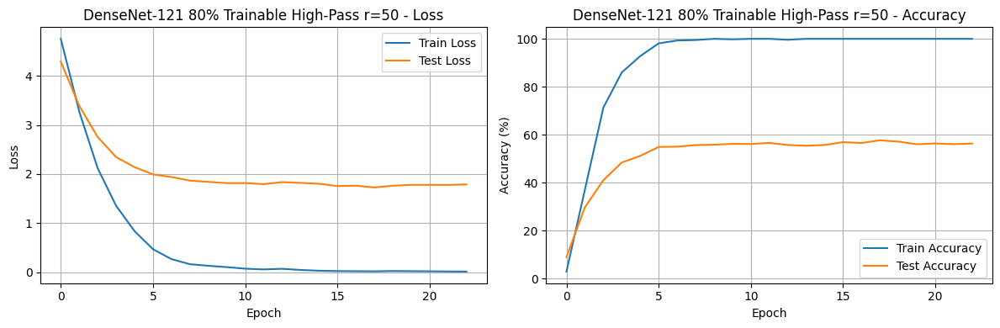


Training with high-pass filter, r=70
Epoch 1: Train Loss: 4.8147, Train Acc: 2.10%, Val Loss: 4.7602, Val Acc: 4.71%, 
Epoch 2: Train Loss: 3.5507, Train Acc: 28.30%, Val Loss: 3.6020, Val Acc: 23.43%, 
Epoch 3: Train Loss: 2.4810, Train Acc: 63.60%, Val Loss: 2.9989, Val Acc: 35.69%, 
Epoch 4: Train Loss: 1.6324, Train Acc: 80.40%, Val Loss: 2.6591, Val Acc: 41.37%, 
Epoch 5: Train Loss: 1.0616, Train Acc: 90.10%, Val Loss: 2.4033, Val Acc: 45.49%, 
Epoch 6: Train Loss: 0.6305, Train Acc: 95.20%, Val Loss: 2.2596, Val Acc: 46.96%, 
Epoch 7: Train Loss: 0.3805, Train Acc: 98.50%, Val Loss: 2.1487, Val Acc: 48.92%, 
Epoch 8: Train Loss: 0.2406, Train Acc: 99.40%, Val Loss: 2.0902, Val Acc: 50.29%, 
Epoch 9: Train Loss: 0.1539, Train Acc: 99.80%, Val Loss: 2.0603, Val Acc: 50.59%, 
Epoch 10: Train Loss: 0.1070, Train Acc: 100.00%, Val Loss: 2.0161, Val Acc: 50.49%, 
Epoch 11: Train Loss: 0.0819, Train Acc: 99.80%, Val Loss: 2.0096, Val Acc: 52.65%, 
Epoch 12: Train Loss: 0.0673, Train A

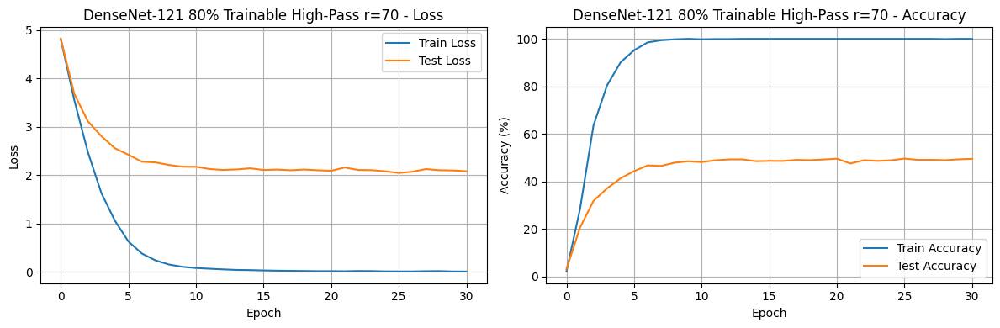


Training with high-pass filter, r=90
Epoch 1: Train Loss: 4.8359, Train Acc: 2.60%, Val Loss: 5.2302, Val Acc: 0.88%, 
Epoch 2: Train Loss: 3.6436, Train Acc: 28.30%, Val Loss: 3.8322, Val Acc: 19.31%, 
Epoch 3: Train Loss: 2.6076, Train Acc: 59.80%, Val Loss: 3.1755, Val Acc: 31.18%, 
Epoch 4: Train Loss: 1.8277, Train Acc: 78.20%, Val Loss: 2.8567, Val Acc: 36.67%, 
Epoch 5: Train Loss: 1.1760, Train Acc: 88.50%, Val Loss: 2.6375, Val Acc: 40.20%, 
Epoch 6: Train Loss: 0.7251, Train Acc: 94.90%, Val Loss: 2.4954, Val Acc: 41.96%, 
Epoch 7: Train Loss: 0.4353, Train Acc: 97.90%, Val Loss: 2.4091, Val Acc: 43.92%, 
Epoch 8: Train Loss: 0.2785, Train Acc: 99.70%, Val Loss: 2.3444, Val Acc: 45.49%, 
Epoch 9: Train Loss: 0.1846, Train Acc: 99.90%, Val Loss: 2.3128, Val Acc: 45.59%, 
Epoch 10: Train Loss: 0.1186, Train Acc: 99.80%, Val Loss: 2.2676, Val Acc: 47.55%, 
Epoch 11: Train Loss: 0.0915, Train Acc: 100.00%, Val Loss: 2.2491, Val Acc: 46.08%, 
Epoch 12: Train Loss: 0.0700, Train A

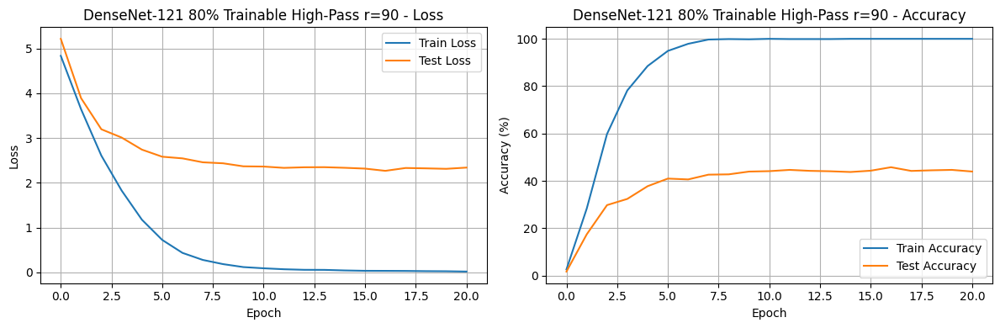

In [27]:
for r in r_values: 
        print(f"\nTraining with high-pass filter, r={r}")
        trainloader, valloader, testloader = load_data(filter_type='high', r=r, subset_size=1000)
        model = dense121(pretrained=True)
        model = modify_model(model, num_layers=1).to(device)
        set_trainable_layers(model, trainable,0)
        optimizer = optim.Adam(get_parameter_groups(model, base_lr, ratio))
        train_losses, train_accuracies, val_losses, val_accuracies, test_losses, test_accuracies = train_model(
        model, trainloader, valloader, testloader,optimizer, num_epochs=40, patience=5, min_delta=0.005)

        high_pass_accuracies.append(test_accuracies[-1])
        plot_metrics2(train_losses, train_accuracies, test_losses, test_accuracies,
                     f"DenseNet-121 80% Trainable High-Pass r={r}")

### plot

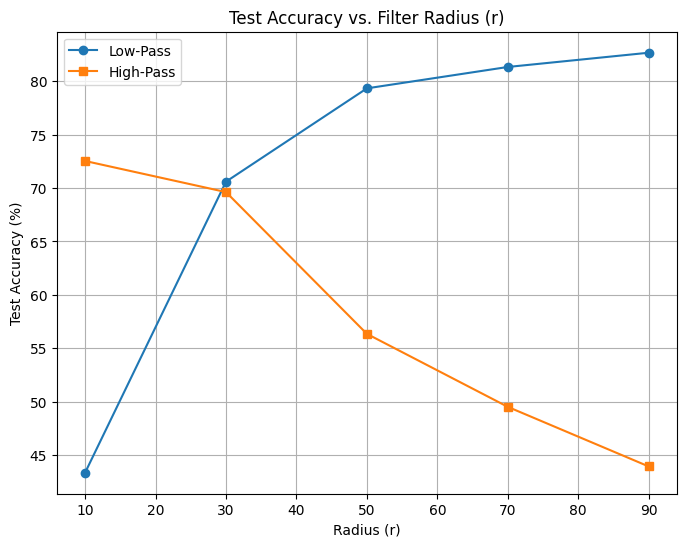

In [28]:
plot_accuracy_vs_r(low_pass_accuracies, high_pass_accuracies, r_values)


In [29]:
low_pass_accuracies

[43.35664335664335,
 70.59684501544967,
 79.32997235322817,
 81.33029760936738,
 82.66384778012684]

In [30]:
high_pass_accuracies

[72.53211904374695,
 69.62107659782079,
 56.35062611806798,
 49.5202471946658,
 43.94210440722069]